IMPORTING LIBRARIES

In [1]:
import os
import glob
from scipy import io
import scanpy as sc
import scanorama
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import numpy as np
import networkx as nx
import scrublet as scr
from scipy.io import mmread
import scipy.sparse as sp
from scipy.sparse import csr_matrix
from sklearn.metrics import jaccard_score
from upsetplot import UpSet, from_memberships
import harmonypy
import anndata
import gseapy as gp
from gseapy import ssgsea
import itertools
import seaborn as sns
from collections import defaultdict
from scipy.stats import kruskal
from sklearn.preprocessing import normalize
from sklearn.decomposition import NMF
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage
from itertools import combinations



THE DATASET (CLEANED RAW DATA FROM DECONTX)

In [2]:
# Loading matrix
matrix = io.mmread("../../cleaned_decontx_counts.mtx").tocsr()

# Loading barcodes (cells)
barcodes = pd.read_csv("../../cleaned_barcodes.txt", header=None)[0].tolist()

# Loading gene names
genes = pd.read_csv("../../cleaned_features.txt", header=None)[0].tolist()

# Create the AnnData object
adata = sc.AnnData(X=matrix.T)
adata.var_names = genes
adata.obs_names = barcodes

#check shape
print(adata.shape)
print(adata)
print(adata.var)

(143410, 39126)
AnnData object with n_obs × n_vars = 143410 × 39126
Empty DataFrame
Columns: []
Index: [GSM3635278_human_p1t1_5S_rRNA, GSM3635278_human_p1t1_5_8S_rRNA, GSM3635278_human_p1t1_7SK, GSM3635278_human_p1t1_A1BG, GSM3635278_human_p1t1_A1BG-AS1, GSM3635278_human_p1t1_A1CF, GSM3635278_human_p1t1_A2M, GSM3635278_human_p1t1_A2M-AS1, GSM3635278_human_p1t1_A2ML1, GSM3635278_human_p1t1_A2ML1-AS1, GSM3635278_human_p1t1_A2ML1-AS2, GSM3635278_human_p1t1_A3GALT2, GSM3635278_human_p1t1_A4GALT, GSM3635278_human_p1t1_A4GNT, GSM3635278_human_p1t1_AA06, GSM3635278_human_p1t1_AAAS, GSM3635278_human_p1t1_AACS, GSM3635278_human_p1t1_AADAC, GSM3635278_human_p1t1_AADACL2, GSM3635278_human_p1t1_AADACL2-AS1, GSM3635278_human_p1t1_AADACL3, GSM3635278_human_p1t1_AADACL4, GSM3635278_human_p1t1_AADAT, GSM3635278_human_p1t1_AAED1, GSM3635278_human_p1t1_AAGAB, GSM3635278_human_p1t1_AAK1, GSM3635278_human_p1t1_AAMDC, GSM3635278_human_p1t1_AAMP, GSM3635278_human_p1t1_AANAT, GSM3635278_human_p1t1_AAR2, GSM3

In [3]:
#Strip gene names to match appropriately with the data
adata.var_names = adata.var_names.str.replace(r"^GSM\d+_human_p\d+t\d+_", "", regex=True)

METADATA

In [4]:
meta = pd.read_csv("../GSE127465_human_cell_metadata_54773x25.tsv.gz", sep="\t")

In [5]:
# Keep the first occurrence of each barcode
meta = meta[~meta.index.duplicated(keep='first')]

Unique adata.obs_names: False
Unique meta index: True


In [6]:
adata = adata[~adata.obs_names.duplicated()].copy()

# Set index to Barcode for easy matching
meta = meta.set_index("Barcode")
meta = meta[~meta.index.duplicated(keep='first')]


# Ensure AnnData barcodes match metadata
shared_barcodes = adata.obs_names.intersection(meta.index)

# Subset AnnData to only cells with metadata
adata = adata[shared_barcodes].copy()

# Add metadata to AnnData.obs
adata.obs = adata.obs.join(meta, how='left')

# Check results
print(adata.shape)
print(adata.obs.columns)

# Convert to list and print all unique labels
unique_labels = adata.obs["Major cell type"].unique().tolist()
for label in unique_labels:
    print(label)

(36125, 39126)
Index(['Patient', 'Tissue', 'Barcoding emulsion', 'Library', 'Total counts',
       'Percent counts from mitochondrial genes', 'Most likely LM22 cell type',
       'Major cell type', 'Minor subset', 'used_in_NSCLC_all_cells',
       'x_NSCLC_all_cells', 'y_NSCLC_all_cells',
       'used_in_NSCLC_and_blood_immune', 'x_NSCLC_and_blood_immune',
       'y_NSCLC_and_blood_immune', 'used_in_NSCLC_immune', 'x_NSCLC_immune',
       'y_NSCLC_immune', 'used_in_NSCLC_non_immune', 'x_NSCLC_non_immune',
       'y_NSCLC_non_immune', 'used_in_blood', 'x_blood', 'y_blood'],
      dtype='object')
Patient1-specific
tMoMacDC
Fibroblasts
tMast cells
tT cells
bNeutrophils
tNeutrophils
tB cells
bT cells
tPlasma cells
bNK cells
tNK cells
bMonocytes
Ciliated cells
tpDC
Type II cells
Patient3-specific
Club cells
Patient5-specific
bRBC
Patient2-specific
Smooth muscle cells
Patient7-specific
Patient6-specific
tRBC
Endothelial cells
bB cells
bPlatelets
Patient4-specific
ND
bPlasma cells
bBasophils


In [8]:
#For the gene names
gene_map = pd.read_csv("../GSE127465_gene_names_human_41861.tsv.gz", compression='gzip', header=None, names=["gene_symbol"])

gene_symbols_in_adata = adata.var_names.astype(str)
gene_map_set = set(gene_map["gene_symbol"].astype(str))

# Which gene symbols in adata match the gene_map?
matched_genes = gene_symbols_in_adata.isin(gene_map_set)

# To check match rate
print(f"Matched {matched_genes.sum()} / {len(gene_symbols_in_adata)} genes")


adata.var["Gene"] = gene_symbols_in_adata.where(matched_genes, other="UNKNOWN")


Matched 39126 / 39126 genes


QUALITY CONTROL

In [9]:
print(f"Cells before filtering: {adata.shape[0]}")

Cells before filtering: 36125


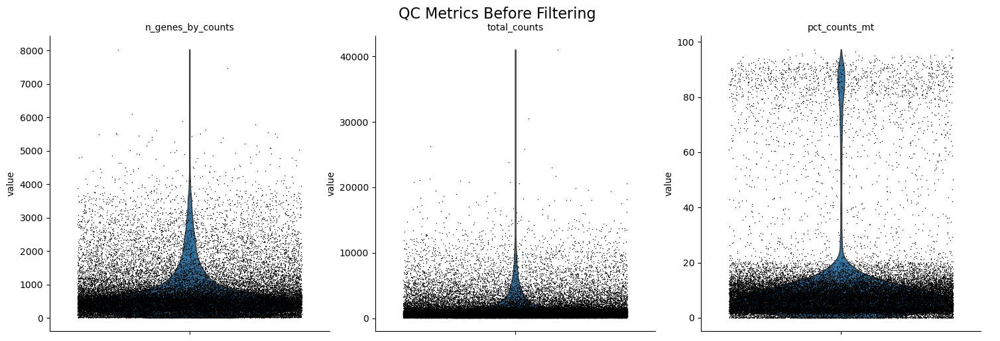

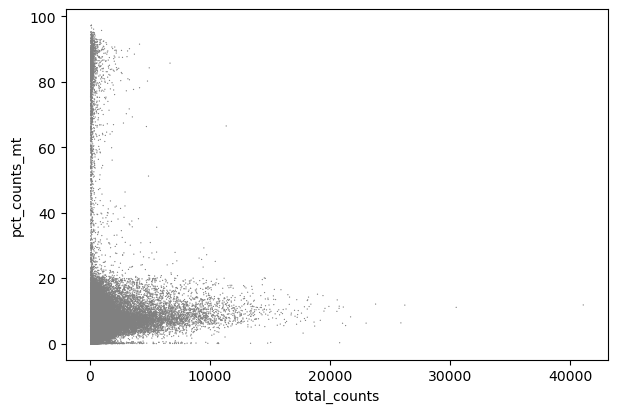

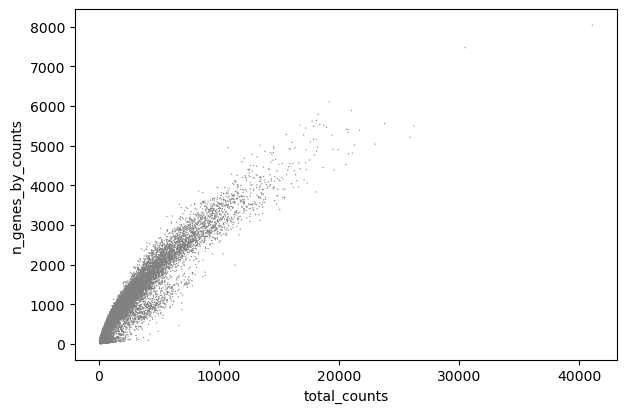

In [10]:
# Annotating mitochondrial genes for QC  
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
#Calculate its metrics for QC
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

#Plots for QC
# Violin plots
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True,
    show=False  # Prevents immediate display so you can modify the plot
)

plt.suptitle("QC Metrics Before Filtering", fontsize=16, y= 1.02)
plt.show()

# Scatter plots
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [11]:
# Annotate ribosomal genes (prefix RPS/RPL) for QC
adata.var['ribo'] = adata.var_names.str.match('^RP[SL]') 

# Recalculate QC metrics with ribosomal content included
sc.pp.calculate_qc_metrics(  
    adata,  
    qc_vars=['mt', 'ribo'],  
    percent_top=[50, 100, 200],  
    inplace=True  
)  
# Summary stats for QC features (check distributions before filtering)
print("Sanity check to inspect distributions before filtering")
adata.obs[['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo']].describe()

Sanity check to inspect distributions before filtering


,n_genes_by_counts,total_counts,pct_counts_mt,pct_counts_ribo
count,36125.000000,36125.000000,36125.000000,36125.000000
mean,714.625855,1599.782520,10.896776,12.739200
std,700.359545,2130.150726,16.288432,11.990514
min,7.000000,72.155406,0.000000,0.000000
25%,285.000000,462.551920,3.768242,0.953530
50%,513.000000,876.965797,7.078583,9.674737
75%,849.000000,1704.840319,10.797000,22.361457
max,8036.000000,41069.578949,97.287776,69.836023


In [12]:
# Set minimum gene thresholds depending on cell type
# (immune cells stricter than epithelial/stromal)
adata.obs['min_genes'] = np.where(  
    adata.obs['Major cell type'].isin(['tT cells', 'tB cells', 'tNK cells']),  
    500,  # Immune cells require stricter filters  
    200   # Others (epithelial, stromal)  
)  

# Set maximum mitochondrial % thresholds by lineage
adata.obs['max_mt'] = np.where(  
    adata.obs['Major cell type'].str.contains('tT cells|tB cells'),  
    15,  # Lymphoid- strict  
    np.where(  
        adata.obs['Major cell type'].str.contains('tMoMacDC'),  
        25,  # Myeloid- moderate  
        25   # Epithelial/stroma- lenient  
    )  
)  

# Apply QC filters:
# - min genes by type
# - mitochondrial % by type
# - total counts < 30k (remove doublets/artefacts)
qc_mask = (  
    (adata.obs['n_genes_by_counts'] >= adata.obs['min_genes']) &  
    (adata.obs['pct_counts_mt'] < adata.obs['max_mt']) &  
    (adata.obs['total_counts'] < 30000)  # Remove potential doublets/megakaryocytes  
)  
adata = adata[qc_mask].copy()  
sc.pp.filter_genes(adata, min_cells=3)

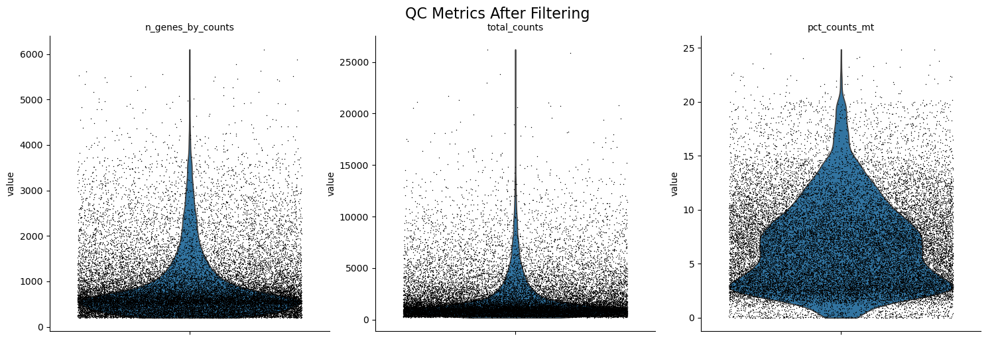

In [13]:
# Plot QC metrics after filtering
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True,
    show=False  
)

plt.suptitle("QC Metrics After Filtering", fontsize=16, y= 1.02)
plt.show()

In [14]:
print(f"Cells after filtering: {adata.shape[0]}")

Cells after filtering: 26066


Following quality control, a total of 26,066 cells were retained from an initial 36,125 cells, corresponding to the removal of ~28% of cells that did not meet gene count, mitochondrial transcript, or doublet thresholds.

DOUBLET DETECTION

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.57
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 22.5%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 0.3%
Elapsed time: 41.9 seconds


findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeOneSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeTwoSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeThreeSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFourSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFiveSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmsy10'] not

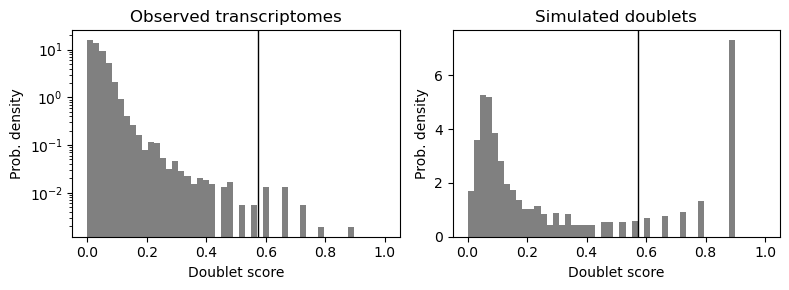

Predicted doublets: 19 / 26066 (0.07%)


In [15]:
counts_matrix = adata.raw.X if adata.raw is not None else adata.X
counts_matrix = counts_matrix.toarray() if hasattr(counts_matrix, 'toarray') else counts_matrix

#Run Scrublet
scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets()

# Adding results to AnnData
adata.obs['doublet_score'] = doublet_scores
adata.obs['predicted_doublet'] = predicted_doublets

#Doublet score histogram
scrub.plot_histogram()
plt.show()

print(f"Predicted doublets: {sum(predicted_doublets)} / {len(predicted_doublets)} ({np.mean(predicted_doublets)*100:.2f}%)")
adata = adata[~adata.obs['predicted_doublet'], :].copy()

In [16]:
print(f"Cells after doublet removal: {adata.obs.shape[0]}")
print(f"Genes after doublet removal: {adata.var.shape[0]}")

Cells after doublet removal: 26047
Genes after doublet removal: 35008


PREPROCESSING

In [17]:
adata_copy = adata.copy()

# Normalize counts per cell to 10,000 and log-transform
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Identify highly variable genes (HVGs) to capture informative variation
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]
#Not running scaling here as it can distort the data for some analyses (ie., NMF)

# Exclude mitochondrial and ribosomal genes from HVGs to avoid technical bias
hvg_mask = adata.var['highly_variable'] & ~adata.var['mt'] & ~adata.var['ribo'] 

In [18]:

adata_hvg = adata[:, hvg_mask].copy()

# Dimensionality reduction via PCA
sc.tl.pca(adata, svd_solver='arpack')

# Build neighbor graph and compute UMAP (before batch correction) for visualization
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_pca')
sc.tl.umap(adata)

# Save the raw UMAP embedding before correction
adata.obsm['X_umap_raw'] = adata.obsm['X_umap'].copy()

c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\preprocessing\_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
print(f"Cells after mt/ribo removal: {adata.obs.shape[0]}")
print(f"Genes after mt/ribo removal: {adata.var.shape[0]}")

Cells after mt/ribo removal: 26047
Genes after mt/ribo removal: 5897


To check markers provided cell annotation

In [20]:
adata.obs['Major cell type'].value_counts()


Major cell type
bNeutrophils               7563
tMoMacDC                   4800
tT cells                   2608
tB cells                   1898
tNeutrophils               1699
bT cells                   1573
bNK cells                  1226
tPlasma cells               980
Patient1-specific           893
tMast cells                 399
Patient5-specific           381
Fibroblasts                 310
bMonocytes                  273
Patient3-specific           271
Patient7-specific           189
Type II cells               163
tpDC                        130
Patient6-specific           108
Patient4-specific            99
tNK cells                    97
bPlatelets                   79
bB cells                     69
Smooth muscle cells          57
Endothelial cells            46
Club cells                   41
Patient2-specific            24
ND                           16
Type I cells                 13
bRBC                         13
Ciliated cells                7
bpDC                    

c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:440: Performanc

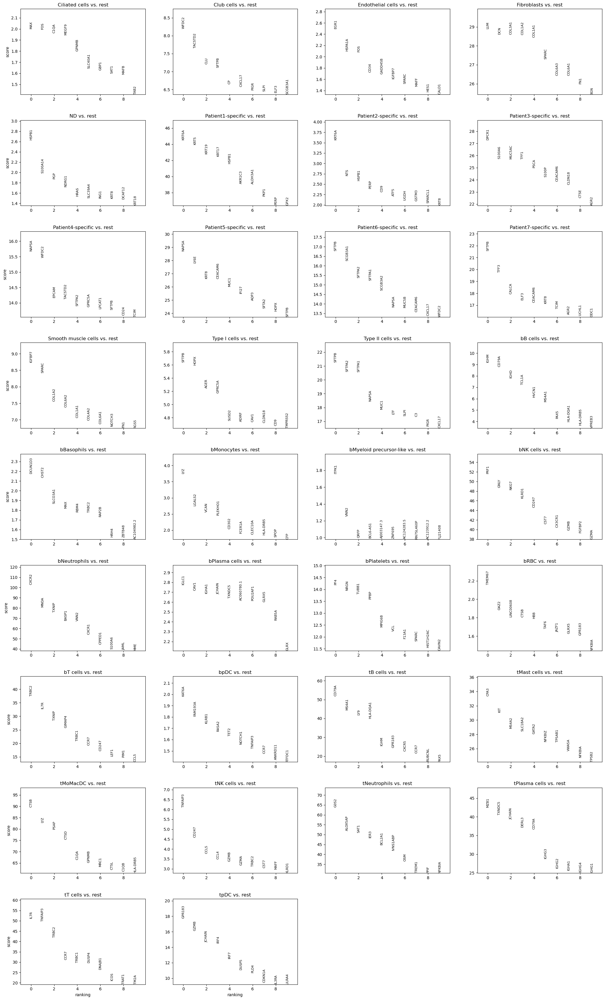

In [23]:
#Running this as without the filtering, some groups have too few cells for DE testing
min_cells = 3
cell_counts = adata.obs["Major cell type"].value_counts()
valid_types = cell_counts[cell_counts >= min_cells].index
adata_filtered = adata[adata.obs["Major cell type"].isin(valid_types)].copy()

# running DE test
sc.tl.rank_genes_groups(adata_filtered, groupby="Major cell type", method="wilcoxon")
sc.pl.rank_genes_groups(adata_filtered, n_genes=10, sharey=False)


Found 5897 genes among all datasets
[[0.         0.84034268 0.61002179 0.77723735 0.88119326 0.71884984
  0.66377351]
 [0.         0.         0.51706609 0.53793774 0.29468223 0.39616613
  0.51168224]
 [0.         0.         0.         0.50689906 0.14088598 0.4204793
  0.51053014]
 [0.         0.         0.         0.         0.23005837 0.68498403
  0.74902724]
 [0.         0.         0.         0.         0.         0.27795527
  0.52399481]
 [0.         0.         0.         0.         0.         0.
  0.74696486]
 [0.         0.         0.         0.         0.         0.
  0.        ]]
Processing datasets (0, 4)
Processing datasets (0, 1)
Processing datasets (0, 3)
Processing datasets (3, 6)
Processing datasets (5, 6)
Processing datasets (0, 5)
Processing datasets (3, 5)
Processing datasets (0, 6)
Processing datasets (0, 2)
Processing datasets (1, 3)
Processing datasets (4, 6)
Processing datasets (1, 2)
Processing datasets (1, 6)
Processing datasets (2, 6)
Processing datasets (2, 3)
P

C:\Users\user\AppData\Local\Temp\ipykernel_28144\414314991.py:17: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_integrated = batches[0].concatenate(batches[1:], batch_key="Patient", batch_categories=batch_labels)


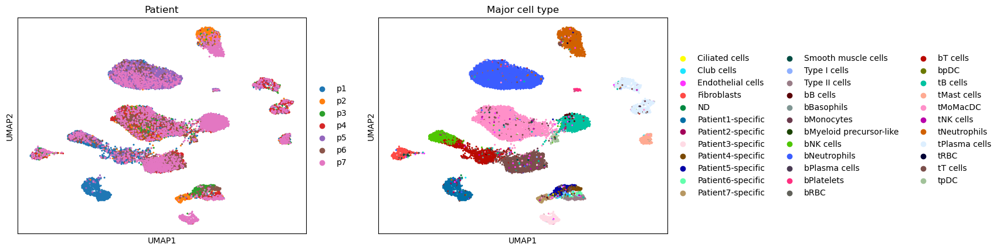

In [24]:

# Prepared list of AnnData objects split by batch
batches = []
batch_labels = adata.obs['Patient'].unique()

for b in batch_labels:
    ad = adata[adata.obs['Patient'] == b].copy()
    X = ad.X
    if hasattr(X, "toarray"):  # sparse matrix check
        X = X.tocsr()
    ad.X = X  # replace with CSR format
    batches.append(ad)

# Running Scanorama integration (modifies batches in-place)
scanorama.integrate_scanpy(batches, dimred=50)

# Concatenated the batch-corrected AnnData objects
adata_integrated = batches[0].concatenate(batches[1:], batch_key="Patient", batch_categories=batch_labels)

# The integrated embedding is in .obsm['X_scanorama']
sc.pp.neighbors(adata_integrated, use_rep='X_scanorama')
sc.tl.umap(adata_integrated)
sc.pl.umap(adata_integrated, color=['Patient', 'Major cell type'], size=20)

SUBSET- TUMOR CELLS

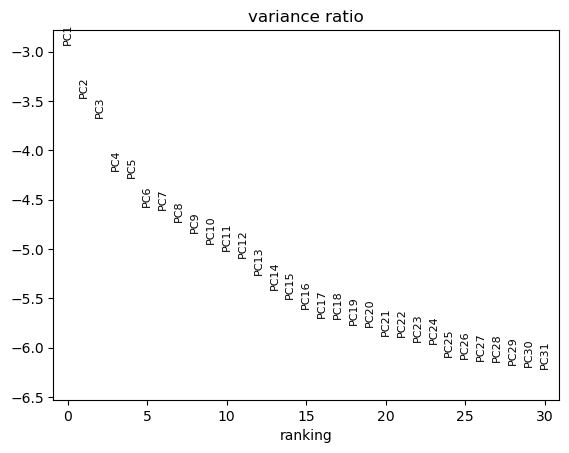

In [25]:
tumor_cells = adata_integrated[adata_integrated.obs['Tissue'] == 'tumor'].copy()


#PCA (recommended before neighbors & clustering)
sc.tl.pca(tumor_cells, svd_solver='arpack')
sc.pl.pca_variance_ratio(tumor_cells, log=True)


C:\Users\user\AppData\Local\Temp\ipykernel_28144\3656808532.py:4: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(tumor_cells, resolution=1.0, key_added=f'leiden_{n}_{pcs}')


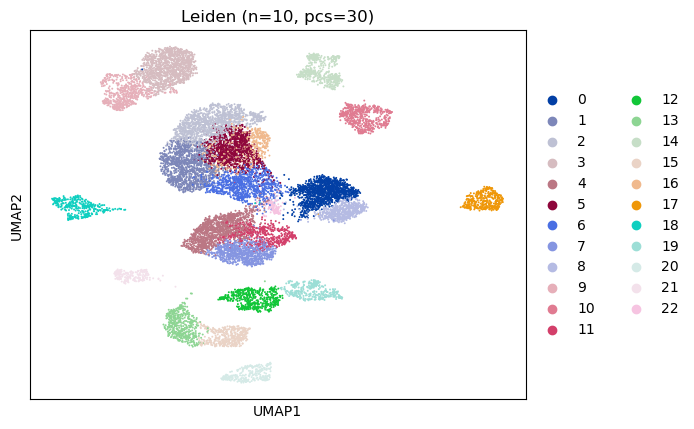

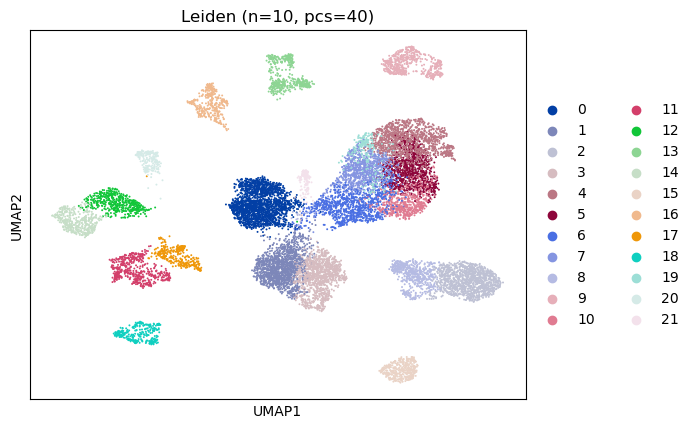

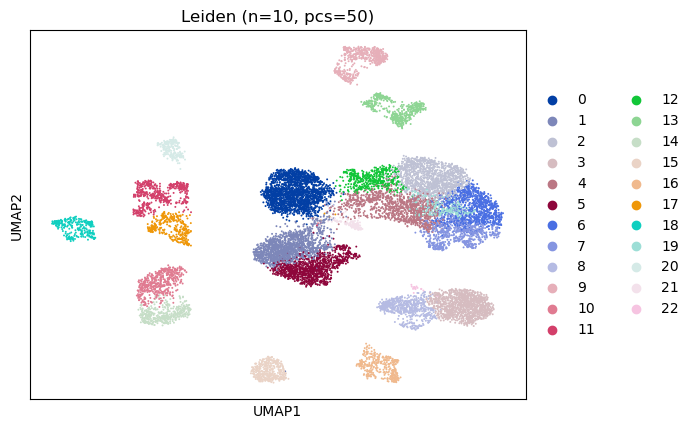

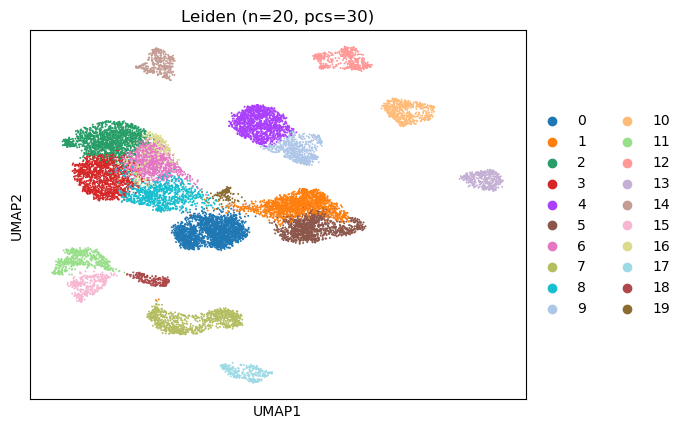

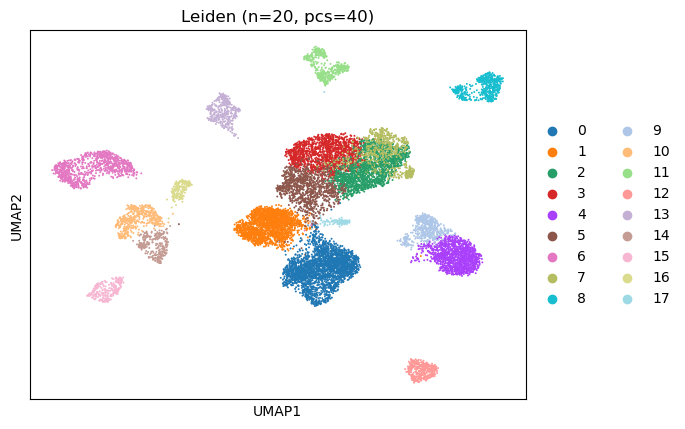

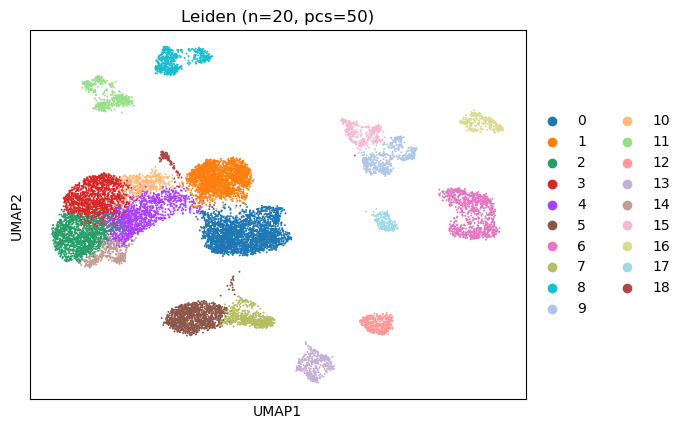

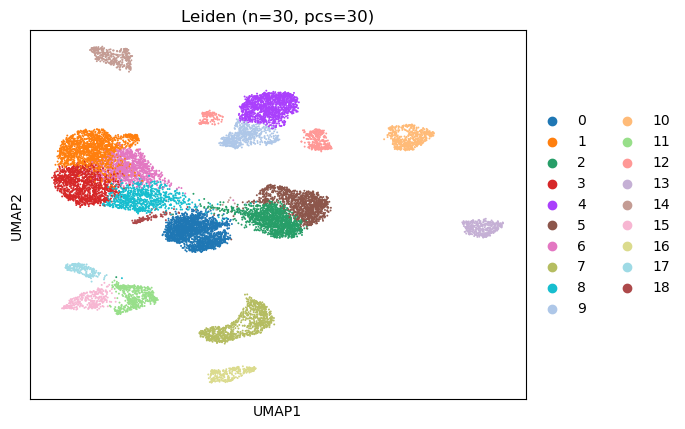

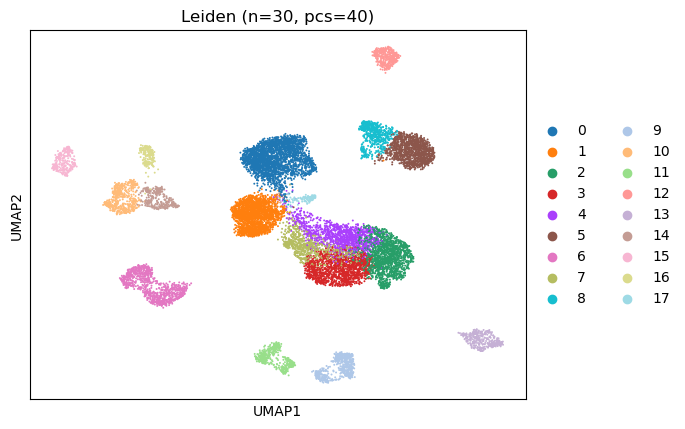

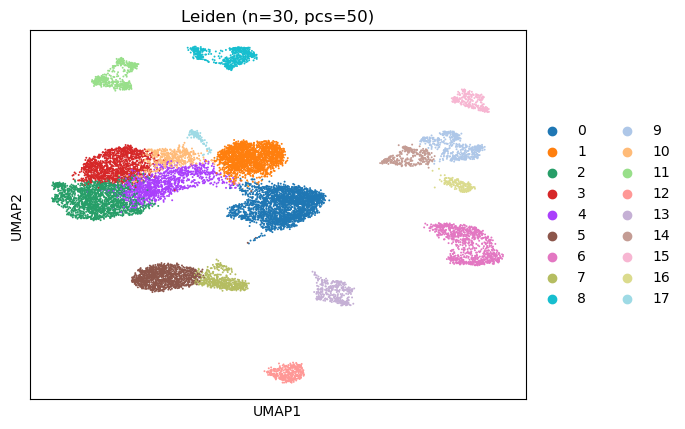

In [26]:
for n in [10, 20, 30]:
    for pcs in [30, 40, 50]:
        sc.pp.neighbors(tumor_cells, n_neighbors=n, n_pcs=pcs)
        sc.tl.leiden(tumor_cells, resolution=1.0, key_added=f'leiden_{n}_{pcs}')
        sc.tl.umap(tumor_cells)
        sc.pl.umap(tumor_cells, color=f'leiden_{n}_{pcs}', title=f'Leiden (n={n}, pcs={pcs})')

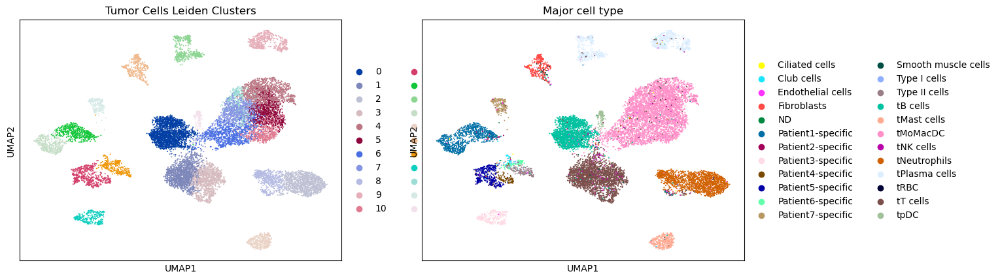

In [27]:


#Compute neighbors graph based on PCA space
sc.pp.neighbors(tumor_cells, n_neighbors=10, n_pcs=40)

#Run Leiden clustering
sc.tl.leiden(tumor_cells, resolution=1.0)  

#Compute UMAP for visualization
sc.tl.umap(tumor_cells)


#Plot UMAP colored by Leiden clusters
sc.pl.umap(tumor_cells, color=['leiden', 'Major cell type'], title='Tumor Cells Leiden Clusters')

In [28]:
#Table of cell types in tumor cells
tumor_cells.obs['Major cell type'].value_counts()

Major cell type
tMoMacDC               4800
tT cells               2608
tB cells               1898
tNeutrophils           1699
tPlasma cells           980
Patient1-specific       893
tMast cells             399
Patient5-specific       381
Fibroblasts             310
Patient3-specific       271
Patient7-specific       189
Type II cells           163
tpDC                    130
Patient6-specific       108
Patient4-specific        99
tNK cells                97
Smooth muscle cells      57
Endothelial cells        46
Club cells               41
Patient2-specific        24
ND                       16
Type I cells             13
Ciliated cells            7
tRBC                      1
Name: count, dtype: int64

In [29]:
#Crosstab of Leiden clusters vs Major cell type ( to get a reliable leiden cluster identity)
tumor_crosstab = pd.crosstab(tumor_cells.obs["leiden"], tumor_cells.obs["Major cell type"])
print(tumor_crosstab)

Major cell type  Ciliated cells  Club cells  Endothelial cells  Fibroblasts  \
leiden                                                                        
0                             0           0                  7            0   
1                             0           0                  7            1   
2                             0           0                  3            1   
3                             0           0                  3            0   
4                             1           0                  2            0   
5                             0           0                  1            0   
6                             0           0                  3            0   
7                             1           1                  2            0   
8                             1           0                  4            0   
9                             1           0                  1            0   
10                            0           0         

c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:440: Performanc

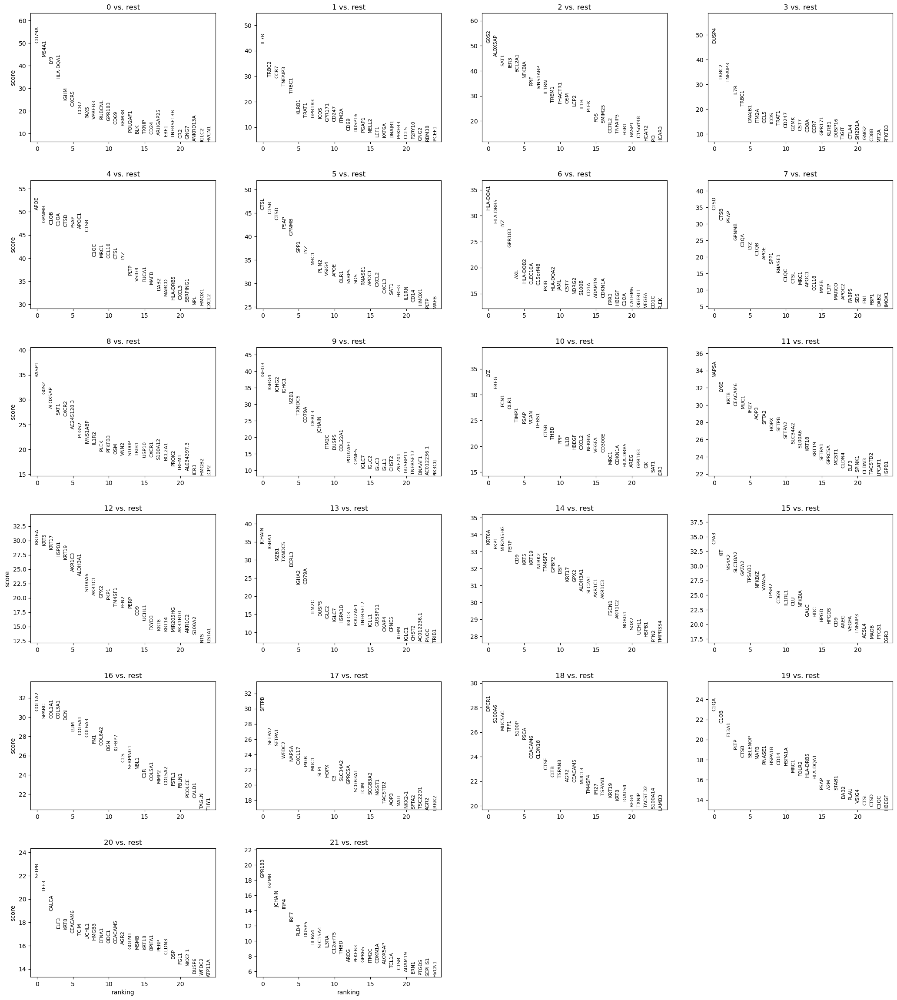

In [30]:
# Differential expression within tumor cells by Leiden clusters
sc.tl.rank_genes_groups(tumor_cells, groupby='leiden', method='wilcoxon', n_genes=100)
sc.pl.rank_genes_groups(tumor_cells, n_genes = 25, sharey=False)

In [31]:
# Extract top 50 marker genes per cluster
marker_genes = {}

for cluster in tumor_cells.obs['leiden'].unique():
    genes = tumor_cells.uns['rank_genes_groups']['names'][cluster][:50]  # top 50 genes
    marker_genes[cluster] = genes

marker_genes

{'14': array(['KRT6A', 'PKP1', 'MIR205HG', 'PERP', 'CD9', 'KRT5', 'KRT19',
        'NTRK2', 'TM4SF1', 'IGFBP2', 'DSP', 'KRT17', 'GPX2', 'ALDH3A1',
        'SLC2A1', 'AKR1C1', 'AKR1C3', 'FSCN1', 'AKR1C2', 'NDRG1', 'SOX2',
        'UCHL1', 'HSPB1', 'PFN2', 'TMPRSS4', 'MAGEA4', 'MAP1B', 'EFNA1',
        'KLF5', 'CDH1', 'KRT8', 'SFN', 'CAV2', 'COL17A1', 'SERPINB5',
        'FXYD3', 'NDUFA4L2', 'KRT15', 'TPD52L1', 'HES1', 'ODC1', 'GPC3',
        'LAD1', 'RAB6B', 'RAP2B', 'PHLDB2', 'CD24', 'B4GALT4', 'IRF6',
        'CLDN7'], dtype=object),
 '5': array(['CTSL', 'CTSB', 'CTSD', 'PSAP', 'GPNMB', 'SPP1', 'LYZ', 'MRC1',
        'PLIN2', 'VSIG4', 'APOE', 'OLR1', 'FABP5', 'SDS', 'RNASE1',
        'APOC1', 'CXCL2', 'CXCL3', 'SAT1', 'EREG', 'IL1RN', 'CD14',
        'HMOX1', 'PLTP', 'MAFB', 'PPIF', 'FBP1', 'MARCO', 'DAB2', 'BASP1',
        'FPR3', 'NPL', 'C1QA', 'NFKBIA', 'TIMP1', 'RAB20', 'GK', 'MMP9',
        'C1QB', 'CD9', 'PLEK', 'C15orf48', 'THBD', 'SMIM25', 'MT2A',
        'C3AR1', 'CALM3', 'CD

Leiden 0 – Naive/Memory B Cell Progra
Leiden 1 – CD8⁺ Effector/Memory T Cell Program
Leiden 2 – NF-κB–Driven Inflammatory Monocyte Program
Leiden 3 – CD8⁺ Cytotoxic T Cell Program
Leiden 4 – C1Q⁺ Immunosuppressive TAM Program
Leiden 5 – Phagocytic TAM-like Tumor Program
Leiden 6 – CD1C⁺ Conventional Dendritic Cell Program
Leiden 7 – C1Q⁺ Immunosuppressive TAM Program
Leiden 8 – CXCR2⁺ Stress-Primed Inflammatory Neutrophil Program
Leiden 9 – IGHG⁺ Mature Plasma Cell Program
Leiden 10 – Inflammatory Response Tumor Program
Leiden 11 – Secretory Epithelium / Club Cell Program
Leiden 12 – Basal-like Proliferative Tumor Program
Leiden 13 – IGHA⁺ Secretory Plasma Cell Program
Leiden 14 – Basal-like Proliferative Tumor Program
Leiden 15 – CPA3⁺ Degranulating Mast Cell Progra
Leiden 16 – Mesenchymal ECM-Remodeling Tumor Program
Leiden 17 – Alveolar-like Secretory Epithelium Program
Leiden 18 – Goblet-like Mucinous Epithelium Program
Leiden 20 – Proliferative Secretory Epithelium Program
Leiden 19 – C1Q⁺ Immunosuppressive TAM Program
Leiden 20 – Proliferative Secretory Epithelium Program
Leiden 21 – LILRA4⁺ Plasmacytoid Dendritic Cell Program


SUBSET- IMMUNE CELLS

In [32]:
# Define immune cell categories based on Major cell type
immune_types = [
    'tT cells', 'bT cells', 
    'tB cells', 'bB cells', 
    'tPlasma cells', 'bPlasma cells', 
    'bNK cells', 'tNK cells', 
    'tMoMacDC', 'tpDC', 'bpDC', 
    'bMonocytes', 'bBasophils', 'bMyeloid precursor-like', "tNeutrophils", "bNeutrophils"
]

# Subset
immune_cells = adata_integrated[adata_integrated.obs['Major cell type'].isin(immune_types)].copy()

print(immune_cells.shape)  # Check number of cells and genes
print(immune_cells.obs['Major cell type'].value_counts())

(22937, 5897)
Major cell type
bNeutrophils               7563
tMoMacDC                   4800
tT cells                   2608
tB cells                   1898
tNeutrophils               1699
bT cells                   1573
bNK cells                  1226
tPlasma cells               980
bMonocytes                  273
tpDC                        130
tNK cells                    97
bB cells                     69
bpDC                          7
bPlasma cells                 6
bBasophils                    5
bMyeloid precursor-like       3
Name: count, dtype: int64


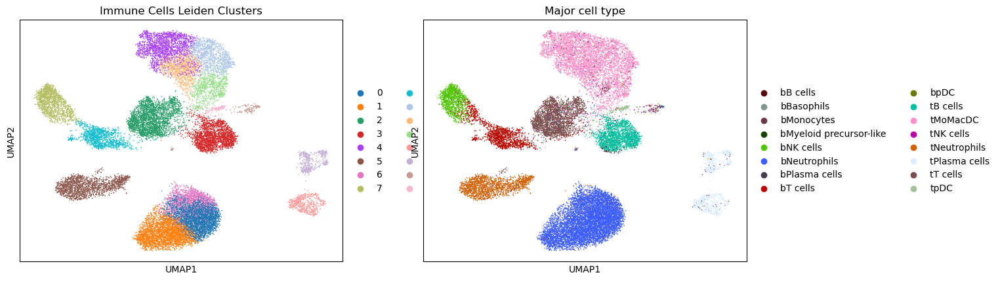

In [33]:
sc.tl.pca(immune_cells, svd_solver='arpack')

#Computed neighbors graph based on PCA space
sc.pp.neighbors(immune_cells, n_neighbors=10, n_pcs=40)

#Running Leiden clustering
sc.tl.leiden(immune_cells, resolution=1.0)  # Adjust resolution as needed

#Computed UMAP for visualization
sc.tl.umap(immune_cells)

#Plot UMAP colored by Leiden clusters
sc.pl.umap(immune_cells, color=['leiden', 'Major cell type'], title='Immune Cells Leiden Clusters')

In [34]:
pd.crosstab(immune_cells.obs['leiden'], immune_cells.obs['Major cell type'])


Major cell type,bB cells,bBasophils,bMonocytes,bMyeloid precursor-like,bNK cells,bNeutrophils,bPlasma cells,bT cells,bpDC,tB cells,tMoMacDC,tNK cells,tNeutrophils,tPlasma cells,tT cells,tpDC
leiden,,,,,,,,,,,,,,,,
0,1,0,26,0,0,3025,0,2,1,3,5,2,9,0,9,0
1,0,0,13,1,1,2880,1,2,1,2,1,4,7,0,10,0
2,4,1,42,1,14,26,0,44,3,18,37,47,3,2,2369,3
3,52,0,31,1,9,16,0,10,1,1860,52,5,2,6,52,6
4,0,0,15,0,9,25,0,5,1,1,1745,6,1,0,38,0
5,1,1,15,0,4,24,0,6,0,3,8,2,1655,0,19,1
6,2,0,9,0,2,1478,0,4,0,0,5,0,10,2,1,0
7,0,1,9,0,1148,0,0,267,0,0,2,12,0,0,5,0
8,2,1,10,0,5,6,0,1191,0,5,9,1,1,1,22,0


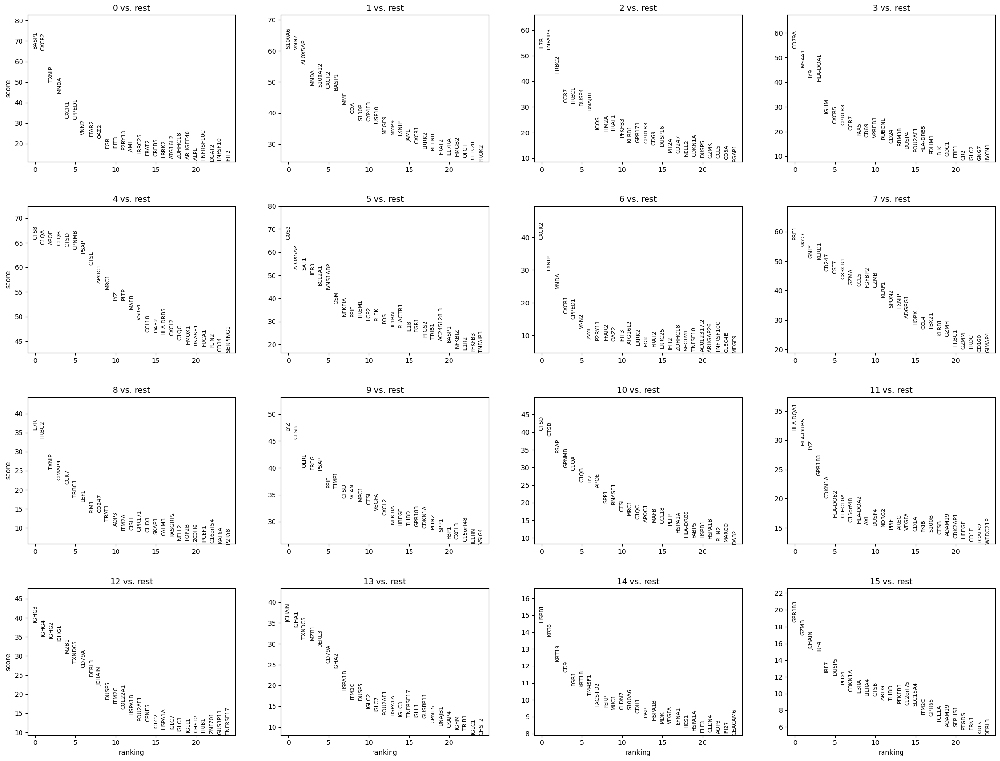

In [35]:
# Differential expression within immune cells by Leiden clusters
sc.tl.rank_genes_groups(immune_cells, groupby='leiden', method='wilcoxon', n_genes=100)
sc.pl.rank_genes_groups(immune_cells, n_genes = 25, sharey=False)

In [36]:
# Extract top 50 marker genes per cluster
marker_genes = {}

for cluster in immune_cells.obs['leiden'].unique():
    genes = immune_cells.uns['rank_genes_groups']['names'][cluster][:50]  # top 50 genes
    marker_genes[cluster] = genes

marker_genes

{'4': array(['CTSB', 'C1QA', 'APOE', 'C1QB', 'CTSD', 'GPNMB', 'PSAP', 'CTSL',
        'APOC1', 'MRC1', 'LYZ', 'PLTP', 'MAFB', 'VSIG4', 'CCL18', 'DAB2',
        'HLA-DRB5', 'CXCL2', 'C1QC', 'HMOX1', 'RNASE1', 'FUCA1', 'PLIN2',
        'CD14', 'SERPING1', 'HSPB1', 'CXCL3', 'HSPA1A', 'HSPA1B', 'A2M',
        'NFKBIA', 'IER3', 'FPR3', 'OLR1', 'GADD45B', 'HBEGF', 'NPL',
        'MARCO', 'DNAJB1', 'CD9', 'FOLR2', 'HLA-DQA1', 'EGR1', 'NFKBIZ',
        'FABP5', 'SDS', 'RAB20', 'PLAU', 'C3AR1', 'CDKN1A'], dtype=object),
 '9': array(['LYZ', 'CTSB', 'OLR1', 'EREG', 'PSAP', 'PPIF', 'TIMP1', 'CTSD',
        'VCAN', 'MRC1', 'CTSL', 'VEGFA', 'CXCL2', 'NFKBIA', 'HBEGF',
        'THBD', 'GPR183', 'CDKN1A', 'PLIN2', 'SPP1', 'FBP1', 'CXCL3',
        'C15orf48', 'IL1RN', 'VSIG4', 'CD14', 'GPNMB', 'GK', 'AREG',
        'IL1B', 'HLA-DRB5', 'FCN1', 'FPR3', 'G0S2', 'THBS1', 'SAT1',
        'IER3', 'CLEC5A', 'SDS', 'HSPA1A', 'CD9', 'RAB20', 'DUSP4', 'MT2A',
        'CD300E', 'HSPB1', 'MAFB', 'FABP5', 'INHBA', 

Leiden 0 – CXCR2⁺ Stress-Primed Neutrophil Program

Leiden 1 – S100A12⁺ Inflammatory Neutrophil Program

Leiden 2 – CD8⁺ Effector/Memory T Cell Program

Leiden 3 – Naive/Memory B Cell Program

Leiden 4 – C1Q⁺ Immunosuppressive TAM Program

Leiden 5 – IL1B⁺ NF-κB–Driven Monocyte Program

Leiden 6 – CXCR2⁺ Mature Neutrophil Program

Leiden 7 – Cytotoxic NK-like T Cell Program

Leiden 8 – CD8⁺ Transitional T Cell Program

Leiden 9 – SPP1⁺ ECM-Remodeling TAM Program

Leiden 10 – C1Q⁺ Lipid-Adapted TAM Program

Leiden 11 – CD1C⁺ Conventional Dendritic Cell Program

Leiden 12 – IGHG⁺ Mature Plasma Cell Program

Leiden 13 – IGHA⁺ Secretory Plasma Cell Program

Leiden 14 – Epithelial-like Contaminant Cluster

Leiden 15 – LILRA4⁺ Plasmacytoid Dendritic Cell Program



SUBSET - IMMUNE CELLS IN TUMOR SAMPLES

In [37]:
# Immune cells from tumor only
tumor_immune_cells = adata_integrated[
    (adata_integrated.obs["Tissue"] == "tumor") &
    (adata_integrated.obs["Major cell type"].str.contains("MoMacDC|T cells|B cells|NK cells|pDC|Plasma cells|Monocytes|Basophils|Myeloid precursor|Mast cells|Neutrophils", na=False))
].copy()

# Immune cells from blood only
blood_immune_cells = adata_integrated[
    (adata_integrated.obs["Tissue"] == "blood") &
    (adata_integrated.obs["Major cell type"].str.contains("MoMacDC|T cells|B cells|NK cells|pDC|Plasma cells|Monocytes|Basophils|Myeloid precursor|Mast cells|Neutrophils", na=False))
].copy()


tumor_types = set(tumor_immune_cells.obs['Major cell type'].dropna().unique())
blood_types = set(blood_immune_cells.obs['Major cell type'].dropna().unique())

shared_types = tumor_types & blood_types          # Found in both
tumor_only = tumor_types - blood_types            # Only in tumor
blood_only = blood_types - tumor_types            # Only in blood

#Subset AnnData to cells of only those tumor-only immune types
tumor_only_cells = tumor_immune_cells[
    tumor_immune_cells.obs["Major cell type"].isin(tumor_only)
].copy()


sc.pp.pca(tumor_only_cells)
sc.pp.neighbors(tumor_only_cells)
sc.tl.leiden(tumor_only_cells, resolution = 1.0)
sc.tl.umap(tumor_only_cells)




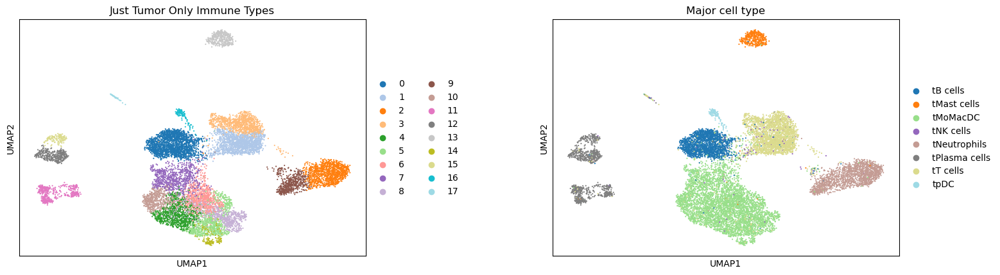

In [38]:
sc.pl.umap(tumor_only_cells, color=['leiden', 'Major cell type'], title='Just Tumor Only Immune Types', wspace = 0.4, palette='tab20')

In [39]:
pd.crosstab(tumor_only_cells.obs["leiden"], tumor_only_cells.obs["Major cell type"])


Major cell type,tB cells,tMast cells,tMoMacDC,tNK cells,tNeutrophils,tPlasma cells,tT cells,tpDC
leiden,,,,,,,,
0,1857,3,67,5,3,6,53,4
1,12,2,35,42,2,3,1454,1
2,1,1,5,1,1157,0,3,1
3,10,0,8,19,2,1,950,1
4,2,0,955,3,1,0,10,0
5,0,1,847,3,0,0,20,0
6,1,3,836,1,5,1,7,0
7,3,1,775,3,3,0,13,7
8,1,0,585,2,1,0,10,0



0:  'tB cells 
1:  'tT cells 
2:  'tNeutrophils 
3:  'tT cells 
4:  'tMoMacDC 
5:  'tMoMacDC 
6:  'tMoMacDC 
7:  'tMoMacDC 
8:  'tMoMacDC 
9:  'tNeutrophils 
10: 'tMoMacDC 
11: 'tPlasma cells 
12: 'tPlasma cells 
13: 'tMast cells 
14: 'tMoMacDC 
15: 'tPlasma cells 
16: 'tpDC 
17: 'tT cells 


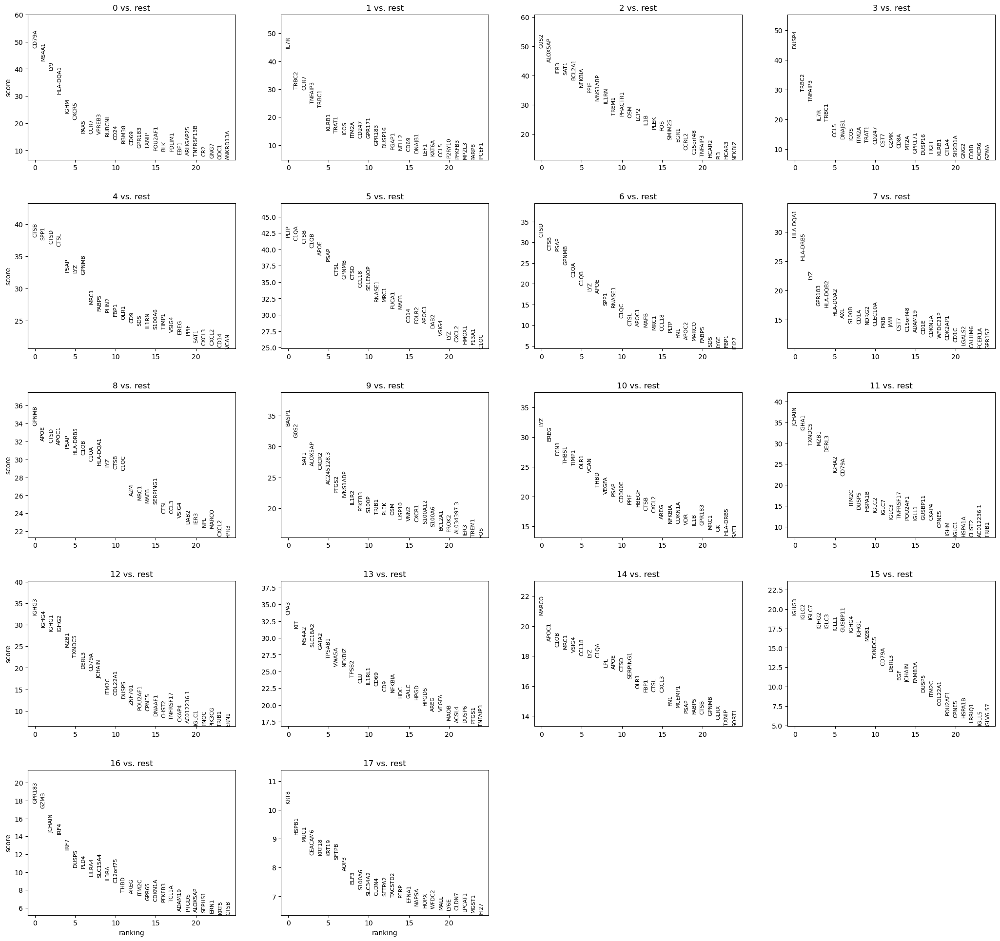

In [40]:
sc.tl.rank_genes_groups(tumor_only_cells, groupby='leiden', method='wilcoxon', n_genes=100)
sc.pl.rank_genes_groups(tumor_only_cells, n_genes = 25, sharey=False)

In [41]:
# Extract top 50 marker genes per cluster
marker_genes = {}

for cluster in tumor_only_cells.obs['leiden'].unique():
    genes = tumor_only_cells.uns['rank_genes_groups']['names'][cluster][:50]  # top 50 genes
    marker_genes[cluster] = genes

marker_genes

{'5': array(['PLTP', 'C1QA', 'CTSB', 'C1QB', 'APOE', 'PSAP', 'CTSL', 'GPNMB',
        'CTSD', 'CCL18', 'SELENOP', 'RNASE1', 'MRC1', 'FUCA1', 'MAFB',
        'CD14', 'FOLR2', 'APOC1', 'DAB2', 'VSIG4', 'LYZ', 'CXCL2', 'HMOX1',
        'F13A1', 'C1QC', 'HSPA1A', 'NPL', 'SERPING1', 'A2M', 'HSPA1B',
        'CXCL3', 'SAT1', 'PLIN2', 'SLC40A1', 'FPR3', 'STAB1', 'NFKBIA',
        'HSPB1', 'GADD45B', 'SDS', 'EGR1', 'PDK4', 'IER3', 'PRCP', 'THBD',
        'IL2RA', 'HLA-DRB5', 'PLAU', 'C3AR1', 'HBEGF'], dtype=object),
 '10': array(['LYZ', 'EREG', 'FCN1', 'THBS1', 'TIMP1', 'OLR1', 'VCAN', 'THBD',
        'VEGFA', 'PSAP', 'CD300E', 'PPIF', 'HBEGF', 'CTSB', 'CXCL2',
        'AREG', 'NFKBIA', 'CDKN1A', 'VDR', 'IL1B', 'GPR183', 'MRC1', 'GK',
        'HLA-DRB5', 'SAT1', 'CD14', 'S100A6', 'NLRP3', 'LILRB2', 'IER3',
        'JAML', 'F13A1', 'CLEC10A', 'G0S2', 'CXCL3', 'C15orf48', 'CD93',
        'TLR2', 'FPR3', 'BASP1', 'TET2', 'OSM', 'SNAI1', 'PLEK', 'ITGAM',
        'VSIG4', 'RAB20', 'CLEC5A', 'SDS', 


'0':  'Naive/Activated B Cell Program',
'1':  'CD8⁺ Effector/Memory-like T Cell Program',
'2':  'NF-κB–Driven Inflammatory Monocyte Program',
'3':  'Cytotoxic CD8⁺ T Cell Program',
'4':  'SPP1⁺ ECM-Remodeling TAM Program',
'5':  'CCL18⁺ Immunosuppressive TAM Program',
'6':  'Lipid-Adapted Phagocytic TAM Program',
'7':  'Conventional Dendritic Cell / Antigen Presentation Program',
'8':  'C1Q⁺ Complement-Activating TAM Program',
'9':  'Stress-Primed Inflammatory Neutrophil Program',
'10': 'IL1B⁺ Remodeling TAM Program',
'11': 'IgA⁺ Plasma Cell Program',
'12': 'IgG⁺ Plasma Cell Program',
'13': 'CPA3⁺ Degranulating Mast Cell Program',
'14': 'MARCO⁺ Lipid-Scavenging TAM Program',
'15': 'ER-Stressed IgG⁺ Plasma Cell Program',
'16': 'LILRA4⁺ Plasmacytoid Dendritic Cell Program',
'17': 'Alveolar-like Secretory Epithelium Program'


NMF

TUMOR CELLS

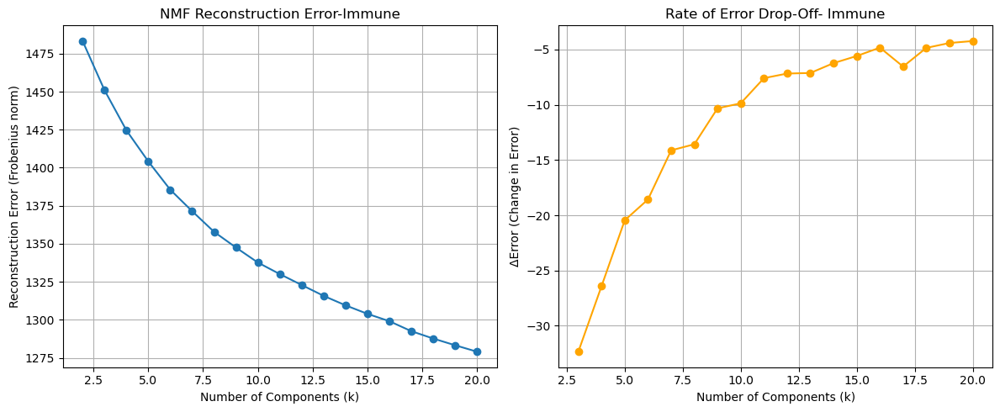

In [ ]:
#Selecting highly variable genes
sc.pp.highly_variable_genes(
    tumor_cells,
    flavor="seurat",
    n_top_genes=2000,
    subset=False
)

#Subseting to HVGs
tumor_hvg = tumor_cells[:, tumor_cells.var['highly_variable']].copy()
X = tumor_hvg.X
if not isinstance(X, np.ndarray):
    X = X.toarray()

#Testing a range of components
component_range = range(2, 21)
errors = []

for k in component_range:
    model = NMF(n_components=k, init='nndsvd', random_state=0)
    W = model.fit_transform(X)
    H = model.components_
    reconstruction = np.dot(W, H)
    error = np.linalg.norm(X - reconstruction, ord='fro')
    errors.append(error)

# Compute ΔError (rate of change)
delta_errors = np.diff(errors)

# Plotting reconstruction error and ΔError
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Plotting reconstruction error
ax[0].plot(component_range, errors, marker='o')
ax[0].set_xlabel('Number of Components (k)')
ax[0].set_ylabel('Reconstruction Error (Frobenius norm)')
ax[0].set_title('NMF Reconstruction Error-Immune')
ax[0].grid(True)

# Plotting ΔError to detect elbow
ax[1].plot(component_range[1:], delta_errors, marker='o', color='orange')
ax[1].set_xlabel('Number of Components (k)')
ax[1].set_ylabel('ΔError (Change in Error)')
ax[1].set_title('Rate of Error Drop-Off- Immune')
ax[1].grid(True)

plt.tight_layout()
plt.show()


In [44]:
# Ran NMF with k components
n_components = 14
nmf_model = NMF(n_components=n_components, init='nndsvd', random_state=0)
W = nmf_model.fit_transform(X)  
H = nmf_model.components_       


tumor_hvg.obsm['X_nmf'] = W

#add component scores to .var (for genes)
import pandas as pd
nmf_df = pd.DataFrame(H.T, index=tumor_hvg.var_names, columns=[f'NMF_{i}' for i in range(n_components)])
tumor_hvg.varm['NMF'] = nmf_df.values

# Created a dictionary of top genes per NMF component
top_genes_per_program_tumor = {}

for i in range(n_components):
    gene_weights = H[i]
    top_indices = np.argsort(gene_weights)[::-1][:50]  # top 50 genes
    top_genes = tumor_hvg.var_names[top_indices]
    top_genes_per_program_tumor[f'NMF_{i}'] = top_genes.tolist()
    
for i in range(n_components):
    tumor_hvg.obs[f'NMF_{i}'] = W[:, i]


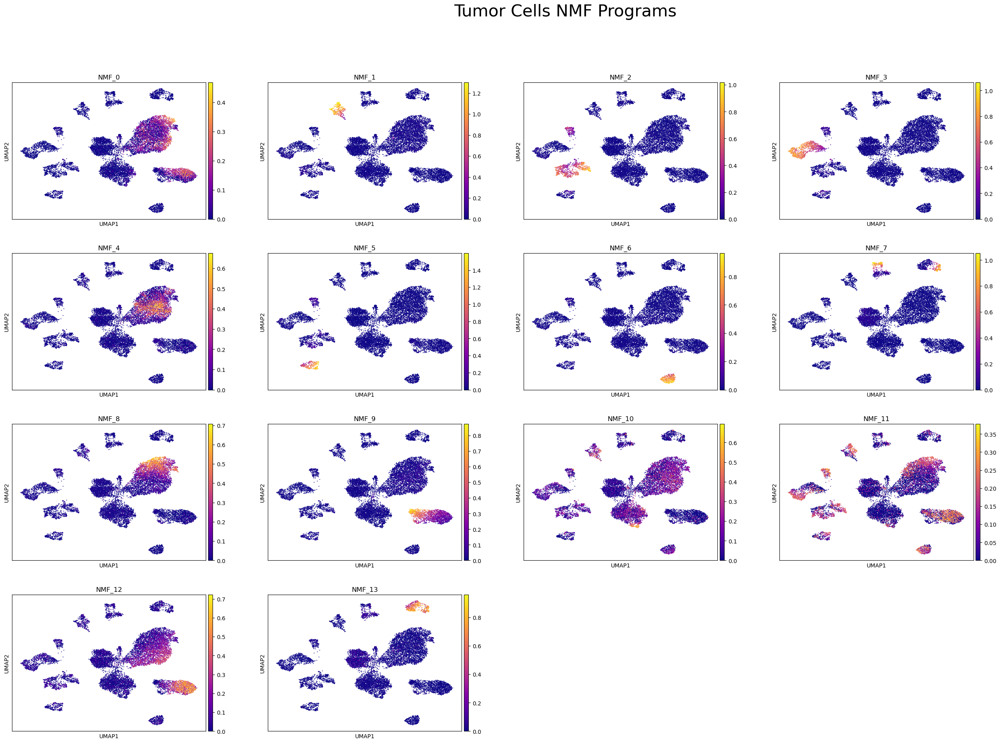

In [45]:


sc.pl.umap(
    tumor_hvg,
    color=[f'NMF_{i}' for i in range(n_components)],
    cmap='plasma',
    wspace=0.2,
    show=False  
)

plt.suptitle("Tumor Cells NMF Programs", fontsize=30)
plt.show()

In [46]:
#Ranked genes per program
gene_names = np.array(tumor_hvg.var_names)
ranked_genes_per_program_tumor = {}

for i in range(n_components):
    weights = H[i]
    df = pd.DataFrame({
        'gene': gene_names,
        'weight': weights
    })
    df_sorted = df.sort_values(by='weight', ascending=False)
    ranked_genes_per_program_tumor[f'NMF_{i}'] = df_sorted.reset_index(drop=True)

# To Check - print top 10 genes for component 0
print(ranked_genes_per_program_tumor['NMF_0'].head(10))

# Saved ranked lists
for i in range(n_components):
    ranked_genes_per_program_tumor[f'NMF_{i}'].to_csv(f'ranked_genes_NMF_{i}.csv', index=False)

# Saved top 50 genes separately
for program, genes in top_genes_per_program_tumor.items():
    with open(f"{program}_top_genes.txt", "w") as f:
        for gene in genes:
            f.write(gene + "\n")

top_genes_per_program_tumor

     gene     weight
0    IL1B  18.328124
1    CCL4   6.544721
2    CCL3   4.616556
3   CXCL3   4.366433
4  CCL4L2   3.172957
5    IL1A   2.989833
6  CCL3L3   2.838073
7     TNF   1.921111
8   NLRP3   1.847361
9   CXCL1   1.599726


{'NMF_0': ['IL1B',
  'CCL4',
  'CCL3',
  'CXCL3',
  'CCL4L2',
  'IL1A',
  'CCL3L3',
  'TNF',
  'NLRP3',
  'CXCL1',
  'G0S2',
  'HLA-DQB2',
  'TNFAIP6',
  'GPR84',
  'THBS1',
  'CXCL9',
  'IL6',
  'CCL2',
  'A2M',
  'AP003354.2',
  'C3',
  'IRAK2',
  'TIMP1',
  'CXCL10',
  'MIR3945HG',
  'SERPINB2',
  'ATP2B1-AS1',
  'DENND5A',
  'CLEC4E',
  'CSTA',
  'PDGFB',
  'GBP5',
  'FLT1',
  'PRDM7',
  'CD300E',
  'CYP1B1',
  'FCGBP',
  'AC006449.6',
  'S100B',
  'IL23A',
  'NDRG2',
  'LUCAT1',
  'CH25H',
  'IL3RA',
  'ANKRD22',
  'AL356273.3',
  'LIMK2',
  'PLD4',
  'GPX3',
  'CLEC4A'],
 'NMF_1': ['COL1A1',
  'COL3A1',
  'COL1A2',
  'SPARC',
  'LUM',
  'DCN',
  'COL6A1',
  'COL6A3',
  'COL6A2',
  'IGFBP7',
  'C1S',
  'BGN',
  'MMP2',
  'COL5A2',
  'COL5A1',
  'TAGLN',
  'FBLN1',
  'TIMP1',
  'POSTN',
  'FSTL1',
  'C1R',
  'CALD1',
  'TIMP3',
  'PCOLCE',
  'CTHRC1',
  'CTSK',
  'THY1',
  'A2M',
  'THBS2',
  'RARRES2',
  'MGP',
  'AEBP1',
  'C11orf96',
  'MXRA8',
  'MFAP4',
  'MMP11',
  'ACTA2',
 

NMF 0- Pro-inflammatory Myeloid / Alarmin Response Module
NMF 1- Fibroblast / ECM Remodeling Module
NMF 2- Alveolar Epithelial / Secretory Module
NMF 3- Basal-like Epithelial / Squamous Differentiation Module
NMF 4 - Inflammatory Myeloid / Matrix Remodeling Module
NMF 5- Goblet / Secretory Epithelium Module
NMF 6- Mast Cell / Type 2 Inflammatory Module
NMF 7- Plasma Cell / Humoral Immunity Module
NMF 8- M2-like Macrophage / Stromal Crosstalk Module
NMF 9- Neutrophil / Acute Inflammatory Response Module
NMF 10- Activated CD8⁺ T Cell / Metallothionein-Inflamed Module
NMF 11- Epithelial–Myeloid Stress Response / Mixed Inflammatory Module
NMF 12- Myeloid–Inflammatory / Type I IFN Signaling Module
NMF 13- Plasma Cell / Humoral Immunity Module

In [47]:
for program, genes in top_genes_per_program_tumor.items():
    with open(f"{program}_top_genes.txt", "w") as f:
        for gene in genes:
            f.write(gene + "\n")

top_genes_per_program_tumor
expr_mat = tumor_hvg.X.toarray() if hasattr(tumor_hvg.X, "toarray") else tumor_hvg.X

# Created DataFrame: rows = cells, columns = genes
expr_df = pd.DataFrame(expr_mat, index=tumor_hvg.obs_names, columns=tumor_hvg.var_names)

# Transposed to genes x cells for GSEA input
expr_df_T = expr_df.T

metabolic_gene_sets = { 
    # Energy & Carbon
    "HALLMARK_GLYCOLYSIS": [],
    "HALLMARK_OXIDATIVE_PHOSPHORYLATION": [],
    "KEGG_PENTOSE_PHOSPHATE_PATHWAY": [],
    "KEGG_CITRATE_CYCLE_TCA_CYCLE": [],
    "KEGG_ONE_CARBON_POOL_BY_FOLATE": [],
    
    # Lipid-related
    "HALLMARK_FATTY_ACID_METABOLISM": [],
    "REACTOME_METABOLISM_OF_LIPIDS": [],
    "WP_FATTY_ACID_BETAOXIDATION": [],
    "KEGG_SPHINGOLIPID_METABOLISM": [],
    "REACTOME_GLUTATHIONE_SYNTHESIS_AND_RECYCLING": [],
    "KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY": [],
    "REACTOME_GLUTATHIONE_CONJUGATION": [],
    "REACTOME_ARACHIDONATE_METABOLISM": [],


    
    # Amino acid metabolism
    "KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM": [],
    "KEGG_ARGININE_AND_PROLINE_METABOLISM": [],
    "KEGG_TRYPTOPHAN_METABOLISM": [],
    "REACTOME_GLUTAMATE_AND_GLUTAMINE_METABOLISM": [],
    "KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM": [],
    
    # Redox & stress
    "HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY": [],
    "HALLMARK_HYPOXIA": [],
    "WP_UNFOLDED_PROTEIN_RESPONSE": [],
    "REACTOME_HEME_BIOSYNTHESIS": [],
    "REACTOME_CELLULAR_RESPONSE_TO_MITOCHONDRIAL_STRESS": [],
    "REACTOME_CELLULAR_RESPONSE_TO_HYPOXIA": [],
    "WP_FERROPTOSIS": [],
    
    # Signaling & regulation (only metabolism-related)
    "HALLMARK_MTORC1_SIGNALING": [],
    "KEGG_REGULATION_OF_AUTOPHAGY": [],
    
    # Proliferation & biomass
    "REACTOME_METABOLISM_OF_NUCLEOTIDES": [],
    "HALLMARK_CHOLESTEROL_HOMEOSTASIS": [],
    "REACTOME_LYSOSOME_VESICLE_BIOGENESIS": [],
    
    # Energy metabolism expansion
    "REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_ELECTRON_TRANSPORT": []
}



# Function to parse GMTs
def parse_gmt_into_dict(file_path, gene_set_dict):
    with open(file_path, 'r') as file:
        for line in file:
            entries = line.strip().split('\t')
            pathway_name = entries[0]
            genes = entries[2:]
            for key in gene_set_dict.keys():
                if key.lower().replace("_", "") in pathway_name.lower().replace("_", ""):
                    gene_set_dict[key] = genes
    return gene_set_dict

# Listing GMT files
gmt_files = [
    "HALLMARK_FATTY_ACID_METABOLISM.v2025.1.Hs.gmt",
    "HALLMARK_CHOLESTEROL_HOMEOSTASIS.v2025.1.Hs.gmt",
    "HALLMARK_GLYCOLYSIS.v2025.1.Hs.gmt",
    "HALLMARK_HYPOXIA.v2025.1.Hs.gmt",
    "HALLMARK_IL2_STAT5_SIGNALING.v2025.1.Hs.gmt",
    "HALLMARK_MTORC1_SIGNALING.v2025.1.Hs.gmt",
    "HALLMARK_IL6_JAK_STAT3_SIGNALING.v2025.1.Hs.gmt",
    "HALLMARK_OXIDATIVE_PHOSPHORYLATION.v2025.1.Hs.gmt",
    "HALLMARK_IL6_JAK_STAT3_SIGNALING.v2025.1.Hs.gmt",
    "KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_ARGININE_AND_PROLINE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_CITRATE_CYCLE_TCA_CYCLE.v2025.1.Hs.gmt",
    "KEGG_PENTOSE_PHOSPHATE_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_JAK_STAT_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_REGULATION_OF_AUTOPHAGY.v2025.1.Hs.gmt",
    "KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION.v2025.1.Hs.gmt",
    "HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY.v2025.1.Hs.gmt",
    "REACTOME_METABOLISM_OF_LIPIDS.v2025.1.Hs.gmt",
    "REACTOME_METABOLISM_OF_NUCLEOTIDES.v2025.1.Hs.gmt",
    "REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_ELECTRON_TRANSPORT.v2025.1.Hs.gmt",
    "REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_STAT_SIGNALING_AFTER_INTERLEUKIN_12_STIMULATION.v2025.1.Hs.gmt",
    "REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBERS_MEDIATING_NON_CANONICAL_NF_KB_PATHWAY.v2025.1.Hs.gmt",
    "REACTOME_INNATE_IMMUNE_SYSTEM.v2025.1.Hs.gmt",
    "REACTOME_HEME_BIOSYNTHESIS.v2025.1.Hs.gmt",
    "REACTOME_ADAPTIVE_IMMUNE_SYSTEM.v2025.1.Hs.gmt",
    "REACTOME_CELLULAR_RESPONSE_TO_MITOCHONDRIAL_STRESS.v2025.1.Hs.gmt",
    "REACTOME_FCGR_ACTIVATION.v2025.1.Hs.gmt",
    "REACTOME_IMMUNE_SYSTEM.v2025.1.Hs.gmt",
    "REACTOME_CELLULAR_RESPONSE_TO_HYPOXIA.v2025.1.Hs.gmt",
    "WP_UNFOLDED_PROTEIN_RESPONSE.v2025.1.Hs.gmt",
    "REACTOME_GLUTAMATE_AND_GLUTAMINE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_TRYPTOPHAN_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_SPHINGOLIPID_METABOLISM.v2025.1.Hs.gmt",
    "WP_FATTY_ACID_BETAOXIDATION.v2025.1.Hs.gmt",
    "KEGG_ONE_CARBON_POOL_BY_FOLATE.v2025.1.Hs.gmt",
    "KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "REACTOME_LYSOSOME_VESICLE_BIOGENESIS.v2025.1.Hs.gmt",
    "WP_FERROPTOSIS.v2025.1.Hs.gmt",
    "HALLMARK_COMPLEMENT.v2025.1.Hs.gmt",
    "REACTOME_AUTOPHAGY.v2025.1.Hs.gmt",
    "REACTOME_GLUTATHIONE_SYNTHESIS_AND_RECYCLING.v2025.1.Hs.gmt",
    "REACTOME_GLUTATHIONE_CONJUGATION.v2025.1.Hs.gmt",
    "REACTOME_ARACHIDONATE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY.v2025.1.Hs.gmt",
    "HALLMARK_INTERFERON_ALPHA_RESPONSE.v2025.1.Hs.gmt",
    "REACTOME_INTERFERON_GAMMA_SIGNALING.v2025.1.Hs.gmt",
    "REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION.v2025.1.Hs.gmt"

]

In [48]:

# Update gene sets
for gmt_file in gmt_files:
    metabolic_gene_sets = parse_gmt_into_dict(gmt_file, metabolic_gene_sets)

# Run ssGSEA with just core metabolism pathways

ssgsea_results = ssgsea(
    data=expr_df_T,
    gene_sets=metabolic_gene_sets,
    sample_norm_method='rank',
    outdir=None,
    permutation_num=0,
    no_plot=True
)

pathway_scores = ssgsea_results.res2d.T


In [49]:
nmf_enrichment_results = []
metabolic_results = []

for program, genes in top_genes_per_program_tumor.items():
    top_genes = genes[:500]  

    # Keep only genes that occur in at least one metabolic pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in metabolic_gene_sets.values())]

    if len(top_genes) == 0:
        print(f"No matching genes for {program}, skipping enrichment.")
        continue

    # Run enrichment analysis
    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=metabolic_gene_sets,   
        organism='Human',
        outdir=None,
        cutoff=0.05
    )

    df = enr.results.copy()
    df['NMF_program'] = program
    df['Category'] = 'Metabolic'
    metabolic_results.append(df)

    nmf_enrichment_results.append(df)

# Combine all results
metabolic_results = pd.concat(metabolic_results, ignore_index=True)

# Showing top hits per NMF program
if nmf_enrichment_results:
    all_nmf_results = pd.concat(nmf_enrichment_results, ignore_index=True)
else:
    all_nmf_results = pd.DataFrame()
for prog in all_nmf_results['NMF_program'].unique():
    print(f"\nTop enriched metabolic pathways for {prog}:\n")
    display(all_nmf_results[all_nmf_results['NMF_program'] == prog]
            .sort_values('Adjusted P-value')
            .head(7))




Top enriched metabolic pathways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
1,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.214011,0.342897,3.122586,4.814177,PDGFB;IL6,NMF_0,Metabolic
2,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.194629,0.342897,7.311704,11.966766,GPX3,NMF_0,Metabolic
3,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.257173,0.342897,5.284830,7.176841,TNF,NMF_0,Metabolic
4,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.161637,0.342897,9.017870,16.434207,CYP1B1,NMF_0,Metabolic
7,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.100006,0.342897,15.277847,35.177621,IL1B,NMF_0,Metabolic
5,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.229930,0.342897,6.031674,8.866452,CYP1B1,NMF_0,Metabolic
6,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,4/756,0.431207,0.492809,1.419450,1.193993,CH25H;CYP1B1;G0S2;PLD4,NMF_0,Metabolic



Top enriched metabolic pathways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
9,gs_ind_0,HALLMARK_HYPOXIA,3/200,0.003323,0.009970,22.039662,125.775632,COL5A1;BGN;DCN,NMF_1,Metabolic
8,gs_ind_0,HALLMARK_GLYCOLYSIS,2/200,0.049071,0.073606,9.392947,28.314986,COL5A1;DCN,NMF_1,Metabolic
10,gs_ind_0,HALLMARK_MTORC1_SIGNALING,1/200,0.334742,0.334742,4.003222,4.381104,IGFBP5,NMF_1,Metabolic



Top enriched metabolic pathways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
13,gs_ind_0,HALLMARK_HYPOXIA,3/200,0.007716,0.046297,13.216709,64.291895,CP;SELENBP1;F3,NMF_2,Metabolic
14,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.134985,0.291435,11.415954,22.861453,HPGD,NMF_2,Metabolic
16,gs_ind_0,WP_FERROPTOSIS,1/64,0.145718,0.291435,10.490814,20.206199,CP,NMF_2,Metabolic
12,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.399268,0.479121,3.111947,2.857150,CLDN3,NMF_2,Metabolic
11,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.328469,0.479121,4.030688,4.487414,HPGD,NMF_2,Metabolic
15,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,1/756,0.897791,0.897791,0.576439,0.062151,HPGD,NMF_2,Metabolic



Top enriched metabolic pathways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
20,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.025374,0.177616,11.597101,42.608251,PTGR1;GPX2,NMF_3,Metabolic
17,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,2/158,0.146802,0.288235,4.050053,7.770730,ALDH3A1;ADH7,NMF_3,Metabolic
19,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.214011,0.288235,3.122586,4.814177,IGFBP3;CAV1,NMF_3,Metabolic
21,gs_ind_0,REACTOME_GLUTATHIONE_CONJUGATION,1/36,0.146592,0.288235,10.053853,19.304450,GSTA1,NMF_3,Metabolic
23,gs_ind_0,WP_FERROPTOSIS,1/64,0.247059,0.288235,5.542844,7.749616,AKR1C2,NMF_3,Metabolic
22,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,5/756,0.199229,0.288235,2.124861,3.428042,GPX2;CAV1;HILPDA;AKR1C2;PTGR1,NMF_3,Metabolic
18,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.600774,0.600774,1.643963,0.837658,IGFBP3,NMF_3,Metabolic



Top enriched metabolic pathways for NMF_4:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
27,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.075277,0.175647,21.954792,56.787781,CYP1B1,NMF_4,Metabolic
26,gs_ind_0,KEGG_SPHINGOLIPID_METABOLISM,1/39,0.073449,0.175647,22.536178,58.845724,SPHK1,NMF_4,Metabolic
30,gs_ind_0,WP_FATTY_ACID_BETAOXIDATION,1/34,0.064266,0.175647,25.963753,71.263357,LPL,NMF_4,Metabolic
24,gs_ind_0,HALLMARK_CHOLESTEROL_HOMEOSTASIS,1/74,0.135850,0.190190,11.600583,23.157134,LPL,NMF_4,Metabolic
28,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.109506,0.190190,14.684982,32.479918,CYP1B1,NMF_4,Metabolic
25,gs_ind_0,HALLMARK_HYPOXIA,1/200,0.334742,0.390533,4.003222,4.381104,SERPINE1,NMF_4,Metabolic
29,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,2/756,0.465254,0.465254,1.734261,1.327008,SPHK1;CYP1B1,NMF_4,Metabolic



Top enriched metabolic pathways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
31,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.184282,0.184282,9.350877,15.815033,TFF3,NMF_5,Metabolic
32,gs_ind_0,HALLMARK_HYPOXIA,1/200,0.184282,0.184282,9.350877,15.815033,F3,NMF_5,Metabolic



Top enriched metabolic pathways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
40,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.020101,0.241208,13.387960,52.306785,HPGDS;HPGD,NMF_6,Metabolic
39,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.145019,0.433297,10.225316,19.743971,MAOB,NMF_6,Metabolic
37,gs_ind_0,KEGG_ARGININE_AND_PROLINE_METABOLISM,1/54,0.191234,0.433297,7.497196,12.402295,MAOB,NMF_6,Metabolic
38,gs_ind_0,KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM,1/31,0.114104,0.433297,13.301639,28.873172,MAOB,NMF_6,Metabolic
42,gs_ind_0,REACTOME_GLUTATHIONE_CONJUGATION,1/36,0.131397,0.433297,11.400000,23.136631,HPGDS,NMF_6,Metabolic
41,gs_ind_0,REACTOME_CELLULAR_RESPONSE_TO_HYPOXIA,1/62,0.216649,0.433297,6.495935,9.935395,EGLN1,NMF_6,Metabolic
33,gs_ind_0,HALLMARK_CHOLESTEROL_HOMEOSTASIS,1/74,0.253460,0.434503,5.402721,7.415496,CLU,NMF_6,Metabolic



Top enriched metabolic pathways for NMF_7:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
45,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,2/158,0.031470,0.147212,12.182109,42.134557,RETSAT;INMT,NMF_7,Metabolic
47,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.049071,0.147212,9.392947,28.314986,KDELR3;CAV1,NMF_7,Metabolic
49,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.075277,0.150554,21.954792,56.787781,INMT,NMF_7,Metabolic
46,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.334742,0.401691,4.003222,4.381104,KDELR3,NMF_7,Metabolic
48,gs_ind_0,HALLMARK_OXIDATIVE_PHOSPHORYLATION,1/200,0.334742,0.401691,4.003222,4.381104,RETSAT,NMF_7,Metabolic
50,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,1/756,0.838625,0.838625,0.741704,0.130533,CAV1,NMF_7,Metabolic



Top enriched metabolic pathways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
59,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.031141,0.373697,10.227621,35.481835,CYP1B1;DPEP2,NMF_8,Metabolic
57,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.177939,0.513154,8.064624,13.922064,CYP1B1,NMF_8,Metabolic
60,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,6/756,0.114422,0.513154,2.514546,5.451194,DPEP2;CYP1B1;FABP4;CH25H;ME1;ABHD5,NMF_8,Metabolic
56,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.213814,0.513154,6.538795,10.087064,GPX3,NMF_8,Metabolic
61,gs_ind_0,WP_FATTY_ACID_BETAOXIDATION,1/34,0.153211,0.513154,9.537313,17.891407,LPL,NMF_8,Metabolic
62,gs_ind_0,WP_FERROPTOSIS,1/64,0.270485,0.524905,4.956900,6.481338,SLC40A1,NMF_8,Metabolic
51,gs_ind_0,HALLMARK_CHOLESTEROL_HOMEOSTASIS,1/74,0.306195,0.524905,4.261010,5.043051,LPL,NMF_8,Metabolic



Top enriched metabolic pathways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
64,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.134281,0.319496,11.316776,22.722023,CDKN2D,NMF_9,Metabolic
65,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.159748,0.319496,9.335664,17.123071,CYP4F3,NMF_9,Metabolic
68,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.067786,0.319496,23.646035,63.640761,IL1B,NMF_9,Metabolic
67,gs_ind_0,REACTOME_METABOLISM_OF_NUCLEOTIDES,1/97,0.250905,0.376358,5.552049,7.676707,CDA,NMF_9,Metabolic
66,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,3/756,0.385225,0.385225,1.735236,1.655291,CYP4F3;G0S2;DGAT2,NMF_9,Metabolic
63,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.379950,0.385225,3.296104,3.189691,G0S2,NMF_9,Metabolic



Top enriched metabolic pathways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
69,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.049071,0.137417,9.392947,28.314986,MT2A;MT1E,NMF_10,Metabolic
70,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.091611,0.137417,17.801178,42.548357,GPX3,NMF_10,Metabolic
71,gs_ind_0,REACTOME_METABOLISM_OF_NUCLEOTIDES,1/97,0.175104,0.175104,8.733531,15.217105,AMPD2,NMF_10,Metabolic



Top enriched metabolic pathways for NMF_11:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
73,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.152105,0.304211,10.002506,18.836530,TNF,NMF_11,Metabolic
75,gs_ind_0,WP_FERROPTOSIS,1/64,0.145718,0.304211,10.490814,20.206199,SLC40A1,NMF_11,Metabolic
72,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.399268,0.532357,3.111947,2.857150,TFF3,NMF_11,Metabolic
74,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,2/756,0.601964,0.601964,1.237811,0.628261,PGS1;ABHD5,NMF_11,Metabolic



Top enriched metabolic pathways for NMF_12:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
81,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.078647,0.471883,19.998363,50.851498,IL1B,NMF_12,Metabolic
76,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.427507,0.612039,2.787546,2.368812,G0S2,NMF_12,Metabolic
78,gs_ind_0,REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_E...,1/261,0.612039,0.612039,1.594124,0.782651,RMND5A,NMF_12,Metabolic
77,gs_ind_0,HALLMARK_MTORC1_SIGNALING,1/200,0.510227,0.612039,2.152111,1.448156,IFI30,NMF_12,Metabolic
79,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,3/756,0.504221,0.612039,1.348595,0.923439,DGAT2;PGS1;G0S2,NMF_12,Metabolic
80,gs_ind_0,REACTOME_METABOLISM_OF_NUCLEOTIDES,1/97,0.286178,0.612039,4.695496,5.874727,AMPD2,NMF_12,Metabolic



Top enriched metabolic pathways for NMF_13:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
82,gs_ind_0,HALLMARK_HYPOXIA,1/200,0.399268,0.491337,3.111947,2.857150,CAV1,NMF_13,Metabolic
83,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.152105,0.491337,10.002506,18.836530,CAMKK2,NMF_13,Metabolic
84,gs_ind_0,REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_E...,1/261,0.491337,0.491337,2.305182,1.638120,RMND5A,NMF_13,Metabolic
85,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,3/756,0.260189,0.491337,2.431188,3.273219,PPT2;CAV1;OSBPL10,NMF_13,Metabolic


In [50]:
immune_gene_sets = {
    "HALLMARK_IL2_STAT5_SIGNALING": [],
    "HALLMARK_IL6_JAK_STAT3_SIGNALING": [],
    "KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION": [],
    "KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY": [],
    "KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY": [],
    "KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY": [],
    "REACTOME_FCGR_ACTIVATION": [],
    "REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBERS_MEDIATING_NON_CANONICAL_NF_KB_PATHWAY": [],
    "REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_STAT_SIGNALING_AFTER_INTERLEUKIN_12_STIMULATION": [],
    "HALLMARK_COMPLEMENT": [],
    "KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY": [],
    "HALLMARK_INTERFERON_ALPHA_RESPONSE": [],
    "REACTOME_INTERFERON_GAMMA_SIGNALING": [],
    "REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION": []
}
        

def parse_gmt_into_dict(file_path, gene_set_dict):
    with open(file_path, 'r') as file:
        for line in file:
            entries = line.strip().split('\t')
            pathway_name = entries[0]
            genes = entries[2:]
            for key in gene_set_dict.keys():
                if key.lower().replace("_", "") in pathway_name.lower().replace("_", ""):
                    gene_set_dict[key] = genes
    return gene_set_dict

for gmt_file in gmt_files:
    immune_gene_sets = parse_gmt_into_dict(gmt_file, immune_gene_sets)

# Ran ssGSEA with just core metabolism pathways

ssgsea_results = ssgsea(
    data=expr_df_T,
    gene_sets=immune_gene_sets,
    sample_norm_method='rank',
    outdir=None,
    permutation_num=0,
    no_plot=True
)

pathway_scores = ssgsea_results.res2d.T

nmf_enrichment_results = []
immune_results = []

for program, genes in top_genes_per_program_tumor.items():
    top_genes = genes[:500]  # or adjust as needed

    # Filtered genes to those present in at least one pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in immune_gene_sets.values())]
    
    if len(top_genes) == 0:
        print(f"No matching genes for {program}, skipping enrichment.")
        continue

    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=immune_gene_sets,
        organism='Human',
        outdir=None,
        cutoff=0.05
    )
    
    if isinstance(enr.results, list):
        df = pd.DataFrame(enr.results)
    else:
        df = enr.results

    df['NMF_program'] = program
    df['Category'] = 'Immune'
    immune_results.append(df)


    nmf_enrichment_results.append(df)

# Combining results
if nmf_enrichment_results:
    all_nmf_results = pd.concat(nmf_enrichment_results, ignore_index=True)
else:
    all_nmf_results = pd.DataFrame()
for prog in all_nmf_results['NMF_program'].unique():
    print(f"\nTop enriched metabolic pathways for {prog}:\n")
    display(all_nmf_results[all_nmf_results['NMF_program'] == prog]
            .sort_values('Adjusted P-value')
            .head(7))
nmf_enrichment_results = []

for program, genes in top_genes_per_program_tumor.items():
    top_genes = genes[:500]  

    # Kept only genes that occur in at least one metabolic pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in immune_gene_sets.values())]

    if len(top_genes) == 0:
        print(f"No matching genes for {program}, skipping enrichment.")
        continue

    # Ran enrichment 
    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=immune_gene_sets,
        organism='Human',
        outdir=None,
        cutoff=0.05
    )

    df = enr.results.copy()
    df['NMF_program'] = program
    df['Category'] = 'Immune'
    immune_results.append(df)


    nmf_enrichment_results.append(df)

# Combined all results
immune_results = pd.concat(immune_results, ignore_index=True)

# Showed top hits per NMF program
if not all_nmf_results.empty:
    for prog in all_nmf_results['NMF_program'].unique():
        print(f"\nTop enriched immthways for {prog}:\n")
        display(
            all_nmf_results[all_nmf_results['NMF_program'] == prog]
            .sort_values(by='Adjusted P-value')
            .head(5)
        )






Top enriched metabolic pathways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
5,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,17/264,0.000002,0.000019,7.224599,95.676805,CXCL1;PDGFB;IL6;CCL4L2;CCL4;TNF;IL23A;CCL2;IL3...,NMF_0,Immune
2,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,9/87,0.000043,0.000238,7.609535,76.462433,CXCL1;IL6;A2M;TNF;IL3RA;CXCL3;CXCL9;CXCL10;IL1B,NMF_0,Immune
8,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,6/62,0.001594,0.005843,6.250737,40.265965,CXCL1;IL6;TNF;NLRP3;CCL2;IL1B,NMF_0,Immune
6,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.300342,0.660753,4.346939,5.228642,TNF,NMF_0,Immune
0,gs_ind_0,HALLMARK_COMPLEMENT,6/200,0.265078,0.660753,1.579263,2.096839,CXCL1;PDGFB;SERPINB2;IL6;TIMP1;C3,NMF_0,Immune
3,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.894392,0.960731,0.646822,0.072192,CXCL10,NMF_0,Immune
4,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.783664,0.960731,0.966242,0.235545,TNF,NMF_0,Immune



Top enriched metabolic pathways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
11,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.010308,0.041232,8.596947,39.329593,C1R;COL4A2;TIMP1;C1S,NMF_1,Immune
13,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,1/87,0.379606,0.552277,3.305833,3.202098,A2M,NMF_1,Immune
14,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.414208,0.552277,2.934998,2.586869,C1S,NMF_1,Immune
12,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,0.684575,0.684575,1.286696,0.487602,COL6A1,NMF_1,Immune



Top enriched metabolic pathways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
15,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.055954,0.335724,3.895212,11.230772,CP;LTF;C3;F3,NMF_2,Immune
17,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,1/87,0.511828,0.785066,2.132948,1.428576,OSMR,NMF_2,Immune
18,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.552150,0.785066,1.893630,1.124696,LAMP3,NMF_2,Immune
19,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,0.654222,0.785066,1.104127,0.468491,OSMR;CXCL14,NMF_2,Immune
20,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.556014,0.785066,1.872398,1.099026,FGG,NMF_2,Immune
16,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,0.823296,0.823296,0.829901,0.161366,HOPX,NMF_2,Immune



Top enriched metabolic pathways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
21,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,1/98,0.085965,0.085965,32.076923,78.710869,GBP6,NMF_3,Immune



Top enriched metabolic pathways for NMF_4:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
24,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,3/87,0.100130,0.328214,3.451124,7.942017,A2M;IL3RA;CXCL3,NMF_4,Immune
26,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.109405,0.328214,2.296142,5.080679,IL3RA;CXCL3;CCL3;CXCL5;FLT1;CCL2,NMF_4,Immune
27,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.194304,0.388608,3.261402,5.343260,CCL2;NLRP3,NMF_4,Immune
22,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.261099,0.391648,1.850979,2.485601,MMP12;MMP8;SERPINE1;TIMP1,NMF_4,Immune
25,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.369515,0.443418,1.998255,1.989389,IFIT3;ISG15,NMF_4,Immune
23,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,2/199,0.767163,0.767163,0.870605,0.230759,SPP1;IL3RA,NMF_4,Immune



Top enriched metabolic pathways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
28,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.030652,0.030652,23.690176,82.561859,F3;TIMP1,NMF_5,Immune



Top enriched metabolic pathways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
29,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.249084,0.288503,2.205738,3.065900,PLAT;CLU;TIMP1,NMF_6,Immune
30,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.079558,0.288503,3.312807,8.385611,IL1RL1;IL18R1;LIF;CSF1,NMF_6,Immune
31,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.173863,0.288503,3.596491,6.292014,IL18R1;CSF1,NMF_6,Immune
32,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.206461,0.288503,3.189098,5.031255,GMPR;CSF1,NMF_6,Immune
33,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,4/264,0.181911,0.288503,2.313450,3.942665,IL18R1;LIF;CSF1;KIT,NMF_6,Immune
34,gs_ind_0,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,1/38,0.288503,0.288503,4.604211,5.723259,LMNB1,NMF_6,Immune



Top enriched metabolic pathways for NMF_7:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
37,gs_ind_0,REACTOME_FCGR_ACTIVATION,8/69,1.724947e-08,5.174841e-08,42.193961,754.237487,IGHG1;IGLV2-14;IGLV6-57;IGLV3-21;IGLC2;IGHG4;I...,NMF_7,Immune
35,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,6.257061e-01,7.633777e-01,1.529978,0.717368,TMEM140,NMF_7,Immune
36,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,7.633777e-01,7.633777e-01,0.869674,0.234814,TNFRSF17;EGF,NMF_7,Immune



Top enriched metabolic pathways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
41,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,8/264,0.001542,0.007711,6.425168,41.600033,CCL13;IL6;CCL4;CXCL3;CCL3;CXCL9;CXCL5;CCL18,NMF_8,Immune
39,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,4/87,0.009755,0.024386,6.628743,30.691238,A2M;CXCL9;IL6;CXCL3,NMF_8,Immune
42,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.135301,0.225502,4.205037,8.411128,CCL13;IL6,NMF_8,Immune
40,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.271967,0.339959,2.576664,3.355011,IFIT3;ISG15,NMF_8,Immune
38,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.650390,0.650390,1.116109,0.480132,ME1;IL6,NMF_8,Immune



Top enriched metabolic pathways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
46,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,7/264,0.002080,0.014559,7.269071,44.889614,CXCL1;CXCR2;IL1R2;TNFRSF10C;IL18RAP;CXCR1;IL1B,NMF_9,Immune
45,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,3/87,0.034796,0.121787,5.779487,19.408950,CXCL1;IL1R2;IL1B,NMF_9,Immune
48,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.098845,0.230639,5.204181,12.043516,CXCL1;IL1B,NMF_9,Immune
43,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.249084,0.403905,2.205738,3.065900,S100A12;CXCL1;CDA,NMF_9,Immune
49,gs_ind_0,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,1/38,0.288503,0.403905,4.604211,5.723259,LMNB1,NMF_9,Immune
47,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,0.723557,0.844150,1.150376,0.372234,TNFRSF10C,NMF_9,Immune
44,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,0.854387,0.854387,0.741747,0.116729,IL1R2,NMF_9,Immune



Top enriched metabolic pathways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
52,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,5/87,0.006858,0.048007,5.554667,27.675137,CXCL13;A2M;CXCL3;CXCL9;CXCL10,NMF_10,Immune
53,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,3/97,0.170225,0.419290,2.629630,4.656111,CXCL10;IFIT3;ISG15,NMF_10,Immune
54,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.179696,0.419290,1.892440,3.248356,CXCL13;CCL4;CXCL3;CXCL9;CXCL10;CXCR6,NMF_10,Immune
51,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.343682,0.601444,1.583120,1.690831,BATF;CXCL10;SYT11;CTLA4,NMF_10,Immune
56,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,2/98,0.437174,0.612044,1.717366,1.420988,MT2A;GBP5,NMF_10,Immune
55,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.616181,0.718878,1.570584,0.760500,NLRP3,NMF_10,Immune
50,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.828264,0.828264,0.752011,0.141697,GZMK;TIMP1,NMF_10,Immune



Top enriched metabolic pathways for NMF_11:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
59,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,3/97,0.009889,0.079111,11.010582,50.828583,IFIT3;ISG15;IFIT2,NMF_11,Immune
64,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.037896,0.151586,9.866850,32.293202,CXCL1;TNF,NMF_11,Immune
62,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.081483,0.162966,19.697947,49.389838,TNF,NMF_11,Immune
58,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.070593,0.162966,6.819363,18.076899,CXCL1;TNF,NMF_11,Immune
61,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,3/264,0.140857,0.225372,3.340344,6.547100,CXCL1;TNF;CCL3,NMF_11,Immune
60,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.305278,0.407037,4.382092,5.199498,TNF,NMF_11,Immune
63,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,0.536987,0.613699,1.995005,1.240457,TNF,NMF_11,Immune



Top enriched metabolic pathways for NMF_12:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
68,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,5/97,0.001971,0.015768,8.217297,51.187139,IFIT3;ISG15;IFI30;CSF1;TMEM140,NMF_12,Immune
67,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,4/87,0.009755,0.039018,6.628743,30.691238,CXCL1;IL1B;CSF1;IL3RA,NMF_12,Immune
69,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.037737,0.100633,3.367505,11.035666,CXCL1;CCL4L2;CSF1;TNFSF14;IL3RA;IL1B,NMF_12,Immune
70,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.135301,0.265140,4.205037,8.411128,CXCL1;IL1B,NMF_12,Immune
72,gs_ind_0,REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBER...,1/17,0.165713,0.265140,8.794466,15.808052,TNFSF14,NMF_12,Immune
66,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,3/199,0.350606,0.467474,1.748359,1.832443,DENND5A;CSF1;IL3RA,NMF_12,Immune
65,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.650390,0.661801,1.116109,0.480132,CXCL1;TIMP1,NMF_12,Immune



Top enriched metabolic pathways for NMF_13:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
78,gs_ind_0,REACTOME_FCGR_ACTIVATION,4/69,0.000717,0.004302,16.297710,118.002898,IGHG2;IGHG1;IGLV3-1;IGHG4,NMF_13,Immune
73,gs_ind_0,HALLMARK_COMPLEMENT,1/200,0.787429,0.879340,0.935840,0.223649,GZMB,NMF_13,Immune
75,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.384979,0.879340,3.207519,3.061789,CAMKK2,NMF_13,Immune
74,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.510177,0.879340,2.148187,1.445724,TMEM140,NMF_13,Immune
76,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,1/264,0.879340,0.879340,0.659962,0.084860,TNFRSF17,NMF_13,Immune
77,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,0.642147,0.879340,1.460073,0.646722,GZMB,NMF_13,Immune



Top enriched immthways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
5,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,17/264,0.000002,0.000019,7.224599,95.676805,CXCL1;PDGFB;IL6;CCL4L2;CCL4;TNF;IL23A;CCL2;IL3...,NMF_0,Immune
2,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,9/87,0.000043,0.000238,7.609535,76.462433,CXCL1;IL6;A2M;TNF;IL3RA;CXCL3;CXCL9;CXCL10;IL1B,NMF_0,Immune
8,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,6/62,0.001594,0.005843,6.250737,40.265965,CXCL1;IL6;TNF;NLRP3;CCL2;IL1B,NMF_0,Immune
6,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.300342,0.660753,4.346939,5.228642,TNF,NMF_0,Immune
0,gs_ind_0,HALLMARK_COMPLEMENT,6/200,0.265078,0.660753,1.579263,2.096839,CXCL1;PDGFB;SERPINB2;IL6;TIMP1;C3,NMF_0,Immune



Top enriched immthways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
11,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.010308,0.041232,8.596947,39.329593,C1R;COL4A2;TIMP1;C1S,NMF_1,Immune
13,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,1/87,0.379606,0.552277,3.305833,3.202098,A2M,NMF_1,Immune
14,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.414208,0.552277,2.934998,2.586869,C1S,NMF_1,Immune
12,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,0.684575,0.684575,1.286696,0.487602,COL6A1,NMF_1,Immune



Top enriched immthways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
15,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.055954,0.335724,3.895212,11.230772,CP;LTF;C3;F3,NMF_2,Immune
17,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,1/87,0.511828,0.785066,2.132948,1.428576,OSMR,NMF_2,Immune
18,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.552150,0.785066,1.893630,1.124696,LAMP3,NMF_2,Immune
19,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,0.654222,0.785066,1.104127,0.468491,OSMR;CXCL14,NMF_2,Immune
20,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.556014,0.785066,1.872398,1.099026,FGG,NMF_2,Immune



Top enriched immthways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
21,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,1/98,0.085965,0.085965,32.076923,78.710869,GBP6,NMF_3,Immune



Top enriched immthways for NMF_4:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
24,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,3/87,0.100130,0.328214,3.451124,7.942017,A2M;IL3RA;CXCL3,NMF_4,Immune
26,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.109405,0.328214,2.296142,5.080679,IL3RA;CXCL3;CCL3;CXCL5;FLT1;CCL2,NMF_4,Immune
27,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.194304,0.388608,3.261402,5.343260,CCL2;NLRP3,NMF_4,Immune
22,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.261099,0.391648,1.850979,2.485601,MMP12;MMP8;SERPINE1;TIMP1,NMF_4,Immune
25,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.369515,0.443418,1.998255,1.989389,IFIT3;ISG15,NMF_4,Immune



Top enriched immthways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
28,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.030652,0.030652,23.690176,82.561859,F3;TIMP1,NMF_5,Immune



Top enriched immthways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
29,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.249084,0.288503,2.205738,3.065900,PLAT;CLU;TIMP1,NMF_6,Immune
30,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.079558,0.288503,3.312807,8.385611,IL1RL1;IL18R1;LIF;CSF1,NMF_6,Immune
31,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.173863,0.288503,3.596491,6.292014,IL18R1;CSF1,NMF_6,Immune
32,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.206461,0.288503,3.189098,5.031255,GMPR;CSF1,NMF_6,Immune
33,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,4/264,0.181911,0.288503,2.313450,3.942665,IL18R1;LIF;CSF1;KIT,NMF_6,Immune



Top enriched immthways for NMF_7:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
37,gs_ind_0,REACTOME_FCGR_ACTIVATION,8/69,1.724947e-08,5.174841e-08,42.193961,754.237487,IGHG1;IGLV2-14;IGLV6-57;IGLV3-21;IGLC2;IGHG4;I...,NMF_7,Immune
35,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,6.257061e-01,7.633777e-01,1.529978,0.717368,TMEM140,NMF_7,Immune
36,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,7.633777e-01,7.633777e-01,0.869674,0.234814,TNFRSF17;EGF,NMF_7,Immune



Top enriched immthways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
41,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,8/264,0.001542,0.007711,6.425168,41.600033,CCL13;IL6;CCL4;CXCL3;CCL3;CXCL9;CXCL5;CCL18,NMF_8,Immune
39,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,4/87,0.009755,0.024386,6.628743,30.691238,A2M;CXCL9;IL6;CXCL3,NMF_8,Immune
42,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.135301,0.225502,4.205037,8.411128,CCL13;IL6,NMF_8,Immune
40,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.271967,0.339959,2.576664,3.355011,IFIT3;ISG15,NMF_8,Immune
38,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.650390,0.650390,1.116109,0.480132,ME1;IL6,NMF_8,Immune



Top enriched immthways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
46,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,7/264,0.002080,0.014559,7.269071,44.889614,CXCL1;CXCR2;IL1R2;TNFRSF10C;IL18RAP;CXCR1;IL1B,NMF_9,Immune
45,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,3/87,0.034796,0.121787,5.779487,19.408950,CXCL1;IL1R2;IL1B,NMF_9,Immune
48,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.098845,0.230639,5.204181,12.043516,CXCL1;IL1B,NMF_9,Immune
43,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.249084,0.403905,2.205738,3.065900,S100A12;CXCL1;CDA,NMF_9,Immune
49,gs_ind_0,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,1/38,0.288503,0.403905,4.604211,5.723259,LMNB1,NMF_9,Immune



Top enriched immthways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
52,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,5/87,0.006858,0.048007,5.554667,27.675137,CXCL13;A2M;CXCL3;CXCL9;CXCL10,NMF_10,Immune
53,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,3/97,0.170225,0.419290,2.629630,4.656111,CXCL10;IFIT3;ISG15,NMF_10,Immune
54,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.179696,0.419290,1.892440,3.248356,CXCL13;CCL4;CXCL3;CXCL9;CXCL10;CXCR6,NMF_10,Immune
51,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.343682,0.601444,1.583120,1.690831,BATF;CXCL10;SYT11;CTLA4,NMF_10,Immune
56,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,2/98,0.437174,0.612044,1.717366,1.420988,MT2A;GBP5,NMF_10,Immune



Top enriched immthways for NMF_11:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
59,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,3/97,0.009889,0.079111,11.010582,50.828583,IFIT3;ISG15;IFIT2,NMF_11,Immune
64,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.037896,0.151586,9.866850,32.293202,CXCL1;TNF,NMF_11,Immune
62,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.081483,0.162966,19.697947,49.389838,TNF,NMF_11,Immune
58,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.070593,0.162966,6.819363,18.076899,CXCL1;TNF,NMF_11,Immune
61,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,3/264,0.140857,0.225372,3.340344,6.547100,CXCL1;TNF;CCL3,NMF_11,Immune



Top enriched immthways for NMF_12:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
68,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,5/97,0.001971,0.015768,8.217297,51.187139,IFIT3;ISG15;IFI30;CSF1;TMEM140,NMF_12,Immune
67,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,4/87,0.009755,0.039018,6.628743,30.691238,CXCL1;IL1B;CSF1;IL3RA,NMF_12,Immune
69,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.037737,0.100633,3.367505,11.035666,CXCL1;CCL4L2;CSF1;TNFSF14;IL3RA;IL1B,NMF_12,Immune
70,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.135301,0.265140,4.205037,8.411128,CXCL1;IL1B,NMF_12,Immune
72,gs_ind_0,REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBER...,1/17,0.165713,0.265140,8.794466,15.808052,TNFSF14,NMF_12,Immune



Top enriched immthways for NMF_13:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
78,gs_ind_0,REACTOME_FCGR_ACTIVATION,4/69,0.000717,0.004302,16.297710,118.002898,IGHG2;IGHG1;IGLV3-1;IGHG4,NMF_13,Immune
73,gs_ind_0,HALLMARK_COMPLEMENT,1/200,0.787429,0.879340,0.935840,0.223649,GZMB,NMF_13,Immune
75,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.384979,0.879340,3.207519,3.061789,CAMKK2,NMF_13,Immune
74,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.510177,0.879340,2.148187,1.445724,TMEM140,NMF_13,Immune
76,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,1/264,0.879340,0.879340,0.659962,0.084860,TNFRSF17,NMF_13,Immune


<Figure size 1680x1200 with 0 Axes>

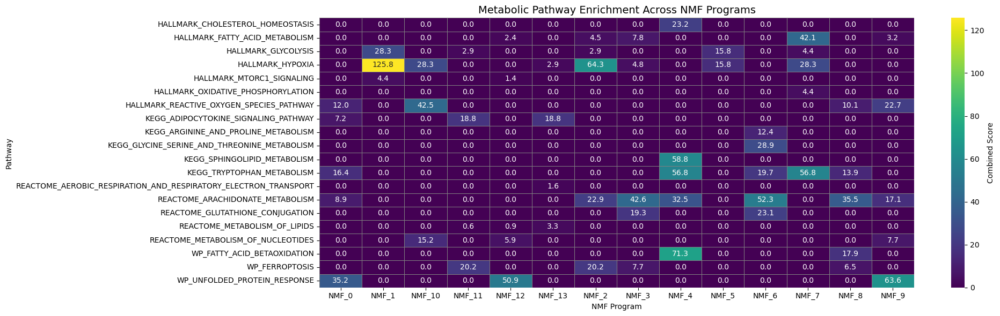

<Figure size 1680x720 with 0 Axes>

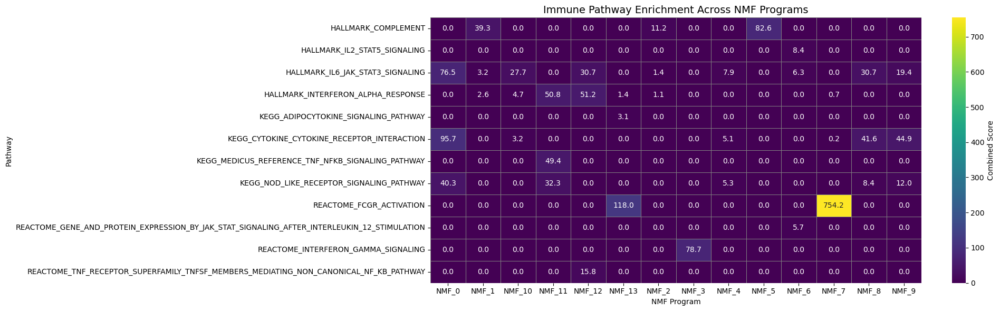

In [51]:

def plot_enrichment_heatmap(results_df, title, value_col='Combined Score'):
    
    # Keep only top 5 per NMF program for clarity
    top = (
        results_df.sort_values(value_col, ascending=False)
        .groupby('NMF_program')
        .head(5)
    )

    # Pivoting to matrix (rows = pathway, cols = NMF programs)
    heatmap_data = top.pivot_table(
        index='Term',
        columns='NMF_program',
        values=value_col,
        aggfunc='max'  
    ).fillna(0)
    n_rows, n_cols = heatmap_data.shape
    plt.figure(figsize=(max(10, n_cols*1.2), max(6, n_rows*0.6)))

    # Plot
    plt.figure(figsize=(20, 6))
    sns.heatmap(
        heatmap_data,
        cmap="viridis",
        annot=True,
        fmt=".1f",
        cbar_kws={'label': value_col},
        linewidths=0.5,   
        linecolor='grey' 
    )
    plt.title(title, fontsize=14)
    plt.ylabel("Pathway")
    plt.xlabel("NMF Program")
    plt.tight_layout()
    plt.show()

plot_enrichment_heatmap(metabolic_results, "Metabolic Pathway Enrichment Across NMF Programs")
plot_enrichment_heatmap(immune_results, "Immune Pathway Enrichment Across NMF Programs")


COMPUTING JACCARD SIMILARITY

In [52]:
# Convert to sets
nmf_genes = {nmf: set(genes) for nmf, genes in top_genes_per_program_tumor.items()}

pairs = []
for (nmf1, nmf2) in combinations(nmf_genes.keys(), 2):
    set1, set2 = nmf_genes[nmf1], nmf_genes[nmf2]
    
    # Computed Jaccard similarity
    jaccard = len(set1 & set2) / len(set1 | set2)
    
    # Computed overlap based on smaller set
    overlap = len(set1 & set2) / min(len(set1), len(set2))
    
    # Stored results
    pairs.append((nmf1, nmf2, jaccard, overlap, len(set1 & set2)))

# Created DataFrame
df_overlap = pd.DataFrame(pairs, columns=["nmf1", "nmf2", "jaccard", "overlap", "shared_genes"])

# Sorted by Jaccard
print(df_overlap.sort_values("jaccard", ascending=False).head(15))


      nmf1    nmf2   jaccard  overlap  shared_genes
75   NMF_7  NMF_13  0.315789     0.48            24
49   NMF_4   NMF_8  0.219512     0.36            18
3    NMF_0   NMF_4  0.162791     0.28            14
11   NMF_0  NMF_12  0.162791     0.28            14
88  NMF_11  NMF_12  0.162791     0.28            14
51   NMF_4  NMF_10  0.149425     0.26            13
83   NMF_9  NMF_12  0.123596     0.22            11
9    NMF_0  NMF_10  0.123596     0.22            11
7    NMF_0   NMF_8  0.123596     0.22            11
77   NMF_8  NMF_10  0.098901     0.18             9
27   NMF_2   NMF_5  0.086957     0.16             8
53   NMF_4  NMF_12  0.086957     0.16             8
43   NMF_3  NMF_11  0.086957     0.16             8
8    NMF_0   NMF_9  0.075269     0.14             7
86  NMF_10  NMF_12  0.063830     0.12             6


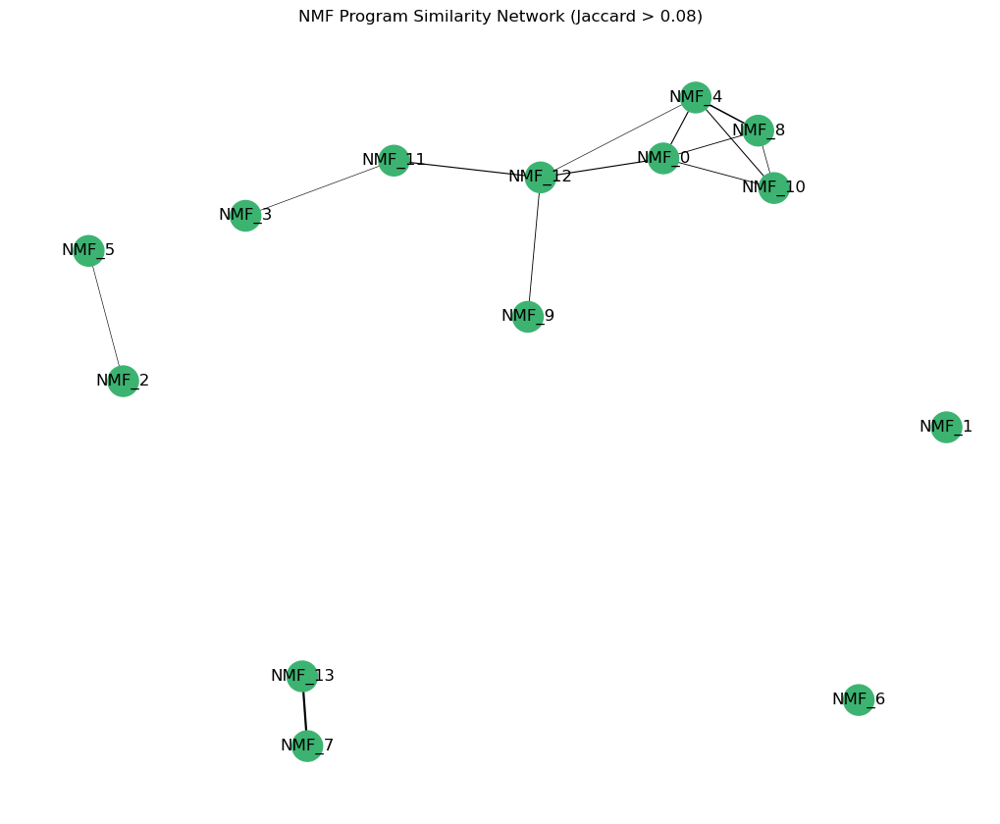

In [53]:
#Computing Network Visualization for NMFs
G = nx.Graph()

# Add nodes
for nmf, genes in nmf_genes.items():
    G.add_node(nmf, size=len(genes))

# Add edges based on Jaccard threshold
for _, row in df_overlap.iterrows():
    if row['jaccard'] > 0.08:  # threshold for clarity
        G.add_edge(row['nmf1'], row['nmf2'], weight=row['jaccard'])

pos = nx.spring_layout(G, seed=42)
edges = G.edges()
weights = [G[u][v]['weight']*5 for u,v in edges]  
node_color='orchid'  

plt.figure(figsize=(10,8))
nx.draw(G, pos, with_labels=True, width=weights, node_size=[G.nodes[n]['size']*10 for n in G.nodes()], node_color='mediumseagreen')
plt.title('NMF Program Similarity Network (Jaccard > 0.08)')
plt.show()



IMMUNE CELLS NMF

c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\sklearn\decomposition\_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\sklearn\decomposition\_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
c:\Users\user\Downloads\anaconda\envs\scanpy\lib\site-packages\sklearn\decomposition\_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


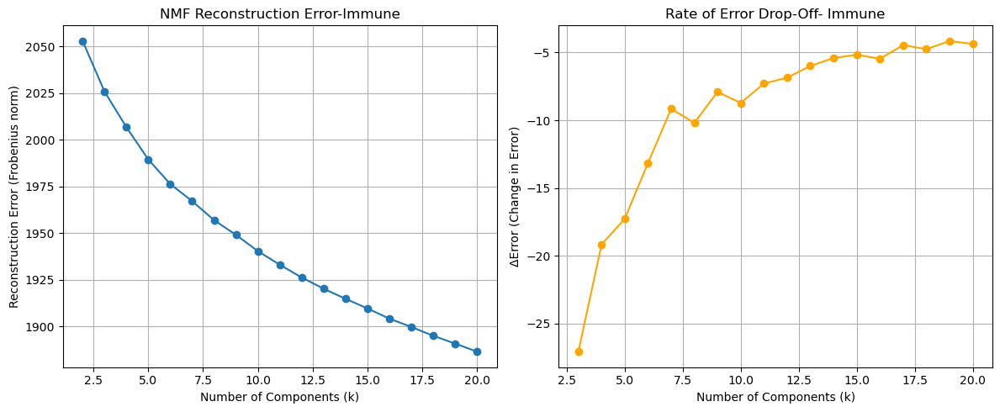

In [54]:
#Select highly variable genes
sc.pp.highly_variable_genes(
    immune_cells,
    flavor="seurat",
    n_top_genes=2000,
    subset=False
)

#Subset to HVGs
immune_hvg = immune_cells[:, immune_cells.var['highly_variable']].copy()
X = immune_hvg.X
if not isinstance(X, np.ndarray):
    X = X.toarray()

#Tested a range of components
component_range = range(2, 21)
errors = []

for k in component_range:
    model = NMF(n_components=k, init='nndsvd', random_state=0)
    W = model.fit_transform(X)
    H = model.components_
    reconstruction = np.dot(W, H)
    error = np.linalg.norm(X - reconstruction, ord='fro')
    errors.append(error)

# Computed ΔError (rate of change)
delta_errors = np.diff(errors)

# Plotted reconstruction error and ΔError
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Plotted reconstruction error
ax[0].plot(component_range, errors, marker='o')
ax[0].set_xlabel('Number of Components (k)')
ax[0].set_ylabel('Reconstruction Error (Frobenius norm)')
ax[0].set_title('NMF Reconstruction Error-Immune')
ax[0].grid(True)

# Plotted ΔError to detect elbow
ax[1].plot(component_range[1:], delta_errors, marker='o', color='orange')
ax[1].set_xlabel('Number of Components (k)')
ax[1].set_ylabel('ΔError (Change in Error)')
ax[1].set_title('Rate of Error Drop-Off- Immune')
ax[1].grid(True)

plt.tight_layout()
plt.show()


In [55]:
# Run NMF with k components 
n_components = 11
nmf_model = NMF(n_components=n_components, init='nndsvd', random_state=0)
W = nmf_model.fit_transform(X) 
H = nmf_model.components_       


immune_hvg.obsm['X_nmf'] = W

nmf_df = pd.DataFrame(H.T, index=immune_hvg.var_names, columns=[f'NMF_{i}' for i in range(n_components)])
immune_hvg.varm['NMF'] = nmf_df.values

# Created a dictionary of top genes per NMF component
top_genes_per_program_immune = {}

for i in range(n_components):
    gene_weights = H[i]
    top_indices = np.argsort(gene_weights)[::-1][:50]  # top 50 genes
    top_genes = immune_hvg.var_names[top_indices]
    top_genes_per_program_immune[f'NMF_{i}'] = top_genes.tolist()
    
for i in range(n_components):
    immune_hvg.obs[f'NMF_{i}'] = W[:, i]


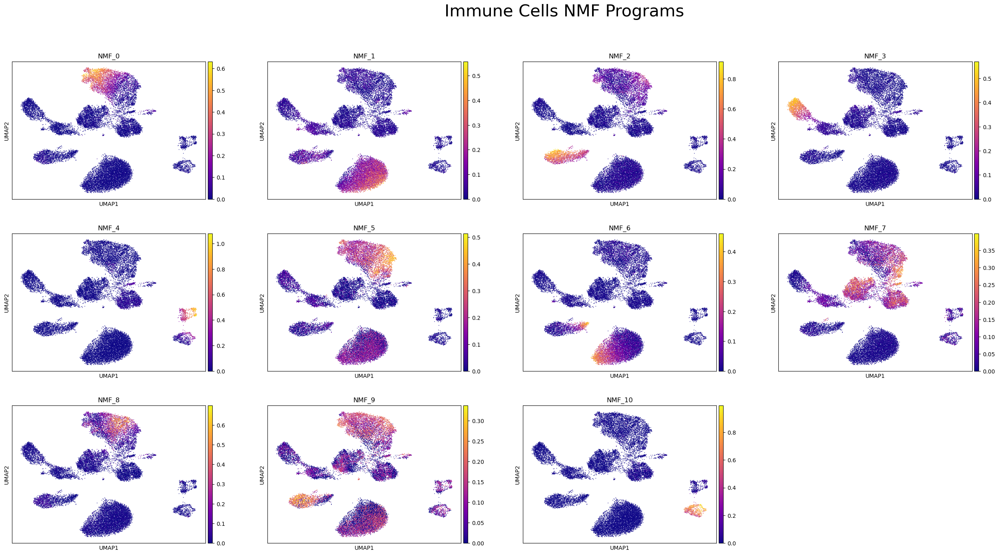

In [56]:
#UMAP visualization of NMF programs

sc.pl.umap(
    immune_hvg,
    color=[f'NMF_{i}' for i in range(n_components)],
    cmap='plasma',
    wspace=0.2,
    show=False  # prevent immediate rendering
)

plt.suptitle("Immune Cells NMF Programs", fontsize=30)
plt.show()

In [57]:
#Ranked genes per program
gene_names = np.array(immune_hvg.var_names)
ranked_genes_per_program_immune = {}

for i in range(n_components):
    weights = H[i]
    df = pd.DataFrame({
        'gene': gene_names,
        'weight': weights
    })
    df_sorted = df.sort_values(by='weight', ascending=False)
    ranked_genes_per_program_immune[f'NMF_{i}'] = df_sorted.reset_index(drop=True)

# To check - print top 10 genes for component 0
print(ranked_genes_per_program_immune['NMF_0'].head(10))

# Saved ranked lists
for i in range(n_components):
    ranked_genes_per_program_immune[f'NMF_{i}'].to_csv(f'ranked_genes_NMF_{i}.csv', index=False)

# Saved top 50 genes separately
for program, genes in top_genes_per_program_immune.items():
    with open(f"{program}_top_genes.txt", "w") as f:
        for gene in genes:
            f.write(gene + "\n")

top_genes_per_program_immune

      gene     weight
0     APOE  10.493222
1    CCL18   8.175988
2    APOC1   6.424043
3     CTSL   5.778928
4     PLTP   5.754261
5   RNASE1   4.419628
6     MAFB   3.847779
7     IER3   3.761883
8     EGR1   3.431173
9  SELENOP   3.325891


{'NMF_0': ['APOE',
  'CCL18',
  'APOC1',
  'CTSL',
  'PLTP',
  'RNASE1',
  'MAFB',
  'IER3',
  'EGR1',
  'SELENOP',
  'CXCL3',
  'HMOX1',
  'LYZ',
  'GADD45B',
  'NPL',
  'IL1B',
  'F13A1',
  'SDS',
  'PDK4',
  'CCL4',
  'GPR183',
  'PLAU',
  'HBEGF',
  'APOC2',
  'CCL3',
  'CCL13',
  'MT2A',
  'CCL20',
  'HES1',
  'CHIT1',
  'MAFF',
  'PLPP3',
  'HS3ST2',
  'SORT1',
  'MMP9',
  'PHACTR1',
  'CD209',
  'THBS1',
  'SPARC',
  'FN1',
  'RRAGD',
  'RALGDS',
  'IL6',
  'SLC31A2',
  'SNTB1',
  'BLOC1S2',
  'CXCL9',
  'TGM2',
  'EPB41L2',
  'MAN1C1'],
 'NMF_1': ['IFIT3',
  'FFAR2',
  'CREB5',
  'IFIT2',
  'ARHGEF40',
  'SECTM1',
  'CHI3L1',
  'TNFRSF10C',
  'DOK3',
  'HOTAIRM1',
  'PBX2',
  'KATNBL1',
  'HSPA6',
  'PARP9',
  'PIGX',
  'GLT1D1',
  'LINC01506',
  'PROK2',
  'SLCO3A1',
  'LIMK2',
  'TMEM71',
  'CRISPLD2',
  'SRPK2',
  'AC023157.3',
  'ULK1',
  'IFIT1',
  'DUSP6',
  'TRANK1',
  'HPCAL1',
  'IMPA2',
  'IL1RN',
  'AL034397.3',
  'TMEM164',
  'ISG15',
  'FAM8A1',
  'MEFV',
  'TLR4',


NMF_0 — Anti-inflammatory Macrophages / M2-like MoMacDC
NMF_1 — Inflammatory Macrophages / NF-κB–driven MoMacDC
NMF_2 — Interferon-Stimulated Myeloid Cells / ISG⁺ Monocytes
NMF_3 — Cytotoxic NK/T Cells
NMF_4 — Plasma Cells (IgA⁺ subtype)
NMF 5-Remodeling Macrophages / ECM-Interacting MoMacDC
NMF_6 — Granulocytic Precursors / Immature Neutrophils
NMF_7 — Effector T Cells / CD8⁺ Memory-like
NMF_8 — Hybrid Macrophages / Stress-Adaptive MoMacDC
NMF_9 — NF-κB–Driven Inflammatory Macrophages
NMF_10 — Plasma Cells (IgG⁺ subtype)



In [58]:

gene_names = np.array(immune_hvg.var_names)

ranked_genes_per_program = {}

for i in range(n_components):
    # Getting weights for this component
    weights = H[i]
    
    # Created DataFrame with genes and weights
    df = pd.DataFrame({
        'gene': gene_names,
        'weight': weights
    })
    
    # Sort by weight descending
    df_sorted = df.sort_values(by='weight', ascending=False)
    
    # Store full ranked list
    ranked_genes_per_program[f'NMF_{i}'] = df_sorted.reset_index(drop=True)

# To check- display top 10 genes for component 0
print(ranked_genes_per_program['NMF_0'].head(10))




      gene     weight
0     APOE  10.493222
1    CCL18   8.175988
2    APOC1   6.424043
3     CTSL   5.778928
4     PLTP   5.754261
5   RNASE1   4.419628
6     MAFB   3.847779
7     IER3   3.761883
8     EGR1   3.431173
9  SELENOP   3.325891


In [59]:
expr_mat = immune_hvg.X.toarray() if hasattr(immune_hvg.X, "toarray") else immune_hvg.X

# Create DataFrame: rows = cells, columns = genes
expr_df = pd.DataFrame(expr_mat, index=immune_hvg.obs_names, columns=immune_hvg.var_names)

# Transpose to genes x cells as expected by gseapy
expr_df_T = expr_df.T

In [60]:

for gmt_file in gmt_files:
    metabolic_gene_sets = parse_gmt_into_dict(gmt_file, metabolic_gene_sets)

# Ran ssGSEA with core metabolism pathways

ssgsea_results = ssgsea(
    data=expr_df_T,
    gene_sets=metabolic_gene_sets,
    sample_norm_method='rank',
    outdir=None,
    permutation_num=0,
    no_plot=True
)

pathway_scores = ssgsea_results.res2d.T


In [61]:
nmf_enrichment_results = []

for program, genes in top_genes_per_program_immune.items():
    top_genes = genes[:500]  # adjust as needed

    # Kept only genes that occur in at least one metabolic pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in metabolic_gene_sets.values())]

    if len(top_genes) == 0:
        print(f"No matching genes for {program}, skipping enrichment.")
        continue

    # Run enrichment analysis
    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=metabolic_gene_sets,   
        organism='Human',
        outdir=None,
        cutoff=0.05
    )

    df = enr.results.copy()
    df['NMF_program'] = program
    nmf_enrichment_results.append(df)

# Combined all results
all_nmf_results = pd.concat(nmf_enrichment_results, ignore_index=True) if nmf_enrichment_results else pd.DataFrame()

# Showing top hits per NMF program
if not all_nmf_results.empty:
    for prog in all_nmf_results['NMF_program'].unique():
        print(f"\nTop enriched metabolic pathways for {prog}:\n")
        display(
            all_nmf_results[all_nmf_results['NMF_program'] == prog]
            .sort_values(by='Adjusted P-value')
            .head(5)
        )


Top enriched metabolic pathways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
1,gs_ind_0,HALLMARK_HYPOXIA,7/200,0.000017,0.000153,16.042205,176.207961,TGM2;IL6;RRAGD;HMOX1;MT2A;IER3;MAFF,NMF_0
3,gs_ind_0,KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM,1/31,0.153556,0.426453,9.487119,17.775933,SDS,NMF_0
4,gs_ind_0,KEGG_SPHINGOLIPID_METABOLISM,1/39,0.189534,0.426453,7.486085,12.450739,PLPP3,NMF_0
8,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.120890,0.426453,12.355623,26.105889,IL1B,NMF_0
7,gs_ind_0,WP_FERROPTOSIS,1/64,0.293194,0.439790,4.482565,5.499757,HMOX1,NMF_0



Top enriched metabolic pathways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
9,gs_ind_0,KEGG_ONE_CARBON_POOL_BY_FOLATE,1/17,0.016393,0.032786,124.151515,510.373314,MTHFS,NMF_1
10,gs_ind_0,KEGG_REGULATION_OF_AUTOPHAGY,1/35,0.033603,0.033603,58.855072,199.703555,ULK1,NMF_1



Top enriched metabolic pathways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
13,gs_ind_0,HALLMARK_HYPOXIA,4/200,0.004366,0.030565,9.478372,51.503795,ADM;MAFF;TGM2;IER3,NMF_2
14,gs_ind_0,KEGG_ONE_CARBON_POOL_BY_FOLATE,1/17,0.064068,0.208569,24.757576,68.029021,MTHFS,NMF_2
17,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.089387,0.208569,17.323404,41.832280,IL1B,NMF_2
15,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.207201,0.362602,6.839316,10.765528,PTGS2,NMF_2
11,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.471438,0.650767,2.414603,1.815703,G0S2,NMF_2



Top enriched metabolic pathways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
19,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.007587,0.030348,24.900621,121.548026,AKR1C3;PTGDS,NMF_3
20,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,4/756,0.063173,0.126345,5.220598,14.418687,OSBPL5;AKR1C3;LPIN2;PTGDS,NMF_3
21,gs_ind_0,WP_FERROPTOSIS,1/64,0.145718,0.194290,10.490814,20.206199,AKR1C3,NMF_3
18,gs_ind_0,HALLMARK_HYPOXIA,1/200,0.399268,0.399268,3.111947,2.857150,MT2A,NMF_3



Top enriched metabolic pathways for NMF_4:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
23,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.049071,0.122149,9.392947,28.314986,MXI1;MT2A,NMF_4
24,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.091611,0.122149,17.801178,42.548357,PDLIM1,NMF_4
25,gs_ind_0,REACTOME_LYSOSOME_VESICLE_BIOGENESIS,1/35,0.066108,0.122149,25.198758,68.451564,TXNDC5,NMF_4
22,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.334742,0.334742,4.003222,4.381104,MXI1,NMF_4



Top enriched metabolic pathways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
31,gs_ind_0,KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM,1/31,0.100562,0.452529,15.355612,35.271562,SDS,NMF_5
34,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.078647,0.452529,19.998363,50.851498,IL1B,NMF_5
28,gs_ind_0,HALLMARK_HYPOXIA,1/200,0.510227,0.574005,2.152111,1.448156,HMOX1,NMF_5
26,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.427507,0.574005,2.787546,2.368812,ACAA1,NMF_5
29,gs_ind_0,HALLMARK_MTORC1_SIGNALING,1/200,0.510227,0.574005,2.152111,1.448156,IFI30,NMF_5



Top enriched metabolic pathways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
38,gs_ind_0,KEGG_ONE_CARBON_POOL_BY_FOLATE,1/17,0.048424,0.279559,33.793388,102.318504,MTHFS,NMF_6
37,gs_ind_0,KEGG_ARGININE_AND_PROLINE_METABOLISM,1/54,0.147094,0.279559,10.233645,19.614658,ARG1,NMF_6
40,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.159748,0.279559,9.335664,17.123071,PTGS2,NMF_6
39,gs_ind_0,KEGG_REGULATION_OF_AUTOPHAGY,1/35,0.097550,0.279559,16.019763,37.284257,ULK1,NMF_6
35,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.379950,0.531930,3.296104,3.189691,G0S2,NMF_6



Top enriched metabolic pathways for NMF_7:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
43,gs_ind_0,HALLMARK_HYPOXIA,4/200,0.002361,0.009444,12.193021,73.751264,MT1E;MXI1;MT2A;MAFF,NMF_7
42,gs_ind_0,HALLMARK_GLYCOLYSIS,1/200,0.510227,0.792778,2.152111,1.448156,MXI1,NMF_7
44,gs_ind_0,REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_E...,1/261,0.612039,0.792778,1.594124,0.782651,MT-ND6,NMF_7
45,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,2/756,0.792778,0.792778,0.786493,0.182633,LPIN2;PLD4,NMF_7



Top enriched metabolic pathways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
49,gs_ind_0,HALLMARK_HYPOXIA,4/200,0.004366,0.034931,9.478372,51.503795,MT2A;TGM2;RRAGD;HMOX1,NMF_8
50,gs_ind_0,KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM,1/31,0.114104,0.332042,13.301639,28.873172,SDS,NMF_8
52,gs_ind_0,WP_FATTY_ACID_BETAOXIDATION,1/34,0.124516,0.332042,12.092537,25.192667,LPL,NMF_8
46,gs_ind_0,HALLMARK_CHOLESTEROL_HOMEOSTASIS,1/74,0.253460,0.337947,5.402721,7.415496,LPL,NMF_8
53,gs_ind_0,WP_FERROPTOSIS,1/64,0.222892,0.337947,6.285039,9.434273,HMOX1,NMF_8



Top enriched metabolic pathways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
55,gs_ind_0,HALLMARK_HYPOXIA,5/200,0.000738,0.003689,11.643933,83.975604,IL6;MXI1;KLF7;IER3;MAFF,NMF_9
56,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,2/67,0.032198,0.080494,10.139949,34.839451,TNF;NFKBIA,NMF_9
58,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.100006,0.166677,15.277847,35.177621,IL1B,NMF_9
54,gs_ind_0,HALLMARK_GLYCOLYSIS,2/200,0.214011,0.267514,3.122586,4.814177,MXI1;IER3,NMF_9
57,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,1/756,0.983598,0.983598,0.304239,0.005031,SP1,NMF_9



Top enriched metabolic pathways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
59,gs_ind_0,REACTOME_LYSOSOME_VESICLE_BIOGENESIS,1/35,0.033603,0.067206,58.855072,199.703555,TXNDC5,NMF_10
60,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,1/756,0.598061,0.598061,1.733289,0.891020,PIP5K1A,NMF_10


In [62]:
metabolic_results = all_nmf_results.copy()  # after metabolic enrichment


In [63]:


ssgsea_results = ssgsea(
    data=expr_df_T,
    gene_sets=immune_gene_sets,
    sample_norm_method='rank',
    outdir=None,
    permutation_num=0,
    no_plot=True
)

pathway_scores = ssgsea_results.res2d.T

nmf_enrichment_results = []

for program, genes in top_genes_per_program_immune.items():
    top_genes = genes[:500]  # or adjust as needed

    # Filtered genes to those present in at least one pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in immune_gene_sets.values())]
    
    if len(top_genes) == 0:
        print(f"No matching genes for {program}, skipping enrichment.")
        continue

    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=immune_gene_sets,
        organism='Human',
        outdir=None,
        cutoff=0.05
    )
    
    if isinstance(enr.results, list):
        df = pd.DataFrame(enr.results)
    else:
        df = enr.results

    df['NMF_program'] = program
    nmf_enrichment_results.append(df)

# Combined results
if nmf_enrichment_results:
    all_nmf_results = pd.concat(nmf_enrichment_results, ignore_index=True)
else:
    all_nmf_results = pd.DataFrame()
for prog in all_nmf_results['NMF_program'].unique():
    print(f"\nTop enriched metabolic pathways for {prog}:\n")
    display(all_nmf_results[all_nmf_results['NMF_program'] == prog]
            .sort_values('Adjusted P-value')
            .head(7))



Top enriched metabolic pathways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
3,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,9/264,0.011083,0.038792,3.395303,15.286699,CCL13;IL6;CCL20;CCL4;CXCL3;CCL3;CXCL9;CCL18;IL1B,NMF_0
2,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,5/87,0.008933,0.038792,5.138272,24.242521,IL6;HMOX1;CXCL3;CXCL9;IL1B,NMF_0
4,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,3/62,0.069721,0.162681,4.036053,10.749062,CCL13;IL6;IL1B,NMF_0
0,gs_ind_0,HALLMARK_COMPLEMENT,5/200,0.194821,0.340936,1.932841,3.161502,CTSL;IL6;FN1;MAFF;APOC1,NMF_0
1,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.387044,0.541861,1.472352,1.397582,RRAGD;MAFF;TGM2;GADD45B,NMF_0
5,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.804210,0.804210,0.901538,0.196440,CTSL,NMF_0
6,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,1/98,0.804210,0.804210,0.901538,0.196440,MT2A,NMF_0



Top enriched metabolic pathways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
8,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,5/97,0.000386,0.002317,13.735135,107.946964,IFIT3;ISG15;PARP9;RSAD2;IFIT2,NMF_1
7,gs_ind_0,HALLMARK_COMPLEMENT,1/200,0.824986,0.907480,0.824856,0.158693,DUSP6,NMF_1
9,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,1/264,0.907480,0.907480,0.581650,0.056469,TNFRSF10C,NMF_1
10,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,0.685456,0.907480,1.287007,0.486065,TNFRSF10C,NMF_1
11,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.396562,0.907480,3.071736,2.841116,MEFV,NMF_1
12,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.556014,0.907480,1.872398,1.099026,TLR4,NMF_1



Top enriched metabolic pathways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
17,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,8/264,0.003212,0.019272,5.250930,30.144839,CXCL1;CCL4L2;CCL4;CCL3L3;IL1A;CCL3;OSM;IL1B,NMF_2
18,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.154512,0.463536,3.835789,7.163274,CXCL1;IL1B,NMF_2
13,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.405828,0.486994,1.570464,1.416285,CXCL1;MAFF;TIMP1,NMF_2
14,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,3/199,0.402444,0.486994,1.580153,1.438256,MAFF;TGM2;GADD45B,NMF_2
15,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.260836,0.486994,2.650648,3.562111,CXCL1;IL1B,NMF_2
16,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.687285,0.687285,1.282694,0.481018,CCRL2,NMF_2



Top enriched metabolic pathways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
22,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,3/137,0.108193,0.454778,3.457497,7.688913,PRF1;SH2D1B;GZMB,NMF_3
21,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,4/264,0.181911,0.454778,2.313450,3.942665,CCL4;IL18RAP;CX3CR1;XCL2,NMF_3
20,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,2/199,0.543475,0.743106,1.390171,0.847686,SYT11;RABGAP1L,NMF_3
23,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,1/98,0.594485,0.743106,1.673684,0.870416,MT2A,NMF_3
19,gs_ind_0,HALLMARK_COMPLEMENT,1/200,0.855935,0.855935,0.737238,0.114686,GZMB,NMF_3



Top enriched metabolic pathways for NMF_4:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
27,gs_ind_0,REACTOME_FCGR_ACTIVATION,3/69,0.009547,0.047735,10.205742,47.472352,IGLC3;IGLC2;IGLV6-57,NMF_4
25,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,3/199,0.149324,0.248873,3.032848,5.767383,IRF4;GADD45B;RABGAP1L,NMF_4
28,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,2/98,0.145745,0.248873,4.131128,7.956121,IRF4;MT2A,NMF_4
24,gs_ind_0,HALLMARK_COMPLEMENT,1/200,0.787429,0.787429,0.935840,0.223649,GZMB,NMF_4
26,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,0.642147,0.787429,1.460073,0.646722,GZMB,NMF_4



Top enriched metabolic pathways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
30,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,4/87,0.009755,0.068282,6.628743,30.691238,CXCL9;IL1B;HMOX1;CXCL3,NMF_5
32,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,5/264,0.120849,0.315703,2.457161,5.192506,CCL20;CXCL3;INHBA;CXCL9;IL1B,NMF_5
33,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.135301,0.315703,4.205037,8.411128,IL1B;NLRP3,NMF_5
35,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,2/98,0.276037,0.483064,2.547496,3.279191,IFI30;HLA-DQB2,NMF_5
29,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.353760,0.495264,1.737642,1.805647,CTSL;FN1;TIMP1,NMF_5
31,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.657864,0.661801,1.395585,0.584411,IFI30,NMF_5
34,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.661801,0.661801,1.379933,0.569624,CTSL,NMF_5



Top enriched metabolic pathways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
36,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.284344,0.527546,2.621047,3.296148,S100A12;F5,NMF_6
37,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,0.422037,0.527546,1.846561,1.592960,TNFRSF10C;IL18RAP,NMF_6
39,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.417578,0.527546,2.902098,2.534357,TLR4,NMF_6
40,gs_ind_0,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,1/38,0.184427,0.527546,7.981818,13.493270,LMNB1,NMF_6
38,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,0.536987,0.536987,1.995005,1.240457,TNFRSF10C,NMF_6



Top enriched metabolic pathways for NMF_7:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
42,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,5/199,0.018294,0.073176,4.814910,19.265300,IRF4;GADD45B;MAFF;CTLA4;RABGAP1L,NMF_7
44,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,3/98,0.047372,0.094744,5.060035,15.431727,IRF4;MT2A;HLA-DQB2,NMF_7
41,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.249084,0.332112,2.205738,3.065900,GZMK;MAFF;TIMP1,NMF_7
43,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,1/264,0.929076,0.929076,0.519824,0.038241,TNFSF9,NMF_7



Top enriched metabolic pathways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
45,gs_ind_0,HALLMARK_COMPLEMENT,5/200,0.194821,0.587276,1.932841,3.161502,CTSL;FN1;TIMP1;MMP12;APOC1,NMF_8
47,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,3/87,0.152597,0.587276,2.775148,5.217146,IL3RA;HMOX1;CXCL3,NMF_8
49,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.220229,0.587276,1.739033,2.631311,CCL20;IL3RA;CXCL3;INHBA;CXCL5;CCL2,NMF_8
46,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.387044,0.738775,1.472352,1.397582,IL3RA;TGM2;RRAGD;SPP1,NMF_8
48,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.461734,0.738775,1.630176,1.259744,IFIT3;ISG15,NMF_8
50,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.637371,0.804210,1.479443,0.666346,CCL2,NMF_8
51,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,1/98,0.804210,0.804210,0.901538,0.196440,CTSL,NMF_8



Top enriched metabolic pathways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
58,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,11/264,0.001057,0.010572,4.635225,31.761251,IL6;CCL20;CCL4L2;CCL4;TNF;IL23A;CXCL3;IL1A;CCL...,NMF_9
61,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,5/62,0.002606,0.013030,7.022189,41.781483,IL6;TNF;NLRP3;NFKBIA;IL1B,NMF_9
59,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,2/16,0.027490,0.091633,10.911330,39.214677,TNF;NFKBIA,NMF_9
55,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,4/87,0.050609,0.126522,3.610778,10.773221,TNF;IL6;IL1B;CXCL3,NMF_9
57,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,2/67,0.308457,0.616913,2.304253,2.710202,TNF;NFKBIA,NMF_9
56,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,0.817996,0.912568,0.861644,0.173103,CCRL2,NMF_9
53,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.674835,0.912568,0.992942,0.390511,DUSP6;IL6;MAFF,NMF_9



Top enriched metabolic pathways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program
65,gs_ind_0,REACTOME_FCGR_ACTIVATION,7/69,7.223984e-08,2.167195e-07,51.336000,844.131921,IGHG1;IGLV3-1;IGHG2;IGLV6-57;IGHG4;IGLC2;IGLC3,NMF_10
63,gs_ind_0,HALLMARK_COMPLEMENT,1/200,8.249860e-01,8.249860e-01,0.824856,0.158693,TIMP1,NMF_10
64,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,8.232959e-01,8.249860e-01,0.829901,0.161366,GADD45B,NMF_10


In [64]:
immune_results = all_nmf_results.copy()     # after immune enrichment

In [65]:
metabolic_results['Pathway_Type'] = 'Metabolic'
immune_results['Pathway_Type'] = 'Immune'

combined_results = pd.concat([metabolic_results, immune_results], ignore_index=True)

<Figure size 1320x1080 with 0 Axes>

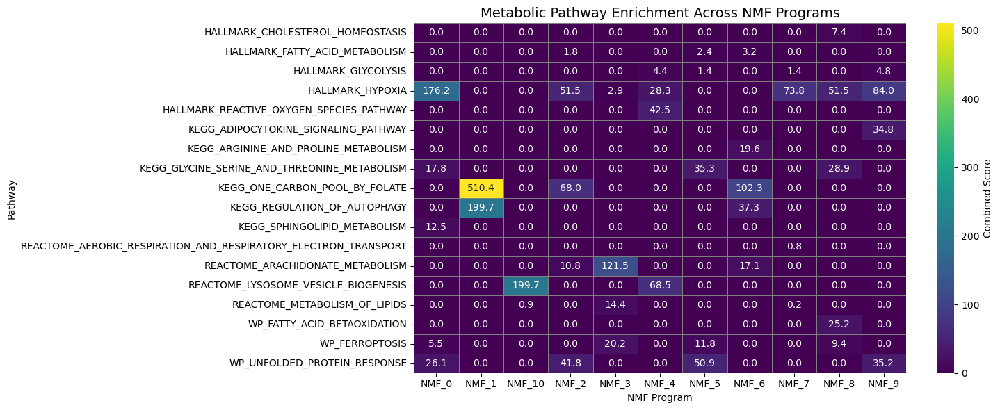

<Figure size 1320x780 with 0 Axes>

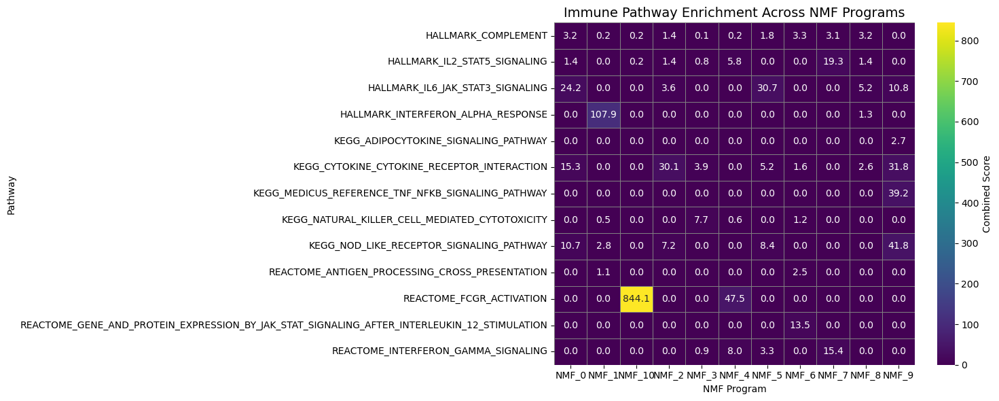

In [66]:
def plot_enrichment_heatmap(results_df, title, value_col='Combined Score'):

    # Kept only top 5 per NMF program for clarity
    top = (
        results_df.sort_values(value_col, ascending=False)
        .groupby('NMF_program')
        .head(5)
    )

    # Pivot to matrix (rows = pathway, cols = NMF programs)
    heatmap_data = top.pivot_table(
        index='Term',
        columns='NMF_program',
        values=value_col,
        aggfunc='max'  
    ).fillna(0)
    n_rows, n_cols = heatmap_data.shape
    plt.figure(figsize=(max(10, n_cols*1.2), max(6, n_rows*0.6)))

    # Plot
    plt.figure(figsize=(15, 6))
    sns.heatmap(
        heatmap_data,
        cmap="viridis",
        annot=True,
        fmt=".1f",
        cbar_kws={'label': value_col},
        linewidths=0.5,   
        linecolor='grey'  #
    )
    plt.title(title, fontsize=14)
    plt.ylabel("Pathway")
    plt.xlabel("NMF Program")
    plt.tight_layout()
    plt.show()

plot_enrichment_heatmap(metabolic_results, "Metabolic Pathway Enrichment Across NMF Programs")
plot_enrichment_heatmap(immune_results, "Immune Pathway Enrichment Across NMF Programs")


COMPUTING JACCARD SIMILARITY 

In [67]:
# Convert to sets
nmf_genes = {nmf: set(genes) for nmf, genes in top_genes_per_program_immune.items()}

pairs = []
for (nmf1, nmf2) in combinations(nmf_genes.keys(), 2):
    set1, set2 = nmf_genes[nmf1], nmf_genes[nmf2]
    
    # Compute Jaccard similarity
    jaccard = len(set1 & set2) / len(set1 | set2)
    
    # Compute overlap based on smaller set
    overlap = len(set1 & set2) / min(len(set1), len(set2))
    
    # Store results
    pairs.append((nmf1, nmf2, jaccard, overlap, len(set1 & set2)))

# Create DataFrame
df_overlap = pd.DataFrame(pairs, columns=["nmf1", "nmf2", "jaccard", "overlap", "shared_genes"])

# Sort by Jaccard
print(df_overlap.sort_values("jaccard", ascending=False).head(15))


     nmf1    nmf2   jaccard  overlap  shared_genes
39  NMF_4  NMF_10  0.408451     0.58            29
7   NMF_0   NMF_8  0.265823     0.42            21
42  NMF_5   NMF_8  0.234568     0.38            19
14  NMF_1   NMF_6  0.204819     0.34            17
4   NMF_0   NMF_5  0.190476     0.32            16
25  NMF_2   NMF_9  0.162791     0.28            14
8   NMF_0   NMF_9  0.149425     0.26            13
1   NMF_0   NMF_2  0.136364     0.24            12
41  NMF_5   NMF_7  0.123596     0.22            11
22  NMF_2   NMF_6  0.123596     0.22            11
49  NMF_7   NMF_8  0.098901     0.18             9
36  NMF_4   NMF_7  0.098901     0.18             9
30  NMF_3   NMF_7  0.098901     0.18             9
23  NMF_2   NMF_7  0.098901     0.18             9
24  NMF_2   NMF_8  0.086957     0.16             8


C:\Users\user\AppData\Local\Temp\ipykernel_28144\4078516481.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.408451' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  similarity_matrix.loc[row['nmf1'], row['nmf2']] = row['jaccard']
C:\Users\user\AppData\Local\Temp\ipykernel_28144\4078516481.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.408451' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  similarity_matrix.loc[row['nmf2'], row['nmf1']] = row['jaccard']
C:\Users\user\AppData\Local\Temp\ipykernel_28144\4078516481.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.265823' has dtype incompatible with int64, please explicitly cast to a compatible 

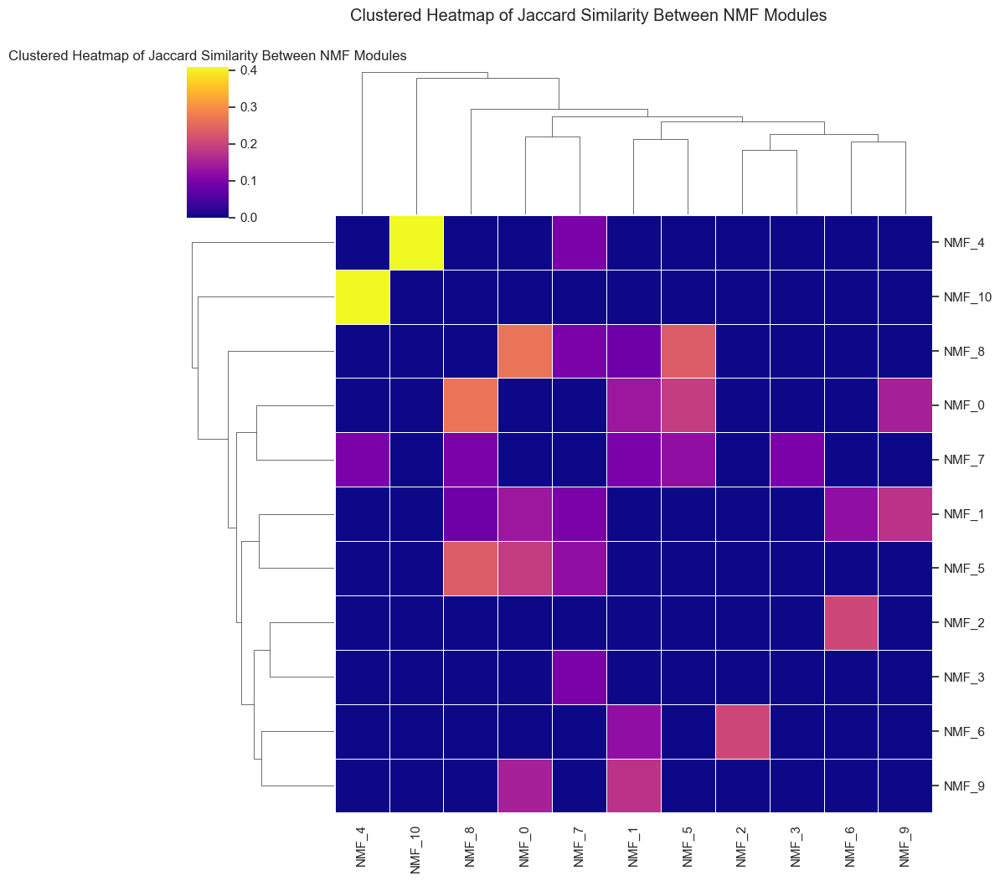

In [68]:
# Define the data
data = {
    'nmf1': ['NMF_4','NMF_0','NMF_5','NMF_2','NMF_0','NMF_1','NMF_0','NMF_0','NMF_5','NMF_1','NMF_1','NMF_3','NMF_7','NMF_4','NMF_1'],
    'nmf2': ['NMF_10','NMF_8','NMF_8','NMF_6','NMF_5','NMF_9','NMF_9','NMF_1','NMF_7','NMF_6','NMF_7','NMF_7','NMF_8','NMF_7','NMF_8'],
    'jaccard': [0.408451,0.265823,0.234568,0.204819,0.190476,0.176471,0.149425,0.136364,0.123596, 0.123596, 0.098901, 0.098901, 0.098901, 0.098901, 0.086957]
}

# Create DataFrame
df = pd.DataFrame(data)

# Get unique modules
modules = sorted(set(df['nmf1']).union(set(df['nmf2'])))

# Create similarity matrix
similarity_matrix = pd.DataFrame(0, index=modules, columns=modules)
for _, row in df.iterrows():
    similarity_matrix.loc[row['nmf1'], row['nmf2']] = row['jaccard']
    similarity_matrix.loc[row['nmf2'], row['nmf1']] = row['jaccard']

# Clustered heatmap
sns.set(style='whitegrid')
g = sns.clustermap(similarity_matrix, cmap='plasma', linewidths=0.5, figsize=(10, 10), metric='euclidean', method='average')
plt.title('Clustered Heatmap of Jaccard Similarity Between NMF Modules')
g.fig.suptitle('Clustered Heatmap of Jaccard Similarity Between NMF Modules', y=1.05)
g.savefig('nmf_jaccard_heatmap.png')

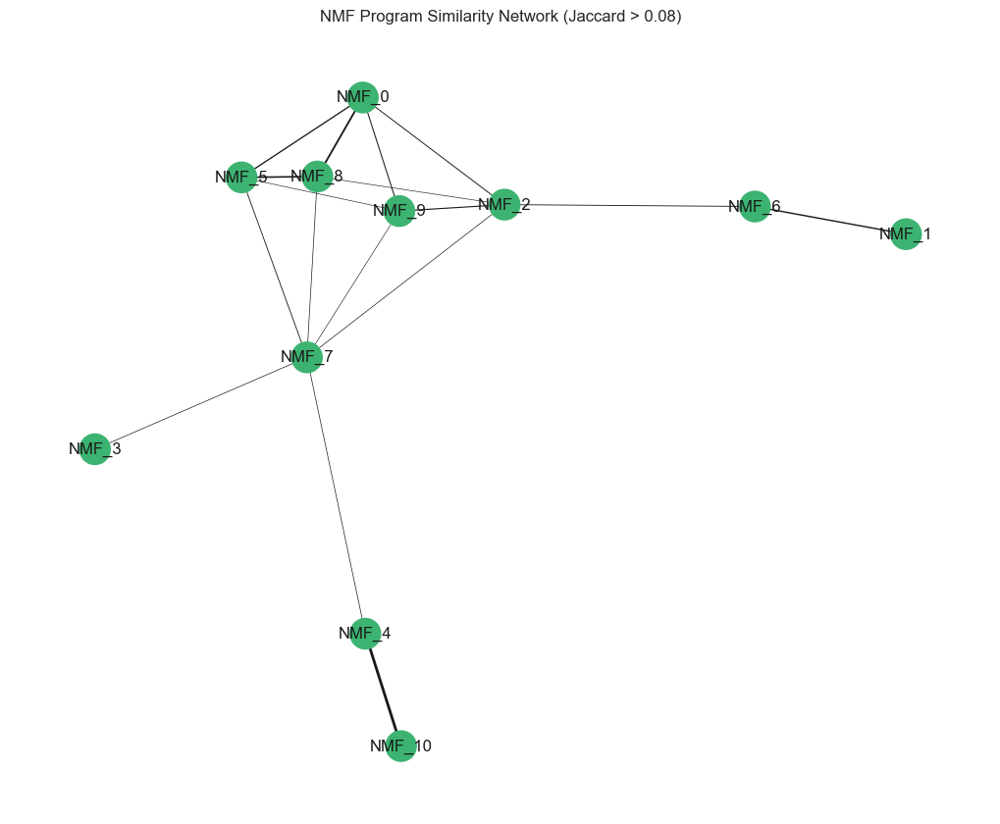

In [69]:
#COMPUTING NETWORK GRAPH Visualization for NMFs
G = nx.Graph()

# Add nodes
for nmf, genes in nmf_genes.items():
    G.add_node(nmf, size=len(genes))

# Add edges based on Jaccard threshold
for _, row in df_overlap.iterrows():
    if row['jaccard'] > 0.08:  # threshold for clarity
        G.add_edge(row['nmf1'], row['nmf2'], weight=row['jaccard'])

pos = nx.spring_layout(G, seed=42)
edges = G.edges()
weights = [G[u][v]['weight']*5 for u,v in edges]  # scale edge width
node_color='orchid'  # or '#FF9999'

plt.figure(figsize=(10,8))
nx.draw(G, pos, with_labels=True, width=weights, node_size=[G.nodes[n]['size']*10 for n in G.nodes()], node_color='mediumseagreen')
plt.title('NMF Program Similarity Network (Jaccard > 0.08)')
plt.show()



TUMOR IMMUNE NMF

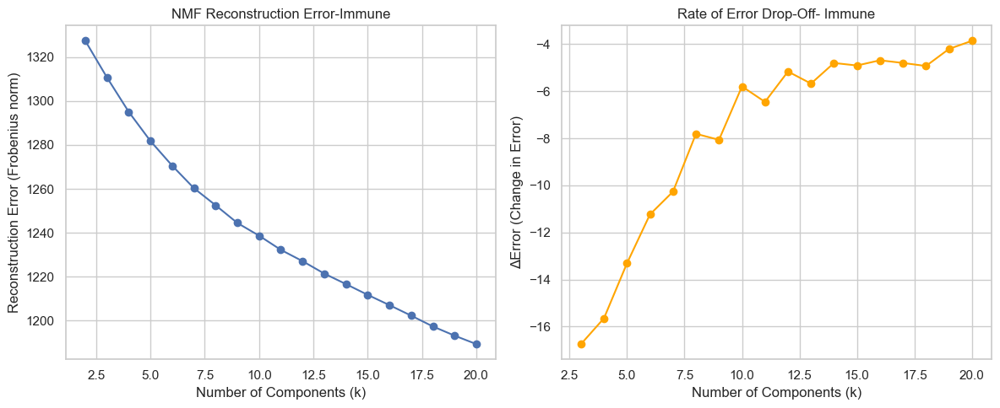

In [70]:
# Select highly variable genes
sc.pp.highly_variable_genes(
    tumor_only_cells,
    flavor="seurat",
    n_top_genes=2000,
    subset=False
)

#Subset to HVGs
immtum_hvg = tumor_only_cells[:, tumor_only_cells.var['highly_variable']].copy()
X = immtum_hvg.X
if not isinstance(X, np.ndarray):
    X = X.toarray()

# Test a range of components
component_range = range(2, 21)
errors = []

for k in component_range:
    model = NMF(n_components=k, init='nndsvd', random_state=0)
    W = model.fit_transform(X)
    H = model.components_
    reconstruction = np.dot(W, H)
    error = np.linalg.norm(X - reconstruction, ord='fro')
    errors.append(error)

# Compute ΔError (rate of change)
delta_errors = np.diff(errors)

# Plot reconstruction error and ΔError
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Plot reconstruction error
ax[0].plot(component_range, errors, marker='o')
ax[0].set_xlabel('Number of Components (k)')
ax[0].set_ylabel('Reconstruction Error (Frobenius norm)')
ax[0].set_title('NMF Reconstruction Error-Immune')
ax[0].grid(True)

# Plot ΔError to detect elbow
ax[1].plot(component_range[1:], delta_errors, marker='o', color='orange')
ax[1].set_xlabel('Number of Components (k)')
ax[1].set_ylabel('ΔError (Change in Error)')
ax[1].set_title('Rate of Error Drop-Off- Immune')
ax[1].grid(True)

plt.tight_layout()
plt.show()


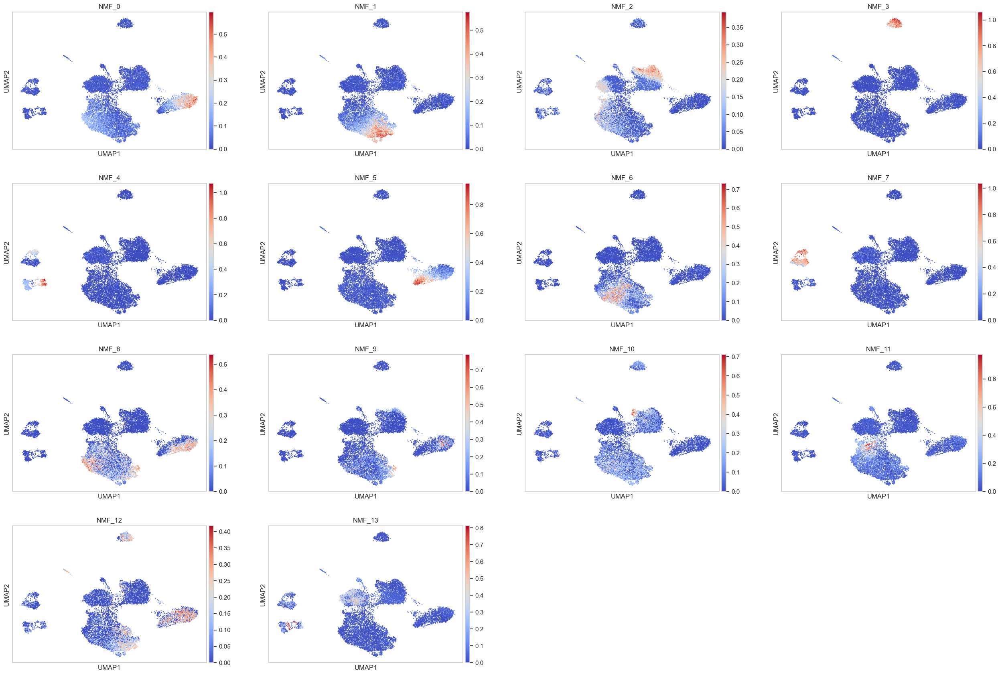

In [71]:
# Run NMF with k components (number of gene programs)
n_components = 14
nmf_model = NMF(n_components=n_components, init='nndsvd', random_state=0)
W = nmf_model.fit_transform(X)  # cells × components
H = nmf_model.components_       # components × genes


immtum_hvg.obsm['X_nmf'] = W

nmf_df = pd.DataFrame(H.T, index=immtum_hvg.var_names, columns=[f'NMF_{i}' for i in range(n_components)])
immtum_hvg.varm['NMF'] = nmf_df.values

# Creating a dictionary of top genes per NMF component
top_genes_per_program_immtum = {}

for i in range(n_components):
    gene_weights = H[i]
    top_indices = np.argsort(gene_weights)[::-1][:50]  # top 50 genes
    top_genes = immtum_hvg.var_names[top_indices]
    top_genes_per_program_immtum[f'NMF_{i}'] = top_genes.tolist()
  
for i in range(n_components):
    immtum_hvg.obs[f'NMF_{i}'] = W[:, i]

sc.pl.umap(immtum_hvg,     color=[f'NMF_{i}' for i in range(n_components)]
, cmap='coolwarm', wspace=0.2)

1) NMF0- Leiden 2
2) NMF 1 - Leiden 5
3) NMF 2- Leiden 3
4) NMF 3- Leidne 13
5) NMF 4- Leiden 3
6) NMF 5- Leiden 9
7) NMF 6- Leiden 4
8) NMF 7- Leiden 15 and leiden 12
9) NMF 8- Leiden 2 and Leiden 4
10) NMF 9- Leiden 2
11) NMF 10- Leiden 3
12) NMF 11- Leiden 7
13) NMF 12- Leiden 2, Leiden 6
14) NMF 13- Leiden 11, Leiden 0

In [72]:
#Ranked genes per program
gene_names = np.array(immtum_hvg.var_names)
ranked_genes_per_program_immtum = {}

for i in range(n_components):
    weights = H[i]
    df = pd.DataFrame({
        'gene': gene_names,
        'weight': weights
    })
    df_sorted = df.sort_values(by='weight', ascending=False)
    ranked_genes_per_program_immtum[f'NMF_{i}'] = df_sorted.reset_index(drop=True)


top_genes_per_program_immtum

{'NMF_0': ['G0S2',
  'PPIF',
  'IVNS1ABP',
  'OSM',
  'TREM1',
  'PLEK',
  'C15orf48',
  'PI3',
  'HCAR2',
  'KATNBL1',
  'HCAR3',
  'LPCAT1',
  'MTHFS',
  'CLEC4A',
  'TGM2',
  'IRAK2',
  'LRG1',
  'TMEM140',
  'ATP2B1-AS1',
  'IFIT3',
  'CXCL1',
  'TNFAIP6',
  'NSMAF',
  'ADM',
  'AL356273.3',
  'FFAR2',
  'PLPP3',
  'ADORA2A',
  'CCL4L2',
  'FPR2',
  'CPD',
  'SLPI',
  'DDX60L',
  'CLEC4E',
  'ISG15',
  'DGAT2',
  'AC023157.3',
  'TNFSF14',
  'TBC1D7',
  'IL3RA',
  'ADGRG3',
  'RRAGC',
  'SCARF1',
  'DOCK5',
  'HES4',
  'NBN',
  'PHLDA2',
  'DCUN1D3',
  'CXCR2',
  'RIT1'],
 'NMF_1': ['CCL18',
  'GPNMB',
  'SELENOP',
  'CXCL3',
  'SLC40A1',
  'CCL13',
  'THBS1',
  'IFI27',
  'PLPP3',
  'CHIT1',
  'HS3ST2',
  'PLEK',
  'SPARC',
  'B3GNT7',
  'FN1',
  'TGM2',
  'CD209',
  'HES1',
  'MMP9',
  'IVNS1ABP',
  'SNTB1',
  'ATP6V0D2',
  'MAN1C1',
  'TBC1D2',
  'TLR4',
  'CYP1B1',
  'EPB41L2',
  'LILRB5',
  'LY96',
  'LATS2',
  'CH25H',
  'IL6',
  'DSC2',
  'LPL',
  'IFIT3',
  'SLC16A6',
  'OS

NMF_0 – NF-κB–Driven Inflammatory Monocyte Program
NMF_1 – CCL18⁺ Immunosuppressive TAM Program
NMF_2 – CD8⁺ Cytotoxic T Cell Program
NMF_3 – CPA3⁺ Degranulating Mast Cell Program
NMF_4 – IGHA⁺ Secretory Plasma Cell Program
NMF_5 – CXCR2⁺ Stress-Primed Inflammatory Neutrophil Program
NMF_6 – SPP1⁺ ECM-Remodeling TAM Program
NMF_7- IGHG⁺ Mature Plasma Cell Program
NMF_8- IL1B⁺ NF-κB–Driven Inflammatory Monocyte Program
NMF_9- TNF⁺ Chemokine-Rich Myeloid Activation Program
NMF_10- MT⁺ Stress-Buffered Cytotoxic T Cell Program
NMF_11- CD1C⁺ Conventional Dendritic Cell / Antigen Presentation Program
NMF_12- Stress-Adaptive Monocyte–TAM Transition Program
NMF_13- IGHM⁺ Naive/Memory B Cell Program


In [73]:
expr_mat = immtum_hvg.X.toarray() if hasattr(immtum_hvg.X, "toarray") else immtum_hvg.X

# Create DataFrame: rows = cells, columns = genes
expr_df = pd.DataFrame(expr_mat, index=immtum_hvg.obs_names, columns=immtum_hvg.var_names)

# Transpose to genes x cells as expected by gseapy
expr_df_T = expr_df.T

In [75]:
metabolic_gene_sets = { 
    # Energy & Carbon
    "HALLMARK_GLYCOLYSIS": [],
    "HALLMARK_OXIDATIVE_PHOSPHORYLATION": [],
    "KEGG_PENTOSE_PHOSPHATE_PATHWAY": [],
    "KEGG_CITRATE_CYCLE_TCA_CYCLE": [],
    "KEGG_ONE_CARBON_POOL_BY_FOLATE": [],
    
    # Lipid-related
    "HALLMARK_FATTY_ACID_METABOLISM": [],
    "REACTOME_METABOLISM_OF_LIPIDS": [],
    "WP_FATTY_ACID_BETAOXIDATION": [],
    "KEGG_SPHINGOLIPID_METABOLISM": [],
    "REACTOME_GLUTATHIONE_SYNTHESIS_AND_RECYCLING": [],
    "KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY": [],
    "REACTOME_GLUTATHIONE_CONJUGATION": [],
    "REACTOME_ARACHIDONATE_METABOLISM": [],


    
    # Amino acid metabolism
    "KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM": [],
    "KEGG_ARGININE_AND_PROLINE_METABOLISM": [],
    "KEGG_TRYPTOPHAN_METABOLISM": [],
    "REACTOME_GLUTAMATE_AND_GLUTAMINE_METABOLISM": [],
    "KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM": [],
    
    # Redox & stress
    "HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY": [],
    "HALLMARK_HYPOXIA": [],
    "WP_UNFOLDED_PROTEIN_RESPONSE": [],
    "REACTOME_HEME_BIOSYNTHESIS": [],
    "REACTOME_CELLULAR_RESPONSE_TO_MITOCHONDRIAL_STRESS": [],
    "REACTOME_CELLULAR_RESPONSE_TO_HYPOXIA": [],
    "WP_FERROPTOSIS": [],
    
    # Signaling & regulation (only metabolism-related)
    "HALLMARK_MTORC1_SIGNALING": [],
    "KEGG_REGULATION_OF_AUTOPHAGY": [],
    
    # Proliferation & biomass
    "REACTOME_METABOLISM_OF_NUCLEOTIDES": [],
    "HALLMARK_CHOLESTEROL_HOMEOSTASIS": [],
    "REACTOME_LYSOSOME_VESICLE_BIOGENESIS": [],
    
    # Energy metabolism expansion
    "REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_ELECTRON_TRANSPORT": []
}



# Function to parse GMTs
def parse_gmt_into_dict(file_path, gene_set_dict):
    with open(file_path, 'r') as file:
        for line in file:
            entries = line.strip().split('\t')
            pathway_name = entries[0]
            genes = entries[2:]
            for key in gene_set_dict.keys():
                if key.lower().replace("_", "") in pathway_name.lower().replace("_", ""):
                    gene_set_dict[key] = genes
    return gene_set_dict

# Listed only core GMTs
gmt_files = [
    "HALLMARK_FATTY_ACID_METABOLISM.v2025.1.Hs.gmt",
    "HALLMARK_CHOLESTEROL_HOMEOSTASIS.v2025.1.Hs.gmt",
    "HALLMARK_GLYCOLYSIS.v2025.1.Hs.gmt",
    "HALLMARK_HYPOXIA.v2025.1.Hs.gmt",
    "HALLMARK_IL2_STAT5_SIGNALING.v2025.1.Hs.gmt",
    "HALLMARK_MTORC1_SIGNALING.v2025.1.Hs.gmt",
    "HALLMARK_IL6_JAK_STAT3_SIGNALING.v2025.1.Hs.gmt",
    "HALLMARK_OXIDATIVE_PHOSPHORYLATION.v2025.1.Hs.gmt",
    "HALLMARK_IL6_JAK_STAT3_SIGNALING.v2025.1.Hs.gmt",
    "KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_ARGININE_AND_PROLINE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_CITRATE_CYCLE_TCA_CYCLE.v2025.1.Hs.gmt",
    "KEGG_PENTOSE_PHOSPHATE_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_JAK_STAT_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "KEGG_REGULATION_OF_AUTOPHAGY.v2025.1.Hs.gmt",
    "KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION.v2025.1.Hs.gmt",
    "HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY.v2025.1.Hs.gmt",
    "REACTOME_METABOLISM_OF_LIPIDS.v2025.1.Hs.gmt",
    "REACTOME_METABOLISM_OF_NUCLEOTIDES.v2025.1.Hs.gmt",
    "REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_ELECTRON_TRANSPORT.v2025.1.Hs.gmt",
    "REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_STAT_SIGNALING_AFTER_INTERLEUKIN_12_STIMULATION.v2025.1.Hs.gmt",
    "REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBERS_MEDIATING_NON_CANONICAL_NF_KB_PATHWAY.v2025.1.Hs.gmt",
    "REACTOME_INNATE_IMMUNE_SYSTEM.v2025.1.Hs.gmt",
    "REACTOME_HEME_BIOSYNTHESIS.v2025.1.Hs.gmt",
    "REACTOME_ADAPTIVE_IMMUNE_SYSTEM.v2025.1.Hs.gmt",
    "REACTOME_CELLULAR_RESPONSE_TO_MITOCHONDRIAL_STRESS.v2025.1.Hs.gmt",
    "REACTOME_FCGR_ACTIVATION.v2025.1.Hs.gmt",
    "REACTOME_IMMUNE_SYSTEM.v2025.1.Hs.gmt",
    "REACTOME_CELLULAR_RESPONSE_TO_HYPOXIA.v2025.1.Hs.gmt",
    "WP_UNFOLDED_PROTEIN_RESPONSE.v2025.1.Hs.gmt",
    "REACTOME_GLUTAMATE_AND_GLUTAMINE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_TRYPTOPHAN_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_SPHINGOLIPID_METABOLISM.v2025.1.Hs.gmt",
    "WP_FATTY_ACID_BETAOXIDATION.v2025.1.Hs.gmt",
    "KEGG_ONE_CARBON_POOL_BY_FOLATE.v2025.1.Hs.gmt",
    "KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY.v2025.1.Hs.gmt",
    "REACTOME_LYSOSOME_VESICLE_BIOGENESIS.v2025.1.Hs.gmt",
    "WP_FERROPTOSIS.v2025.1.Hs.gmt",
    "HALLMARK_COMPLEMENT.v2025.1.Hs.gmt",
    "REACTOME_AUTOPHAGY.v2025.1.Hs.gmt",
    "REACTOME_GLUTATHIONE_SYNTHESIS_AND_RECYCLING.v2025.1.Hs.gmt",
    "REACTOME_GLUTATHIONE_CONJUGATION.v2025.1.Hs.gmt",
    "REACTOME_ARACHIDONATE_METABOLISM.v2025.1.Hs.gmt",
    "KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY.v2025.1.Hs.gmt",
    "HALLMARK_INTERFERON_ALPHA_RESPONSE.v2025.1.Hs.gmt",
    "REACTOME_INTERFERON_GAMMA_SIGNALING.v2025.1.Hs.gmt",
    "REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION.v2025.1.Hs.gmt"

]

# Update gene sets
for gmt_file in gmt_files:
    metabolic_gene_sets = parse_gmt_into_dict(gmt_file, metabolic_gene_sets)

# Run ssGSEA with just core metabolism pathways

ssgsea_results = ssgsea(
    data=expr_df_T,
    gene_sets=metabolic_gene_sets,
    sample_norm_method='rank',
    outdir=None,
    permutation_num=0,
    no_plot=True
)

pathway_scores = ssgsea_results.res2d.T
nmf_enrichment_results = []
metabolic_results = []

for program, genes in top_genes_per_program_immtum.items():
    top_genes = genes[:500]  # adjust as needed

    # Keep only genes that occur in at least one metabolic pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in metabolic_gene_sets.values())]

    if len(top_genes) == 0:
        print(f"No matching genes for {program}, skipping enrichment.")
        continue

    # Run enrichment analysis
    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=metabolic_gene_sets,   
        organism='Human',
        outdir=None,
        cutoff=0.05
    )

    df = enr.results.copy()
    df['NMF_program'] = program
    df['Category'] = 'Metabolic'
    metabolic_results.append(df)

    nmf_enrichment_results.append(df)

# Combine all results
metabolic_results = pd.concat(metabolic_results, ignore_index=True)

# Show top hits per NMF program
if not metabolic_results.empty:
    for prog in metabolic_results['NMF_program'].unique():
        print(f"\nTop enriched metabolic pathways for {prog}:\n")
        display(
            metabolic_results[metabolic_results['NMF_program'] == prog]
            .sort_values(by='Adjusted P-value')
            .head(5)
        )



No matching genes for NMF_4, skipping enrichment.
No matching genes for NMF_7, skipping enrichment.

Top enriched metabolic pathways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
0,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,2/158,0.146802,0.315795,4.050053,7.770730,G0S2;NBN,NMF_0,Metabolic
3,gs_ind_0,KEGG_ONE_CARBON_POOL_BY_FOLATE,1/17,0.071799,0.315795,21.834225,57.508687,MTHFS,NMF_0,Metabolic
4,gs_ind_0,KEGG_SPHINGOLIPID_METABOLISM,1/39,0.157898,0.315795,9.256684,17.086064,PLPP3,NMF_0,Metabolic
1,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.214011,0.321017,3.122586,4.814177,ADM;TGM2,NMF_0,Metabolic
5,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,4/756,0.431207,0.517449,1.419450,1.193993,PLPP3;DGAT2;G0S2;LPCAT1,NMF_0,Metabolic



Top enriched metabolic pathways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
11,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.025374,0.228363,11.597101,42.608251,CYP1B1;DPEP2,NMF_1,Metabolic
6,gs_ind_0,HALLMARK_CHOLESTEROL_HOMEOSTASIS,1/74,0.280304,0.360391,4.764706,6.060141,LPL,NMF_1,Metabolic
9,gs_ind_0,KEGG_SPHINGOLIPID_METABOLISM,1/39,0.157898,0.360391,9.256684,17.086064,PLPP3,NMF_1,Metabolic
8,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.214011,0.360391,3.122586,4.814177,TGM2;IL6,NMF_1,Metabolic
13,gs_ind_0,WP_FATTY_ACID_BETAOXIDATION,1/34,0.138979,0.360391,10.664618,21.045867,LPL,NMF_1,Metabolic



Top enriched metabolic pathways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
15,gs_ind_0,REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_E...,1/261,0.126331,0.126331,20.792706,43.016975,RMND5A,NMF_2,Metabolic



Top enriched metabolic pathways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
25,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,3/59,0.002303,0.029935,16.523304,100.357120,PTGS2;HPGDS;HPGD,NMF_3,Metabolic
22,gs_ind_0,KEGG_GLYCINE_SERINE_AND_THREONINE_METABOLISM,1/31,0.140598,0.462642,10.490940,20.581665,MAOB,NMF_3,Metabolic
24,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.177939,0.462642,8.064624,13.922064,MAOB,NMF_3,Metabolic
23,gs_ind_0,KEGG_PENTOSE_PHOSPHATE_PATHWAY,1/27,0.123517,0.462642,12.098312,25.302113,PRPS2,NMF_3,Metabolic
26,gs_ind_0,REACTOME_GLUTATHIONE_CONJUGATION,1/36,0.161527,0.462642,8.991105,16.391513,HPGDS,NMF_3,Metabolic



Top enriched metabolic pathways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
32,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.015355,0.092132,15.830040,66.110835,CYP4F3;PTGS2,NMF_5,Metabolic
31,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.154874,0.429267,9.570975,17.851258,CDKN2D,NMF_5,Metabolic
34,gs_ind_0,REACTOME_METABOLISM_OF_NUCLEOTIDES,1/97,0.286178,0.429267,4.695496,5.874727,CDA,NMF_5,Metabolic
33,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,4/756,0.226563,0.429267,2.233982,3.316862,CYP4F3;PTGS2;G0S2;DGAT2,NMF_5,Metabolic
29,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.427507,0.510227,2.787546,2.368812,G0S2,NMF_5,Metabolic



Top enriched metabolic pathways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
38,gs_ind_0,KEGG_SPHINGOLIPID_METABOLISM,1/39,0.108175,0.221629,14.327037,31.863447,SPHK1,NMF_6,Metabolic
37,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.107792,0.221629,5.212706,11.611592,SERPINE1;TGM2,NMF_6,Metabolic
42,gs_ind_0,WP_FATTY_ACID_BETAOXIDATION,1/34,0.094877,0.221629,16.506106,38.874701,LPL,NMF_6,Metabolic
39,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.110814,0.221629,13.957422,30.704902,CYP1B1,NMF_6,Metabolic
40,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.159748,0.255597,9.335664,17.123071,CYP1B1,NMF_6,Metabolic



Top enriched metabolic pathways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
47,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,2/59,0.025374,0.177616,11.597101,42.608251,PTGS2;CYP1B1,NMF_8,Metabolic
43,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,2/158,0.146802,0.282864,4.050053,7.770730,G0S2;NBN,NMF_8,Metabolic
49,gs_ind_0,WP_UNFOLDED_PROTEIN_RESPONSE,1/24,0.100006,0.282864,15.277847,35.177621,IL1B,NMF_8,Metabolic
46,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.161637,0.282864,9.017870,16.434207,CYP1B1,NMF_8,Metabolic
44,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.214011,0.299615,3.122586,4.814177,ADM;IL6,NMF_8,Metabolic



Top enriched metabolic pathways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
50,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,2/158,0.071065,0.224587,6.760738,17.876441,G0S2;NBN,NMF_9,Metabolic
51,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.107792,0.224587,5.212706,11.611592,PDGFB;IL6,NMF_9,Metabolic
52,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.179669,0.224587,8.179768,14.041696,TNF,NMF_9,Metabolic
53,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.159748,0.224587,9.335664,17.123071,PTGS2,NMF_9,Metabolic
54,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,2/756,0.710333,0.710333,0.962006,0.329026,PTGS2;G0S2,NMF_9,Metabolic



Top enriched metabolic pathways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
56,gs_ind_0,HALLMARK_HYPOXIA,2/200,0.026197,0.052394,15.663308,57.047504,MT2A;MT1E,NMF_10,Metabolic
55,gs_ind_0,HALLMARK_FATTY_ACID_METABOLISM,1/158,0.212425,0.212425,7.262857,11.251372,NBN,NMF_10,Metabolic



Top enriched metabolic pathways for NMF_11:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
58,gs_ind_0,KEGG_PENTOSE_PHOSPHATE_PATHWAY,1/27,0.051296,0.150554,32.935310,97.822820,PRPS2,NMF_11,Metabolic
59,gs_ind_0,KEGG_TRYPTOPHAN_METABOLISM,1/40,0.075277,0.150554,21.954792,56.787781,IDO1,NMF_11,Metabolic
57,gs_ind_0,HALLMARK_MTORC1_SIGNALING,1/200,0.334742,0.446323,4.003222,4.381104,IFI30,NMF_11,Metabolic
60,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,1/756,0.838625,0.838625,0.741704,0.130533,PLD4,NMF_11,Metabolic



Top enriched metabolic pathways for NMF_12:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
62,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.179669,0.269504,8.179768,14.041696,TNF,NMF_12,Metabolic
63,gs_ind_0,KEGG_ONE_CARBON_POOL_BY_FOLATE,1/17,0.048424,0.269504,33.793388,102.318504,MTHFS,NMF_12,Metabolic
64,gs_ind_0,REACTOME_ARACHIDONATE_METABOLISM,1/59,0.159748,0.269504,9.335664,17.123071,PTGS2,NMF_12,Metabolic
66,gs_ind_0,WP_FERROPTOSIS,1/64,0.172245,0.269504,8.579098,15.089214,SLC40A1,NMF_12,Metabolic
61,gs_ind_0,HALLMARK_HYPOXIA,1/200,0.457563,0.549076,2.544771,1.989606,ADM,NMF_12,Metabolic



Top enriched metabolic pathways for NMF_13:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
67,gs_ind_0,HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,1/49,0.154874,0.226563,9.570975,17.851258,PDLIM1,NMF_13,Metabolic
68,gs_ind_0,REACTOME_AEROBIC_RESPIRATION_AND_RESPIRATORY_E...,2/261,0.218039,0.226563,3.153792,4.803482,RMND5A;DMAC2,NMF_13,Metabolic
69,gs_ind_0,REACTOME_METABOLISM_OF_LIPIDS,4/756,0.226563,0.226563,2.233982,3.316862,PIP4P1;SP1;LPCAT1;PLD4,NMF_13,Metabolic


In [76]:
immune_gene_sets = {
    "HALLMARK_IL2_STAT5_SIGNALING": [],
    "HALLMARK_IL6_JAK_STAT3_SIGNALING": [],
    "KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION": [],
    "KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY": [],
    "KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY": [],
    "KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY": [],
    "REACTOME_FCGR_ACTIVATION": [],
    "REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBERS_MEDIATING_NON_CANONICAL_NF_KB_PATHWAY": [],
    "REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_STAT_SIGNALING_AFTER_INTERLEUKIN_12_STIMULATION": [],
    "HALLMARK_COMPLEMENT": [],
    "KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY": [],
    "HALLMARK_INTERFERON_ALPHA_RESPONSE": [],
    "REACTOME_INTERFERON_GAMMA_SIGNALING": [],
    "REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION": []
}
        

def parse_gmt_into_dict(file_path, gene_set_dict):
    with open(file_path, 'r') as file:
        for line in file:
            entries = line.strip().split('\t')
            pathway_name = entries[0]
            genes = entries[2:]
            for key in gene_set_dict.keys():
                if key.lower().replace("_", "") in pathway_name.lower().replace("_", ""):
                    gene_set_dict[key] = genes
    return gene_set_dict

for gmt_file in gmt_files:
    immune_gene_sets = parse_gmt_into_dict(gmt_file, immune_gene_sets)


#Run enrichment
immune_results = []

for program, genes in top_genes_per_program_immtum.items():
    top_genes = genes[:500]  # adjust cutoff if needed

    # Kept only genes that occur in at least one immune pathway
    top_genes = [g for g in top_genes if any(g in gs for gs in immune_gene_sets.values())]

    if len(top_genes) == 0:
        # Mark skipped programs explicitly
        immune_results.append(pd.DataFrame({
            "Term": ["No enrichment found"],
            "Adjusted P-value": [None],
            "Combined Score": [None],
            "NMF_program": [program],
            "Category": ["Immune"]
        }))
        continue

    # Run enrichment
    enr = gp.enrichr(
        gene_list=top_genes,
        gene_sets=immune_gene_sets,   
        organism='Human',
        outdir=None,
        cutoff=0.05
    )

    df = enr.results.copy()
    df['NMF_program'] = program
    df['Category'] = 'Immune'
    immune_results.append(df)


# To combine results
immune_results = pd.concat(immune_results, ignore_index=True)

#Printing top hits per NMF program 
for prog in immune_results['NMF_program'].unique():
    print(f"\nTop enriched immune pathways for {prog}:\n")
    display(
        immune_results[immune_results['NMF_program'] == prog]
        .sort_values(by="Combined Score", ascending=False)
        .head(5)
    )


Top enriched immune pathways for NMF_0:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
6,gs_ind_0,REACTOME_TNF_RECEPTOR_SUPERFAMILY_TNFSF_MEMBER...,1/17,0.152958,0.354274,9.640693,18.101268,TNFSF14,NMF_0,Immune
4,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.023304,0.163130,3.984350,14.977645,CXCL1;CXCR2;IL3RA;TNFSF14;OSM;CCL4L2,NMF_0,Immune
3,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,3/97,0.059620,0.208671,4.511983,12.722702,TMEM140;IFIT3;ISG15,NMF_0,Immune
2,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.202442,0.354274,3.214835,5.135058,CXCL1;IL3RA,NMF_0,Immune
5,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.460936,0.600951,2.481998,1.922297,CXCL1,NMF_0,Immune



Top enriched immune pathways for NMF_1:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
12,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,2/62,0.135301,0.386451,4.205037,8.411128,CCL13;IL6,NMF_1,Immune
11,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,5/264,0.120849,0.386451,2.457161,5.192506,CCL13;IL6;CXCL3;CCL18;OSM,NMF_1,Immune
9,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.231513,0.386451,2.905876,4.251649,IL6;CXCL3,NMF_1,Immune
10,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.271967,0.386451,2.576664,3.355011,IFI27;IFIT3,NMF_1,Immune
13,gs_ind_0,REACTOME_ANTIGEN_PROCESSING_CROSS_PRESENTATION,2/98,0.276037,0.386451,2.547496,3.279191,TLR4;LY96,NMF_1,Immune



Top enriched immune pathways for NMF_2:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
15,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,6/199,0.032789,0.196735,3.297294,11.269016,TNFRSF18;IRF4;SYT11;BATF;TRAF1;CTLA4,NMF_2,Immune
17,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.109405,0.328214,2.296142,5.080679,CXCL13;TNFSF9;TNFRSF18;CCL4;XCL2;CXCR6,NMF_2,Immune
14,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.505483,0.742577,1.316354,0.898070,GZMK;GZMA;GZMB,NMF_2,Immune
18,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,2/137,0.554676,0.742577,1.353697,0.797829,GZMB;BRAF,NMF_2,Immune
16,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,1/87,0.698340,0.742577,1.243173,0.446361,CXCL13,NMF_2,Immune



Top enriched immune pathways for NMF_3:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
21,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.079558,0.288503,3.312807,8.385611,IL1RL1;IL18R1;LIF;CSF1,NMF_3,Immune
22,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.173863,0.288503,3.596491,6.292014,IL18R1;CSF1,NMF_3,Immune
25,gs_ind_0,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,1/38,0.288503,0.288503,4.604211,5.723259,LMNB1,NMF_3,Immune
23,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.206461,0.288503,3.189098,5.031255,GMPR;CSF1,NMF_3,Immune
24,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,4/264,0.181911,0.288503,2.313450,3.942665,IL18R1;LIF;CSF1;KIT,NMF_3,Immune



Top enriched immune pathways for NMF_4:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
29,gs_ind_0,REACTOME_FCGR_ACTIVATION,7/69,6.003062e-07,0.000003,28.466667,407.808512,IGLV3-1;IGLV2-14;IGLV6-57;IGLV3-21;IGLC2;IGLV1...,NMF_4,Immune
27,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,6.257061e-01,0.880030,1.529978,0.717368,TMEM140,NMF_4,Immune
30,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,1/98,6.296536e-01,0.880030,1.512821,0.699809,IRF4,NMF_4,Immune
28,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,7.633777e-01,0.880030,0.869674,0.234814,TNFRSF17;EGF,NMF_4,Immune
26,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,8.800304e-01,0.880030,0.670385,0.085674,IRF4,NMF_4,Immune



Top enriched immune pathways for NMF_5:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
34,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.013100,0.078598,4.875349,21.135436,CXCL1;CXCR2;IL1R2;IL18RAP;OSM;CXCR1,NMF_5,Immune
31,gs_ind_0,HALLMARK_COMPLEMENT,4/200,0.080800,0.242401,3.292425,8.283004,PLEK;CXCL1;CDA;S100A12,NMF_5,Immune
33,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.173863,0.347726,3.596491,6.292014,CXCL1;IL1R2,NMF_5,Immune
36,gs_ind_0,REACTOME_GENE_AND_PROTEIN_EXPRESSION_BY_JAK_ST...,1/38,0.288503,0.432755,4.604211,5.723259,LMNB1,NMF_5,Immune
35,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.429642,0.515571,2.745828,2.319683,CXCL1,NMF_5,Immune



Top enriched immune pathways for NMF_6:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
41,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,7/264,0.054162,0.324971,2.659683,7.755050,IL3RA;CXCL3;INHBA;CXCL5;CCL3;FLT1;CCL2,NMF_6,Immune
37,gs_ind_0,HALLMARK_COMPLEMENT,5/200,0.132715,0.398145,2.273880,4.592218,SERPINE1;PLEK;MMP8;FN1;MMP12,NMF_6,Immune
39,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,2/87,0.348413,0.593773,2.096189,2.210149,IL3RA;CXCL3,NMF_6,Immune
40,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.401029,0.593773,1.858639,1.698277,IFIT3;ISG15,NMF_6,Immune
42,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.593773,0.593773,1.673485,0.872317,CCL2,NMF_6,Immune



Top enriched immune pathways for NMF_7:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
47,gs_ind_0,REACTOME_FCGR_ACTIVATION,7/69,6.003062e-07,0.000003,28.466667,407.808512,IGHG1;IGLV3-1;IGHG2;IGLV6-57;IGHG4;IGLC2;IGLC3,NMF_7,Immune
44,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,1/97,6.257061e-01,0.881433,1.529978,0.717368,TMEM140,NMF_7,Immune
46,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,1/137,7.570729e-01,0.881433,1.039770,0.289364,GZMB,NMF_7,Immune
45,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,2/264,7.633777e-01,0.881433,0.869674,0.234814,TNFRSF17;EGF,NMF_7,Immune
43,gs_ind_0,HALLMARK_COMPLEMENT,1/200,8.814328e-01,0.881433,0.666309,0.084092,GZMB,NMF_7,Immune



Top enriched immune pathways for NMF_8:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
52,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,14/264,0.000009,0.000094,7.752034,89.744012,CXCL1;IL6;TNF;IL23A;CCL2;IL3RA;CCL3L3;IL1A;INH...,NMF_8,Immune
55,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,6/62,0.000433,0.002163,8.445835,65.418933,CXCL1;IL6;TNF;NLRP3;CCL2;IL1B,NMF_8,Immune
50,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,6/87,0.002697,0.008991,5.717580,33.822657,CXCL1;IL6;TNF;IL3RA;CXCL3;IL1B,NMF_8,Immune
53,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.248054,0.529874,5.486352,7.648580,TNF,NMF_8,Immune
48,gs_ind_0,HALLMARK_COMPLEMENT,5/200,0.264937,0.529874,1.679812,2.231234,CXCL1;SERPINB2;IL6;PLEK;FN1,NMF_8,Immune



Top enriched immune pathways for NMF_9:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
63,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,16/264,0.000012,0.000120,6.063221,68.677481,CXCL1;PDGFB;TNFSF9;IL6;CCL4;TNF;CCL8;CSF1;CXCL...,NMF_9,Immune
60,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,7/87,0.001835,0.009175,5.214873,32.857218,CXCL1;IL6;TNF;CSF1;CXCL3;CXCL9;CXCL10,NMF_9,Immune
66,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,5/62,0.009238,0.030794,4.938918,23.135974,CXCL1;IL6;CCL8;TNF;CCL2,NMF_9,Immune
58,gs_ind_0,HALLMARK_COMPLEMENT,8/200,0.056086,0.140216,2.330167,6.712894,GZMK;CXCL1;PDGFB;GZMA;IL6;PLEK;GZMB;C3,NMF_9,Immune
64,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.300342,0.500570,4.346939,5.228642,TNF,NMF_9,Immune



Top enriched immune pathways for NMF_10:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
71,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,8/97,0.000071,0.000500,8.526840,81.410152,IFI44;IFI27;IFIT3;ISG15;CXCL10;RSAD2;NMI;IFIT2,NMF_10,Immune
70,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,3/87,0.171720,0.601021,2.604447,4.588746,CXCL9;CXCL10;CXCL3,NMF_10,Immune
69,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,4/199,0.430034,0.787332,1.375877,1.161089,CXCL10;SYT11;BATF;TRAF1,NMF_10,Immune
74,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,2/98,0.496391,0.787332,1.518135,1.063289,MT2A;GBP5,NMF_10,Immune
73,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.657409,0.787332,1.398154,0.586453,NLRP3,NMF_10,Immune



Top enriched immune pathways for NMF_11:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
78,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,3/97,0.170225,0.479188,2.629630,4.656111,LAMP3;IFI30;ISG15,NMF_11,Immune
82,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,3/98,0.173987,0.479188,2.599567,4.546057,IRF4;IFI30;HLA-DQB2,NMF_11,Immune
79,gs_ind_0,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,6/264,0.179696,0.479188,1.892440,3.248356,INHBA;CXCL9;IL22RA2;FLT1;CCL17;CCL22,NMF_11,Immune
80,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.616181,0.825940,1.570584,0.760500,NLRP3,NMF_11,Immune
75,gs_ind_0,HALLMARK_COMPLEMENT,3/200,0.595853,0.825940,1.132344,0.586284,PLEK;C3;MMP12,NMF_11,Immune



Top enriched immune pathways for NMF_12:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
85,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,4/97,0.001414,0.012730,14.307869,93.874342,RSAD2;IFIT3;ISG15;IFIT2,NMF_12,Immune
88,gs_ind_0,KEGG_MEDICUS_REFERENCE_TNF_NFKB_SIGNALING_PATHWAY,1/16,0.094443,0.424992,16.652605,39.296172,TNF,NMF_12,Immune
90,gs_ind_0,KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY,1/62,0.324640,0.701866,4.024390,4.527596,TNF,NMF_12,Immune
86,gs_ind_0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1/67,0.346324,0.701866,3.704453,3.928131,TNF,NMF_12,Immune
84,gs_ind_0,HALLMARK_IL6_JAK_STAT3_SIGNALING,1/87,0.427203,0.701866,2.794575,2.376778,TNF,NMF_12,Immune



Top enriched immune pathways for NMF_13:



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,NMF_program,Category
94,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,2/97,0.113563,0.604091,4.942884,10.752726,TMEM140;IFIT3,NMF_13,Immune
96,gs_ind_0,KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY,2/137,0.201364,0.604091,3.349547,5.368127,GZMB;BRAF,NMF_13,Immune
92,gs_ind_0,HALLMARK_COMPLEMENT,2/200,0.354932,0.701866,2.142203,2.218957,CR2;GZMB,NMF_13,Immune
97,gs_ind_0,REACTOME_INTERFERON_GAMMA_SIGNALING,1/98,0.467911,0.701866,2.453254,1.863193,IRF4,NMF_13,Immune
93,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,1/199,0.739928,0.842684,1.087580,0.327582,IRF4,NMF_13,Immune


In [77]:
# Converted to sets
nmf_genes = {nmf: set(genes) for nmf, genes in top_genes_per_program_immtum.items()}

pairs = []
for (nmf1, nmf2) in combinations(nmf_genes.keys(), 2):
    set1, set2 = nmf_genes[nmf1], nmf_genes[nmf2]
    
    # Computed Jaccard similarity
    jaccard = len(set1 & set2) / len(set1 | set2)
    
    # Computed overlap based on smaller set
    overlap = len(set1 & set2) / min(len(set1), len(set2))
    
    # Stored results
    pairs.append((nmf1, nmf2, jaccard, overlap, len(set1 & set2)))

# To Create DataFrame
df_overlap = pd.DataFrame(pairs, columns=["nmf1", "nmf2", "jaccard", "overlap", "shared_genes"])

# Sort by Jaccard
print(df_overlap.sort_values("jaccard", ascending=False).head(15))


     nmf1    nmf2   jaccard  overlap  shared_genes
48  NMF_4   NMF_7  0.538462     0.70            35
76  NMF_8   NMF_9  0.234568     0.38            19
17  NMF_1   NMF_6  0.219512     0.36            18
4   NMF_0   NMF_5  0.204819     0.34            17
64  NMF_6   NMF_8  0.190476     0.32            16
35  NMF_2  NMF_13  0.190476     0.32            16
11  NMF_0  NMF_12  0.190476     0.32            16
8   NMF_0   NMF_9  0.149425     0.26            13
19  NMF_1   NMF_8  0.136364     0.24            12
81  NMF_9  NMF_10  0.136364     0.24            12
67  NMF_6  NMF_11  0.136364     0.24            12
32  NMF_2  NMF_10  0.136364     0.24            12
66  NMF_6  NMF_10  0.123596     0.22            11
7   NMF_0   NMF_8  0.111111     0.20            10
77  NMF_8  NMF_10  0.111111     0.20            10


C:\Users\user\AppData\Local\Temp\ipykernel_28144\3035773933.py:29: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.538462' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  similarity_matrix.loc[row['nmf1'], row['nmf2']] = row['jaccard']
C:\Users\user\AppData\Local\Temp\ipykernel_28144\3035773933.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.538462' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  similarity_matrix.loc[row['nmf2'], row['nmf1']] = row['jaccard']
C:\Users\user\AppData\Local\Temp\ipykernel_28144\3035773933.py:29: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.234568' has dtype incompatible with int64, please explicitly cast to a compatible 

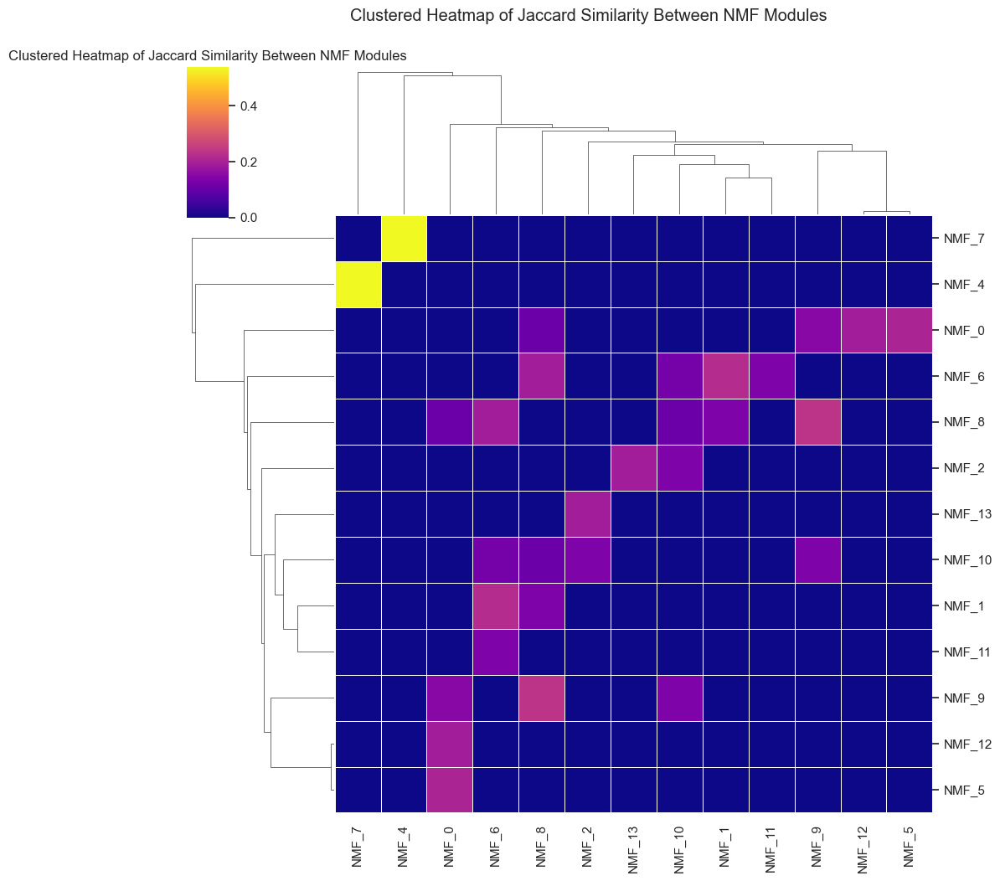

In [78]:

# Define the data
data = {
    'nmf1': [
        'NMF_4', 'NMF_8', 'NMF_1', 'NMF_0', 'NMF_6',
        'NMF_2', 'NMF_0', 'NMF_0', 'NMF_1', 'NMF_9',
        'NMF_6', 'NMF_2', 'NMF_6', 'NMF_0', 'NMF_8'
    ],
    'nmf2': [
        'NMF_7', 'NMF_9', 'NMF_6', 'NMF_5', 'NMF_8',
        'NMF_13', 'NMF_12', 'NMF_9', 'NMF_8', 'NMF_10',
        'NMF_11', 'NMF_10', 'NMF_10', 'NMF_8', 'NMF_10'
    ],
    'jaccard': [
        0.538462, 0.234568, 0.219512, 0.204819, 0.190476,
        0.190476, 0.190476, 0.149425, 0.136364, 0.136364,
        0.136364, 0.136364, 0.123596, 0.111111, 0.111111
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Get unique modules
modules = sorted(set(df['nmf1']).union(set(df['nmf2'])))

# Create similarity matrix
similarity_matrix = pd.DataFrame(0, index=modules, columns=modules)
for _, row in df.iterrows():
    similarity_matrix.loc[row['nmf1'], row['nmf2']] = row['jaccard']
    similarity_matrix.loc[row['nmf2'], row['nmf1']] = row['jaccard']

# Clustered heatmap
sns.set(style='whitegrid')
g = sns.clustermap(similarity_matrix, cmap='plasma', linewidths=0.5, figsize=(10, 10), metric='euclidean', method='average')
plt.title('Clustered Heatmap of Jaccard Similarity Between NMF Modules')
g.fig.suptitle('Clustered Heatmap of Jaccard Similarity Between NMF Modules', y=1.05)
g.savefig('nmf_jaccard_heatmap.png')

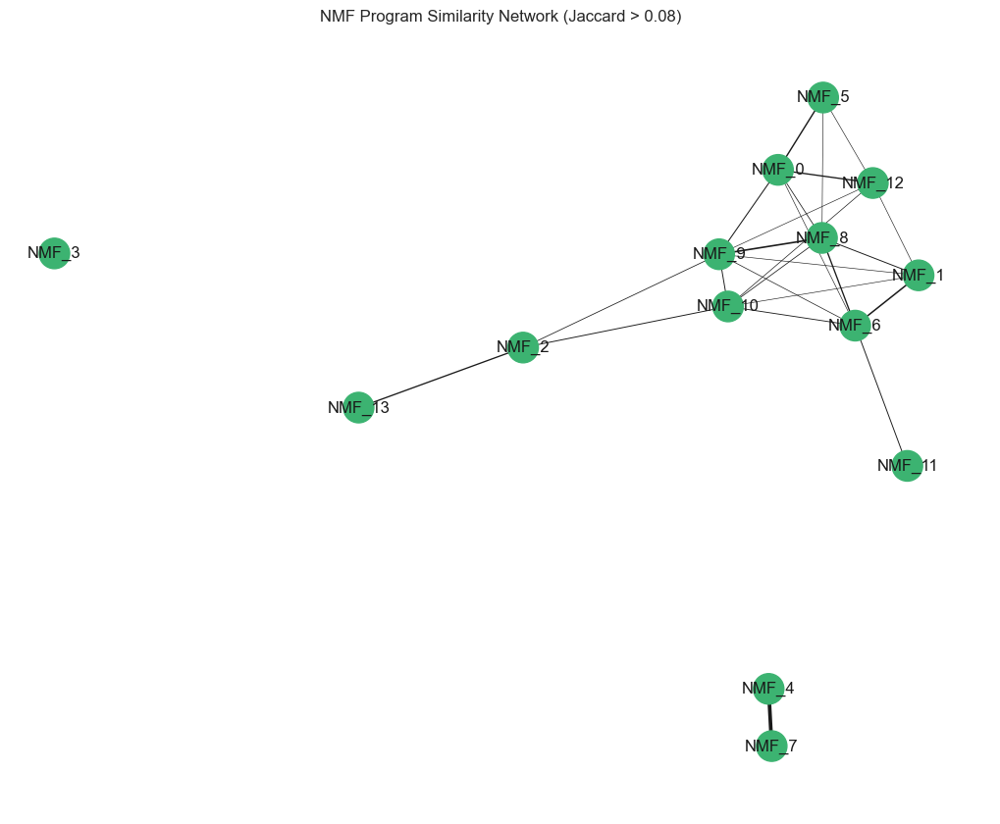

In [79]:
#Computing NETWORK GRAPH Visualization for NMFs
G = nx.Graph()

# Added nodes
for nmf, genes in nmf_genes.items():
    G.add_node(nmf, size=len(genes))

# Added edges based on Jaccard threshold
for _, row in df_overlap.iterrows():
    if row['jaccard'] > 0.08:  
        G.add_edge(row['nmf1'], row['nmf2'], weight=row['jaccard'])

pos = nx.spring_layout(G, seed=42)
edges = G.edges()
weights = [G[u][v]['weight']*5 for u,v in edges]  
node_color='orchid'  

plt.figure(figsize=(10,8))
nx.draw(G, pos, with_labels=True, width=weights, node_size=[G.nodes[n]['size']*10 for n in G.nodes()], node_color='mediumseagreen')
plt.title('NMF Program Similarity Network (Jaccard > 0.08)')
plt.show()



<Figure size 1440x1140 with 0 Axes>

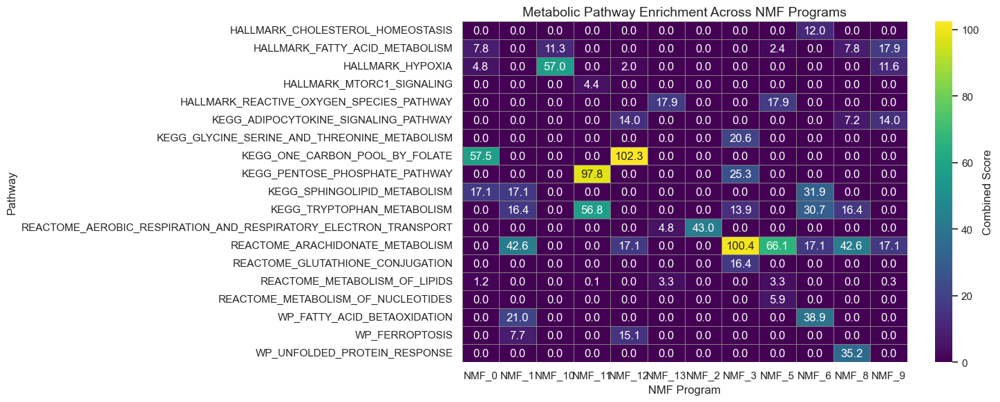

<Figure size 1680x840 with 0 Axes>

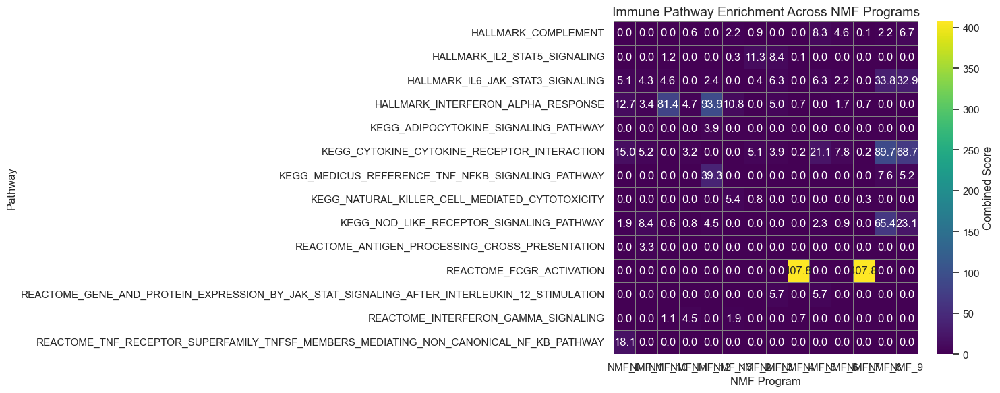

In [80]:

def plot_enrichment_heatmap(results_df, title, value_col='Combined Score'):
    
    # Keep only top 5 per NMF program for clarity
    top = (
        results_df.sort_values(value_col, ascending=False)
        .groupby('NMF_program')
        .head(5)
    )

    # Pivot to matrix (rows = pathway, cols = NMF programs)
    heatmap_data = top.pivot_table(
        index='Term',
        columns='NMF_program',
        values=value_col,
        aggfunc='max'  
    ).fillna(0)
    n_rows, n_cols = heatmap_data.shape
    plt.figure(figsize=(max(10, n_cols*1.2), max(6, n_rows*0.6)))

    # Plot
    plt.figure(figsize=(15, 6))
    sns.heatmap(
        heatmap_data,
        cmap="viridis",
        annot=True,
        fmt=".1f",
        cbar_kws={'label': value_col},
        linewidths=0.5,   
        linecolor='grey'  
    )
    plt.title(title, fontsize=14)
    plt.ylabel("Pathway")
    plt.xlabel("NMF Program")
    plt.tight_layout()
    plt.show()

plot_enrichment_heatmap(metabolic_results, "Metabolic Pathway Enrichment Across NMF Programs")
plot_enrichment_heatmap(immune_results, "Immune Pathway Enrichment Across NMF Programs")
